In [10]:
import sys
import os
import pandas as pd
import matplotlib.pyplot as plt
import importlib
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json

from statsmodels.regression.mixed_linear_model import MixedLM
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

import sklearn
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, GridSearchCV, KFold
from sklearn.linear_model import LogisticRegression, LinearRegression, SGDRegressor
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, BaggingClassifier, RandomForestRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.svm import LinearSVC, SVR
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import ConfusionMatrixDisplay, f1_score, make_scorer, confusion_matrix, mean_squared_error, mean_absolute_error
from sklearn.model_selection import GroupKFold
from sklearn.metrics import r2_score, mean_absolute_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from scipy.stats import randint, uniform
from sklearn.model_selection import GroupKFold, cross_val_score


from xgboost import XGBClassifier, XGBRegressor
from catboost import CatBoostClassifier
from catboost import Pool
import catboost as cb
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from itertools import product,chain

import plotly.express as px

from scipy.stats import pearsonr


import shap
shap.initjs()

# Get the absolute path of the project root
project_root = os.path.abspath(os.path.join(os.getcwd(), ".."))
# Add project root to sys.path
sys.path.append(project_root)
# Define data directory
brighten_dir = os.path.join(project_root, 'BRIGHTEN_data')
charts_dir = os.path.join(project_root, 'charts')
shap_dir = os.path.join(charts_dir, 'shap')
cv_dir = os.path.join(charts_dir, 'cv_scores')
val_dir = os.path.join(charts_dir, 'val_scores')

# Import and reload my custom scripts
from scripts import preprocessing as pre
from scripts import visualization as vis
from scripts import feature_selection as fs
from scripts import clustering as cl
from scripts import variables as var
from scripts import pca_model as pca
importlib.reload(pre)
importlib.reload(vis)
importlib.reload(fs)
importlib.reload(cl)
importlib.reload(var)
importlib.reload(pca)


# Import from cloned github repos
import hyperopt
print(hyperopt.__file__)
from hyperopt import tpe, hp, fmin, STATUS_OK, Trials
from hyperopt import tpe, hp, fmin, STATUS_OK, Trials
import hyperopt.pyll.stochastic
################ DEFINE column variables from data ###################
from scripts.variables import id_columns, daily_cols_v1, daily_v2_common 
from scripts.variables import phq2_cols, phq9_cols, weekly_cols, passive_cols, survey_cols

## Load in dfs scaled
df_names = ['v1_day', 'v2_day', 'v1_week', 'v2_week']
df_pca = ['v1_day_pca', 'v1_week_pca']
df_all = df_names + df_pca

if not 'idx' in id_columns:
    id_columns.append('idx')
print(id_columns)


########################################## MODELS #######################################
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, BaggingClassifier
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor, BaggingRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.svm import LinearSVC, LinearSVR
from xgboost import XGBClassifier, XGBRegressor
from catboost import CatBoostClassifier, CatBoostRegressor
import xgboost as xgb
# commenting out linear svm because we didn't drop skewed/two tailed variables
regs = [
    ('Decision Tree', DecisionTreeRegressor()),
    #('Linear SVM', LinearSVR(random_state=42, max_iter=10000, dual='auto')),
    ('Hist Gradient Tree', HistGradientBoostingRegressor()),
    ('Random Forest', RandomForestRegressor(random_state=42)),
    ('XGBoost', XGBRegressor(objective='reg:squarederror', random_state=42)),
    ('AdaBoost', AdaBoostRegressor(random_state=42)),
    ('Gradient Boost', GradientBoostingRegressor(random_state=42)),
    ('Bagging', BaggingRegressor(random_state=42)),
    ('CatBoost', CatBoostRegressor(random_state=42, verbose=0))
]


regs_someNA = [
    ('Hist Gradient Boost', HistGradientBoostingRegressor()),
    ('XGBoost', XGBRegressor(objective='reg:squarederror', random_state=42)),
    ('CatBoost', CatBoostRegressor(random_state=42, verbose=0))
]


/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/git_repos/hyperopt_repo/hyperopt/__init__.py
['num_id', 'dt', 'week', 'day', 'idx']


In [ ]:
#### Simple linear regression
from sklearn.linear_model import LinearRegression
# Step 1: Set x_cols to the various V1 PCs
y_var = 'pc_depression_phq2'
data = pd.read_csv(os.path.join(brighten_dir, 'v1_day_pca.csv'))
#print(data.columns.to_list())
results = pd.DataFrame()
count=0
x_cols = [col for col in data.columns.to_list() if 'pc_' in col and col!=y_var]
y_col = [y_var]

reg = LinearRegression().fit(data[x_cols], data[y_col])
print(reg.score(data[x_cols], data[y_col]))
print(reg.coef_)
print(reg.intercept_)

In [4]:
######### Mixed LM Model V1 vs phq2_sum #########
y_var = 'phq2_sum'
data = pd.read_csv(os.path.join(brighten_dir, 'v2_day_clean.csv'))
data["num_id"] = data["num_id"].astype("category")
model = smf.mixedlm(f"{y_var} ~ hours_active_hr + hours_stationary_nhw_hr + hours_of_sleep_hr + location_variance_hr + temp_mean", 
                    data=data, 
                    groups=data["num_id"])
result = model.fit()
print(f'Relationship to y_col {y_var}, Nested Linear Regression on "num_id"')
print(result.summary())


Relationship to y_col phq2_sum, Nested Linear Regression on "num_id"
              Mixed Linear Model Regression Results
Model:                MixedLM    Dependent Variable:    phq2_sum  
No. Observations:     1212       Method:                REML      
No. Groups:           16         Scale:                 0.3773    
Min. group size:      7          Log-Likelihood:        -1162.1799
Max. group size:      234        Converged:             Yes       
Mean group size:      75.8                                        
------------------------------------------------------------------
                        Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------
Intercept               -0.232    0.078 -2.973 0.003 -0.385 -0.079
hours_active_hr          0.002    0.027  0.062 0.951 -0.051  0.055
hours_stationary_nhw_hr -0.060    0.030 -1.999 0.046 -0.118 -0.001
hours_of_sleep_hr        0.029    0.034  0.834 0.404 -0.038  0.095
location

In [5]:
######### Mixed LM Model V1 vs phq2_sum #########
y_var = 'phq2_sum'
data = pd.read_csv(os.path.join(brighten_dir, 'v1_day_clean.csv'))
data[y_var] = data[y_var].astype(float)
data["num_id"] = data["num_id"].astype("category")
model = smf.mixedlm(f"{y_var} ~ mobility + mobility_radius + call_count + call_duration + sms_count", 
                    data=data, 
                    groups=data["num_id"])
result = model.fit()
print(f'Relationship to y_col {y_var}, Nested Linear Regression on "num_id"')
print(result.summary())


Relationship to y_col phq2_sum, Nested Linear Regression on "num_id"
          Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: phq2_sum   
No. Observations:  40422   Method:             REML       
No. Groups:        372     Scale:              0.5076     
Min. group size:   2       Log-Likelihood:     -44369.1232
Max. group size:   417     Converged:          Yes        
Mean group size:   108.7                                  
----------------------------------------------------------
                Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------
Intercept       -0.001    0.027 -0.021 0.984 -0.053  0.052
mobility        -0.025    0.007 -3.809 0.000 -0.038 -0.012
mobility_radius -0.011    0.007 -1.698 0.090 -0.024  0.002
call_count      -0.023    0.013 -1.826 0.068 -0.049  0.002
call_duration    0.040    0.012  3.358 0.001  0.017  0.064
sms_count       -0.004    0.008 -0.521 0.603 -0.019  0.01

In [6]:
######### Mixed LM Model V1 vs phq2_sum #########
y_var = 'phq9_sum'
data = pd.read_csv(os.path.join(brighten_dir, 'v1_week_clean.csv'))
data["num_id"] = data["num_id"].astype("category")
model = smf.mixedlm(f"{y_var} ~ mobility  + mobility_radius + sms_count + unreturned_calls + phq2_sum", 
                    data=data, 
                    groups=data["num_id"])
result = model.fit()
print(f'Relationship to y_col {y_var}, Nested Linear Regression on "num_id"')
print(result.summary())



Relationship to y_col phq9_sum, Nested Linear Regression on "num_id"
           Mixed Linear Model Regression Results
Model:              MixedLM  Dependent Variable:  phq9_sum 
No. Observations:   665      Method:              REML     
No. Groups:         113      Scale:               0.1919   
Min. group size:    1        Log-Likelihood:      -530.6997
Max. group size:    24       Converged:           Yes      
Mean group size:    5.9                                    
-----------------------------------------------------------
                 Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------
Intercept        -0.189    0.060 -3.168 0.002 -0.306 -0.072
mobility         -0.141    0.032 -4.434 0.000 -0.203 -0.079
mobility_radius  -0.031    0.028 -1.102 0.270 -0.085  0.024
sms_count         0.002    0.036  0.062 0.951 -0.068  0.072
unreturned_calls  0.036    0.025  1.467 0.142 -0.012  0.084
phq2_sum          0.387    0.036 10.715 0.

In [7]:
######### Mixed LM Model V1 vs phq2_sum #########
y_var = 'phq9_sum'
data = pd.read_csv(os.path.join(brighten_dir, 'v2_week_clean.csv'))
data["num_id"] = data["num_id"].astype("category")
model = smf.mixedlm(f"{y_var} ~ hours_active_hr + hours_stationary_nhw_hr + hours_of_sleep_hr + location_variance_hr + phq2_sum + temp_mean", 
                    data=data, 
                    groups=data["num_id"])
result = model.fit()
print(f'Relationship to y_col {y_var}, Nested Linear Regression on "num_id"')
print(result.summary())


Relationship to y_col phq9_sum, Nested Linear Regression on "num_id"
              Mixed Linear Model Regression Results
Model:                MixedLM     Dependent Variable:     phq9_sum
No. Observations:     77          Method:                 REML    
No. Groups:           15          Scale:                  0.3151  
Min. group size:      1           Log-Likelihood:         -81.3351
Max. group size:      14          Converged:              Yes     
Mean group size:      5.1                                         
------------------------------------------------------------------
                        Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------
Intercept               -0.089    0.191 -0.466 0.641 -0.463  0.285
hours_active_hr         -0.214    0.147 -1.463 0.144 -0.502  0.073
hours_stationary_nhw_hr -0.002    0.147 -0.012 0.991 -0.289  0.286
hours_of_sleep_hr        0.081    0.133  0.610 0.542 -0.179  0.341
location

### Model Selection - Classfication

We'll start by using several of the most popular classifiers with default parameters and compare how well they perform to indentify which might be best to proceed with.


We'll use cross-validation to get a better understanding of each models performance, rather than just a single test. Let's create a KFold object so we can use the same folds for each classifier.


## Run the classifiers (binary variable targets-- V1 Day and V2 Day)

In [ ]:
# results = {}
# for name in df_names:
#     if 'day' in name:
#         results[name] = {}
#         X_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_train.csv'))
#         y_train= pd.read_csv(os.path.join(brighten_dir, f'{name}_y_train.csv'))

#         X_train_cleaned = X_train.drop(columns=[col for col in X_train.columns if col in id_columns or 'Unnamed' in col])
#         y_train_cleaned = y_train.drop(columns=[col for col in y_train.columns if 'Unnamed' in col]).squeeze()
#         # Create KFold object with 10 folds
#         kf = KFold(n_splits=10, shuffle=True, random_state=42)

#         # Evaluate each classifier using cross-validation
#         for clf_name, clf in clfs:
#             cv_scores = cross_val_score(clf, X_train_cleaned, y_train_cleaned, cv=kf)
#             results[name][clf_name] = cv_scores


In [5]:
# # Extract data to flattened df for plotting
# flat_results = []

# for dataset_name, clf_results in results.items():
#     for clf_name, scores in clf_results.items():
#         for score in scores:
#             flat_results.append({
#                 'Dataset': dataset_name,
#                 'Classifier': clf_name,
#                 'Score': score
#             })

# results_df = pd.DataFrame(flat_results)

# plt.figure(figsize=(14, 8))
# sns.boxplot(x='Classifier', y='Score', hue='Dataset', data=results_df)
# plt.xticks(rotation=45)
# plt.title('Cross-Validation Scores by Classifier and Dataset')
# plt.show()


Using group K fold because we have subject data

Training shapes: y (45956,), X (45956, 21)
v1_day, Decision Tree
cv score: -0.3386537850850051, mae 0.6770190815586712 PMC: 0.341, p-val 0.000
cv score: -0.3545347766815008, mae 0.7245311023951883 PMC: 0.313, p-val 0.000
cv score: -0.41959438414812844, mae 0.7988468676005086 PMC: 0.246, p-val 0.000
cv score: -0.49569008099762435, mae 0.891660597967397 PMC: 0.221, p-val 0.000
cv score: -0.3348152787183345, mae 0.832913181735577 PMC: 0.276, p-val 0.000
R² on test for Decision Tree: -0.035, PMC: 0.475, p-val 0.000


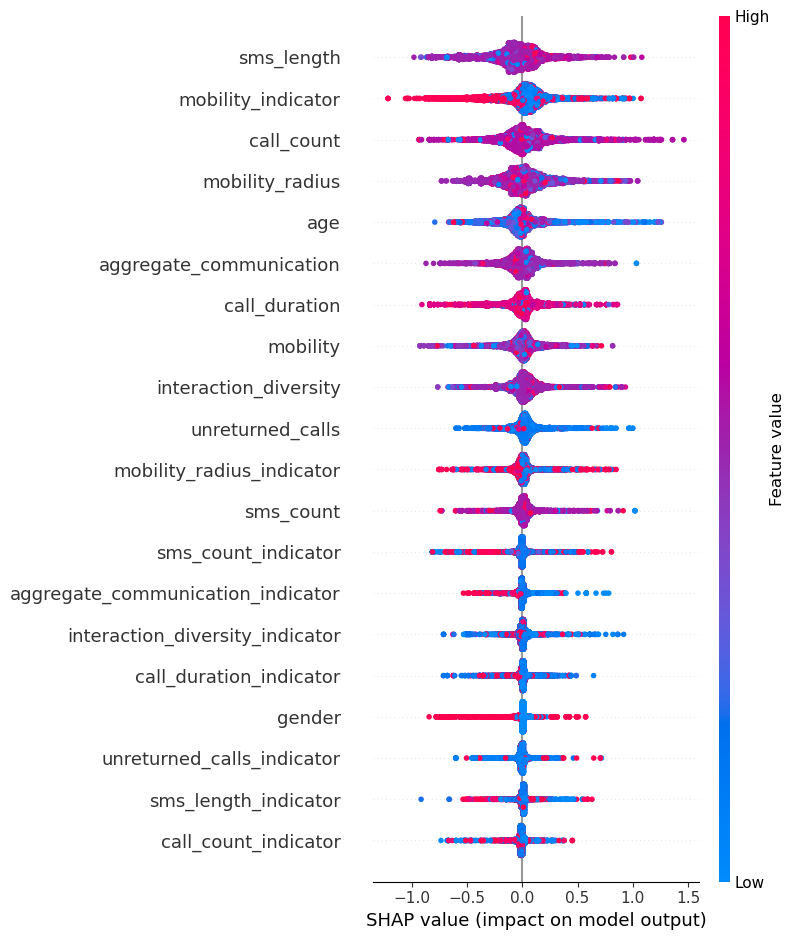

v1_day, Hist Gradient Tree
cv score: 0.16659210265073487, mae 0.6474623766127404 PMC: 0.413, p-val 0.000
cv score: 0.16624589398457357, mae 0.6802834575767865 PMC: 0.412, p-val 0.000
cv score: 0.05230999557857463, mae 0.7489458971198222 PMC: 0.273, p-val 0.000
cv score: 0.03408099501050599, mae 0.7852625525376868 PMC: 0.248, p-val 0.000
cv score: 0.09447606936695141, mae 0.7799789124850012 PMC: 0.313, p-val 0.000
R² on test for Hist Gradient Tree: 0.262, PMC: 0.515, p-val 0.000


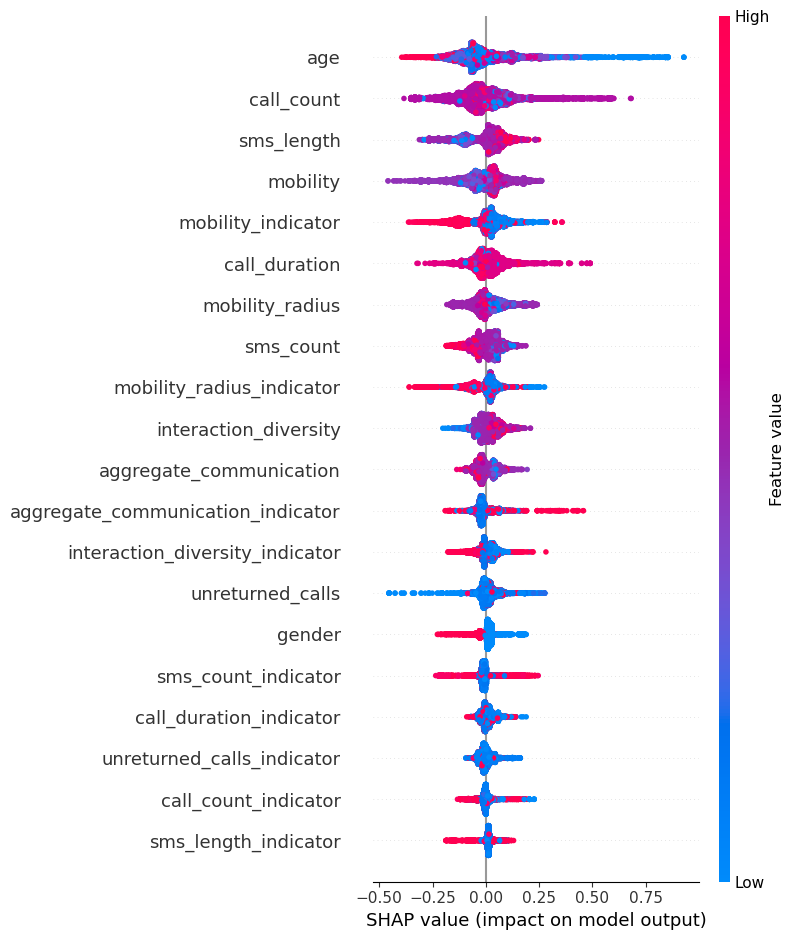

v1_day, Random Forest
cv score: 0.21873834619103905, mae 0.565851364849113 PMC: 0.493, p-val 0.000
cv score: 0.2738859143663638, mae 0.5760508521844114 PMC: 0.528, p-val 0.000
cv score: 0.1408263313179633, mae 0.6617876563479461 PMC: 0.403, p-val 0.000
cv score: 0.15546772868535075, mae 0.6931457871273106 PMC: 0.414, p-val 0.000
cv score: 0.17466494651585662, mae 0.7171485185885178 PMC: 0.431, p-val 0.000
R² on test for Random Forest: 0.420, PMC: 0.648, p-val 0.000


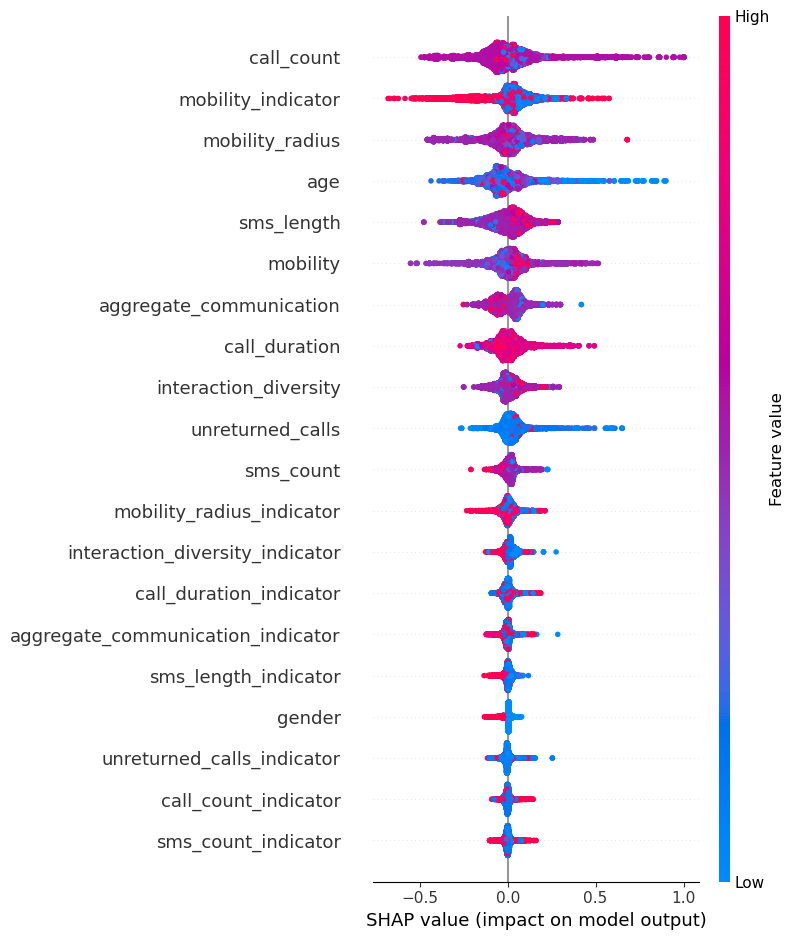

v1_day, XGBoost
cv score: 0.07817340675416984, mae 0.6659652022780161 PMC: 0.375, p-val 0.000
cv score: 0.13988256445749403, mae 0.6686884307185778 PMC: 0.398, p-val 0.000
cv score: 0.03380588691665565, mae 0.7503567408068583 PMC: 0.299, p-val 0.000
cv score: 0.013755089027444822, mae 0.7950064442262254 PMC: 0.285, p-val 0.000
cv score: 0.09630903316436379, mae 0.7755991040852062 PMC: 0.345, p-val 0.000
R² on test for XGBoost: 0.311, PMC: 0.560, p-val 0.000


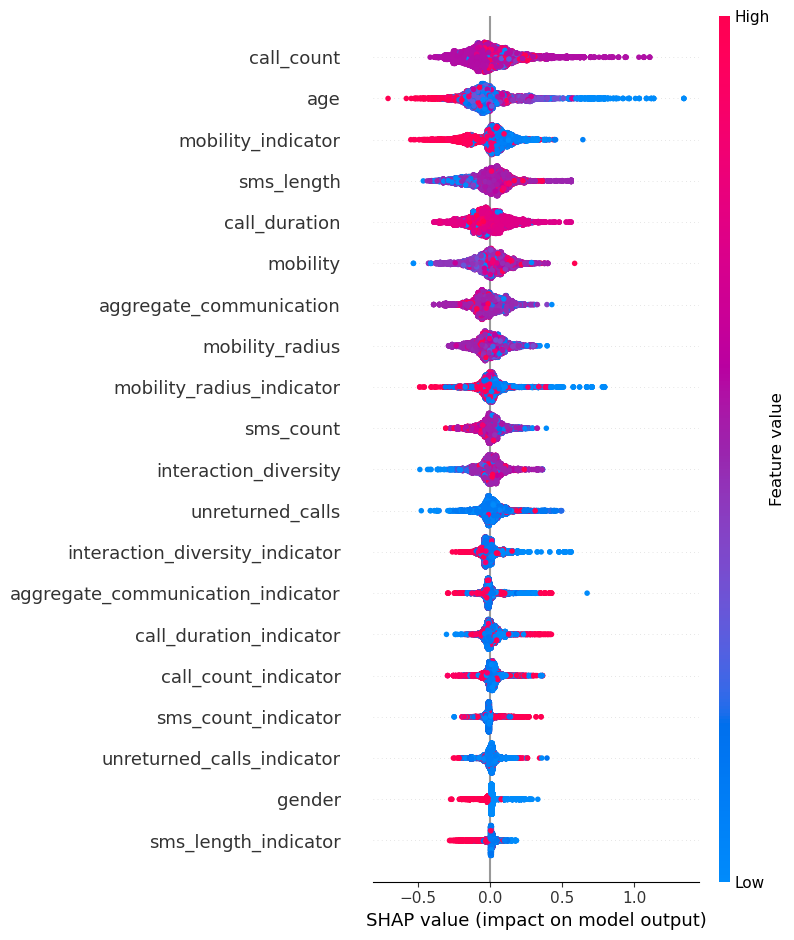

v1_day, AdaBoost
cv score: -0.07986639012373176, mae 0.7966941304430135 PMC: 0.159, p-val 0.000
cv score: -0.09560038690127182, mae 0.8628052551952515 PMC: 0.208, p-val 0.000
cv score: -0.03511990972713264, mae 0.860052386308113 PMC: 0.110, p-val 0.000
cv score: -0.04175011573378562, mae 0.8966790812172125 PMC: 0.066, p-val 0.000
cv score: -0.003618950542855215, mae 0.8918700221121856 PMC: 0.179, p-val 0.000
R² on test for AdaBoost: -0.037, PMC: 0.228, p-val 0.000
v1_day, Gradient Boost
cv score: 0.07714498787154278, mae 0.6923008026219477 PMC: 0.285, p-val 0.000
cv score: 0.05122750280459076, mae 0.7357784270553712 PMC: 0.239, p-val 0.000
cv score: 0.008060351933912524, mae 0.7679423183579085 PMC: 0.164, p-val 0.000
cv score: -0.01479101770635416, mae 0.8146711482571982 PMC: 0.103, p-val 0.000
cv score: 0.055684995516060654, mae 0.8046015848048935 PMC: 0.239, p-val 0.000
R² on test for Gradient Boost: 0.129, PMC: 0.368, p-val 0.000


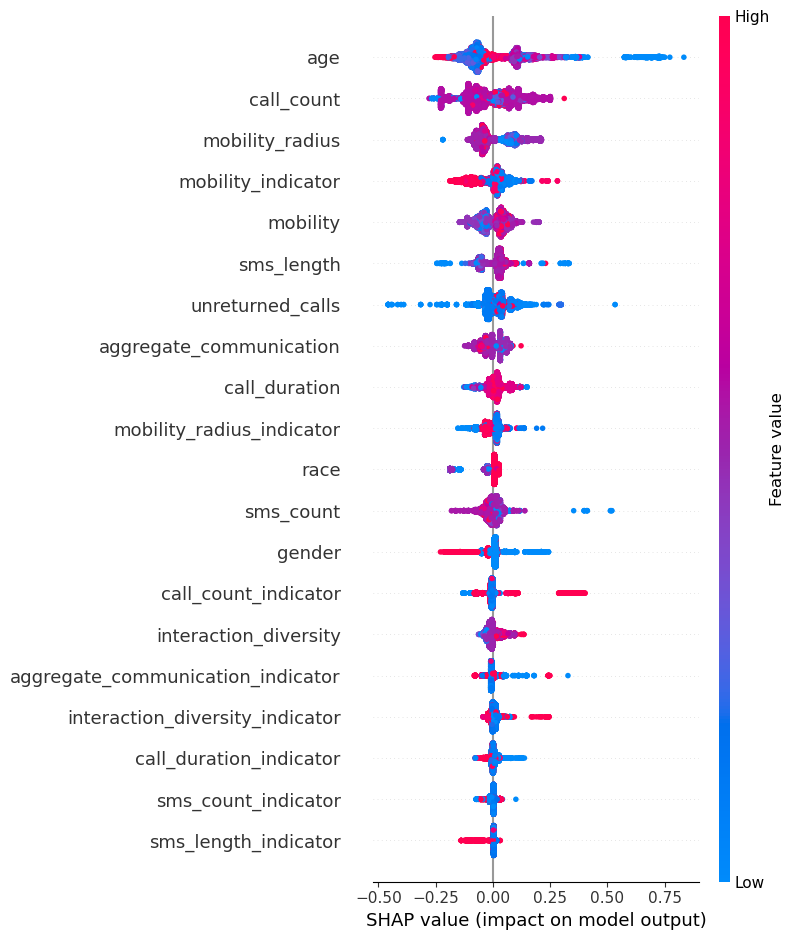

v1_day, Bagging
cv score: 0.15397885695676228, mae 0.5874260212675947 PMC: 0.455, p-val 0.000
cv score: 0.22542284501665422, mae 0.5930113171414674 PMC: 0.494, p-val 0.000
cv score: 0.0839186881362537, mae 0.6875108808902237 PMC: 0.368, p-val 0.000
cv score: 0.09383179711584977, mae 0.7215554778617543 PMC: 0.374, p-val 0.000
cv score: 0.08655946264091585, mae 0.7562324845782592 PMC: 0.359, p-val 0.000
R² on test for Bagging: 0.377, PMC: 0.620, p-val 0.000
v1_day, CatBoost
cv score: 0.1569851740530338, mae 0.6492960876904382 PMC: 0.422, p-val 0.000
cv score: 0.16882100029742042, mae 0.6737897064890963 PMC: 0.419, p-val 0.000
cv score: 0.0718858392801136, mae 0.7412934210812735 PMC: 0.309, p-val 0.000
cv score: 0.007224809572709989, mae 0.8011190601891055 PMC: 0.246, p-val 0.000
cv score: 0.0997463215810811, mae 0.7760279909540061 PMC: 0.329, p-val 0.000
R² on test for CatBoost: 0.305, PMC: 0.552, p-val 0.000


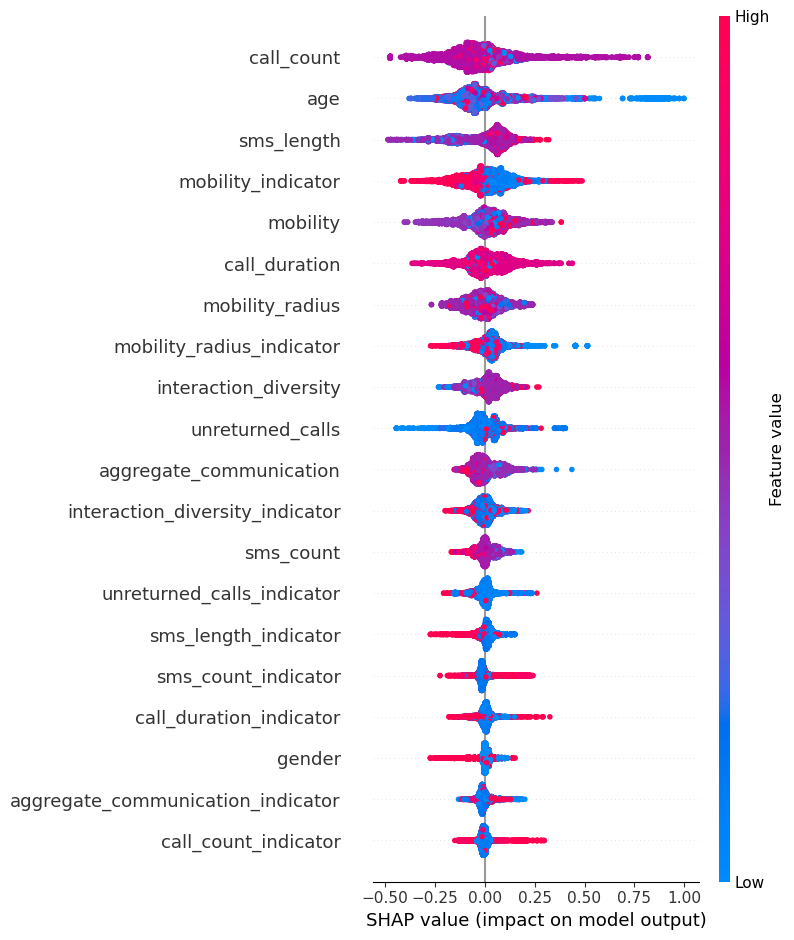

Training shapes: y (14550,), X (14550, 56)
v2_day, Decision Tree
cv score: -0.49560912163046744, mae 0.7774735435270266 PMC: 0.227, p-val 0.000
cv score: -0.9710438772006906, mae 0.8673409775142351 PMC: 0.287, p-val 0.000
cv score: -0.8041974117550081, mae 0.7569870421785871 PMC: 0.161, p-val 0.000
cv score: -1.1764601112468154, mae 0.887443305069113 PMC: 0.117, p-val 0.000
cv score: -0.7261343991603857, mae 0.8251502637278642 PMC: 0.137, p-val 0.000
R² on test for Decision Tree: -0.665, PMC: 0.266, p-val 0.000


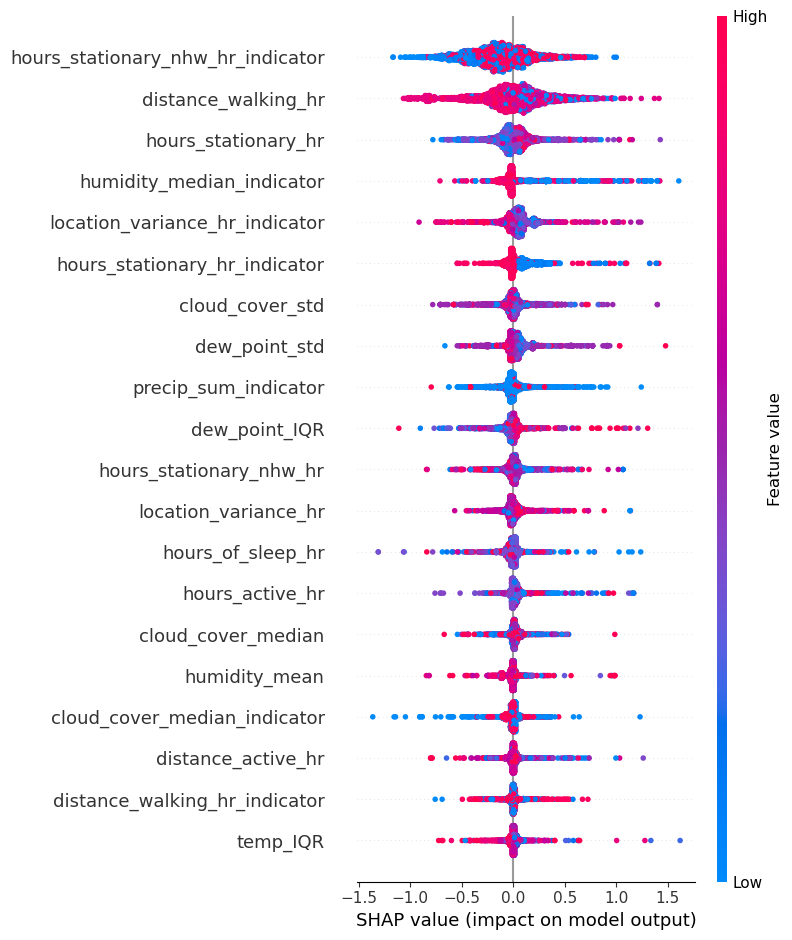

v2_day, Hist Gradient Tree
cv score: 0.191353107085229, mae 0.5837584296461522 PMC: 0.438, p-val 0.000
cv score: 0.23983624533210313, mae 0.5856666557291315 PMC: 0.522, p-val 0.000
cv score: 0.15283107892306458, mae 0.5551847635127535 PMC: 0.401, p-val 0.000
cv score: -0.024658071491294065, mae 0.6578288206903441 PMC: 0.221, p-val 0.000
cv score: 0.0012403519800061602, mae 0.635432030915573 PMC: 0.227, p-val 0.000
R² on test for Hist Gradient Tree: 0.208, PMC: 0.470, p-val 0.000


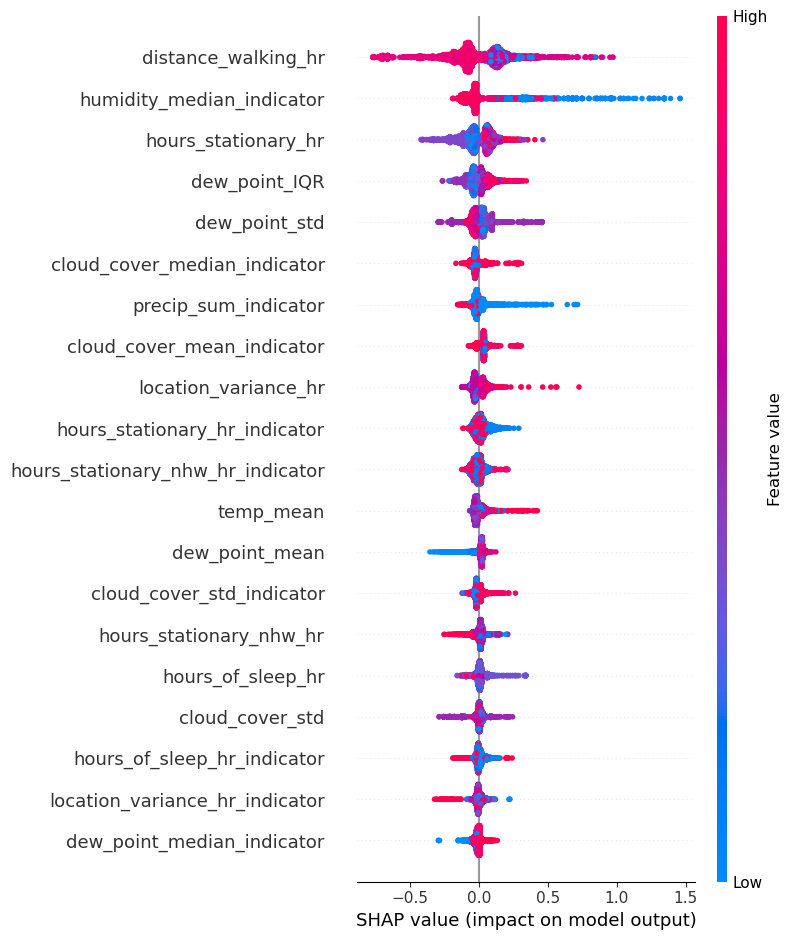

v2_day, Random Forest
cv score: 0.20575523595744827, mae 0.5856146756415812 PMC: 0.457, p-val 0.000
cv score: 0.21328062507830914, mae 0.5937759927402733 PMC: 0.521, p-val 0.000
cv score: 0.13840190242177897, mae 0.5796853034752907 PMC: 0.384, p-val 0.000
cv score: -0.06499323122326128, mae 0.6758301777581791 PMC: 0.212, p-val 0.000
cv score: -0.008919129574582962, mae 0.6419378639779403 PMC: 0.221, p-val 0.000
R² on test for Random Forest: 0.203, PMC: 0.473, p-val 0.000


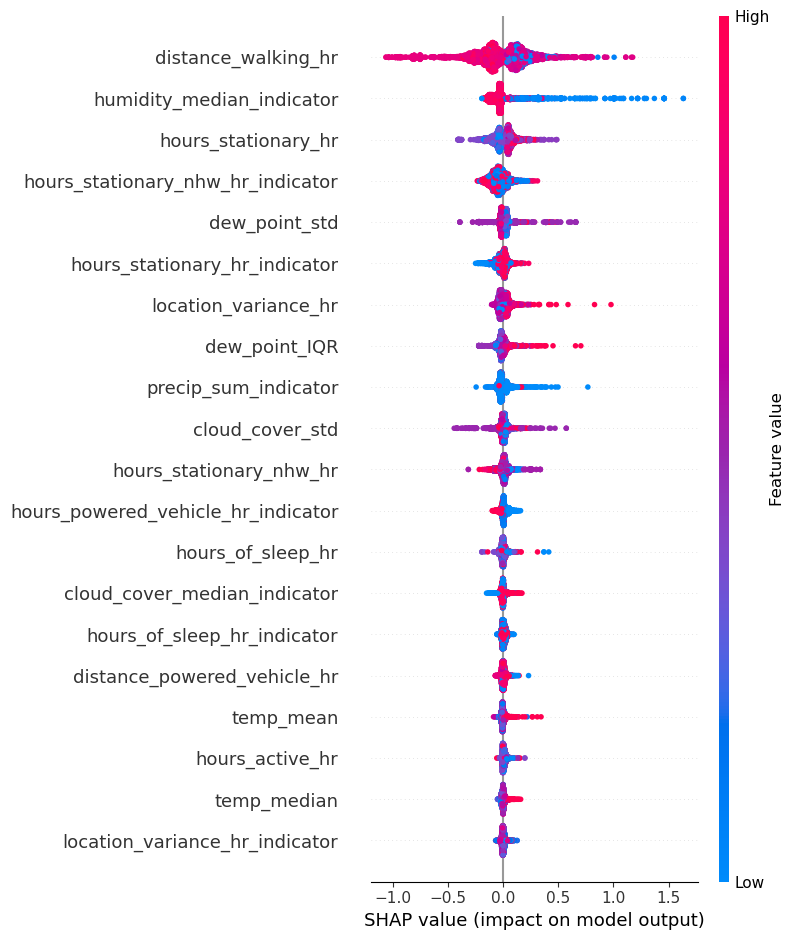

v2_day, XGBoost
cv score: 0.1091098813176109, mae 0.6315516538880813 PMC: 0.379, p-val 0.000
cv score: 0.11689891120559948, mae 0.6637460190945262 PMC: 0.483, p-val 0.000
cv score: 0.07721686401003569, mae 0.625149411272452 PMC: 0.356, p-val 0.000
cv score: -0.15837079179390545, mae 0.7220437796051968 PMC: 0.185, p-val 0.000
cv score: -0.11242184057137461, mae 0.7172958650127325 PMC: 0.200, p-val 0.000
R² on test for XGBoost: 0.167, PMC: 0.461, p-val 0.000


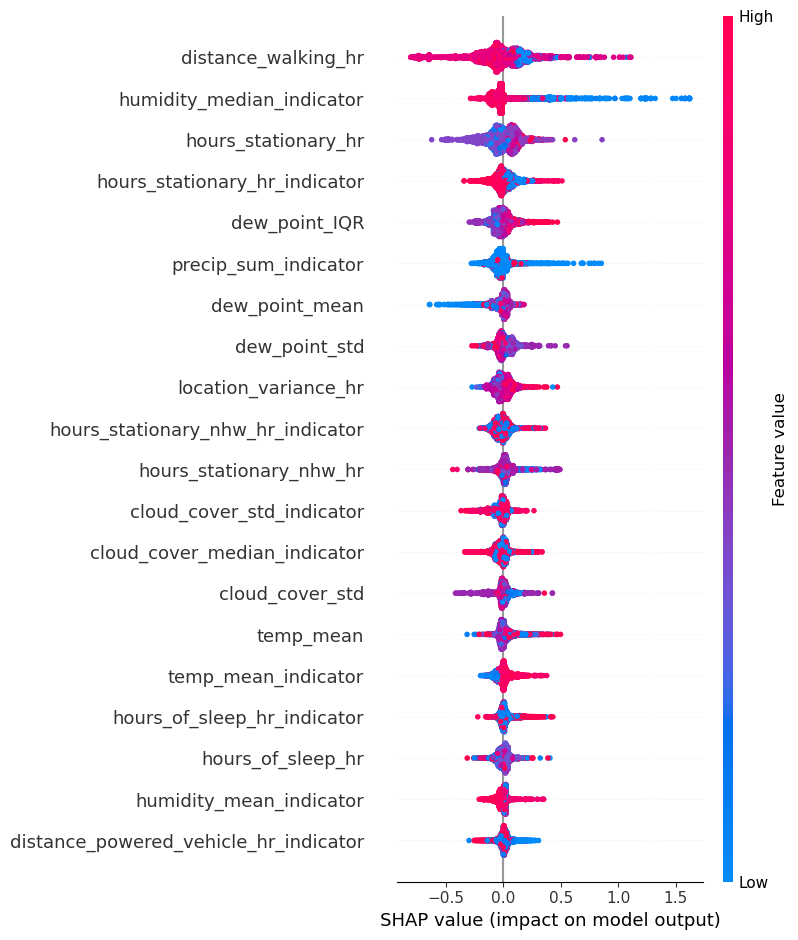

v2_day, AdaBoost
cv score: -0.14101365435848878, mae 0.9489703697480063 PMC: 0.252, p-val 0.000
cv score: -0.31957656785210586, mae 1.0033641227716288 PMC: 0.242, p-val 0.000
cv score: -0.0943437385093795, mae 0.8342302952962383 PMC: 0.273, p-val 0.000
cv score: -0.21544440967119605, mae 0.8959148864156351 PMC: 0.174, p-val 0.000
cv score: -0.30310514583425374, mae 0.9865172022717036 PMC: 0.085, p-val 0.000
R² on test for AdaBoost: -0.377, PMC: 0.288, p-val 0.000
v2_day, Gradient Boost
cv score: 0.13458567063282267, mae 0.6170623386505689 PMC: 0.369, p-val 0.000
cv score: 0.1772943166343951, mae 0.6117335230901234 PMC: 0.438, p-val 0.000
cv score: 0.12431762607286079, mae 0.5699385590926115 PMC: 0.357, p-val 0.000
cv score: 0.021495650966641744, mae 0.647757908121716 PMC: 0.225, p-val 0.000
cv score: 0.0001475562433422839, mae 0.6573448499872707 PMC: 0.158, p-val 0.000
R² on test for Gradient Boost: 0.164, PMC: 0.417, p-val 0.000


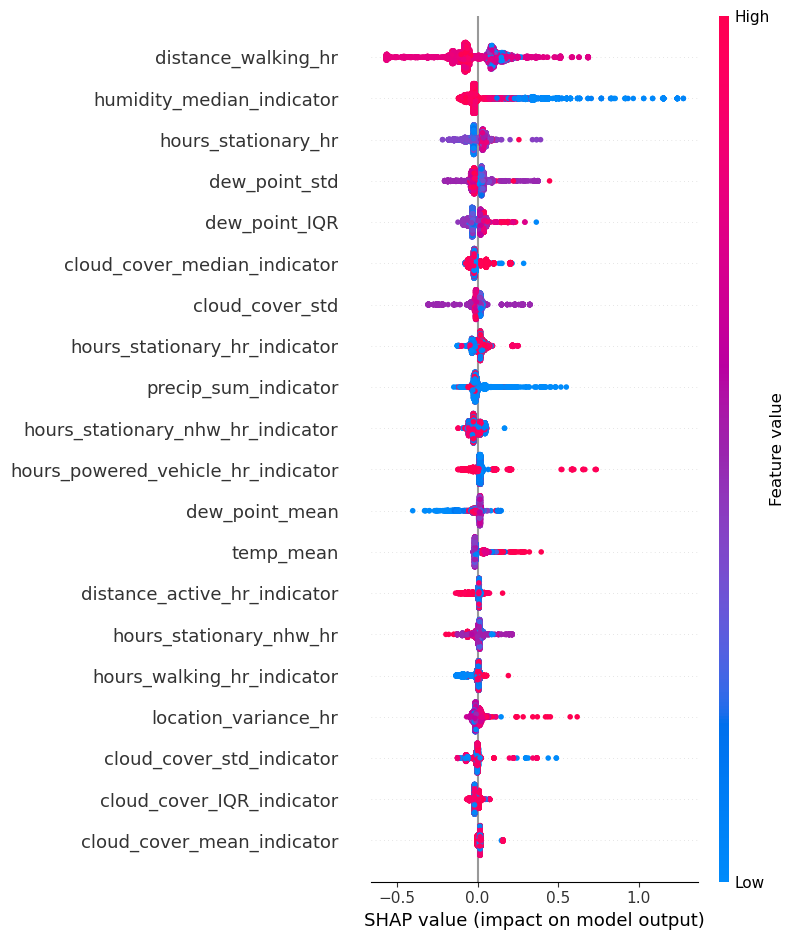

v2_day, Bagging
cv score: 0.11777254920029323, mae 0.6357320860442396 PMC: 0.383, p-val 0.000
cv score: 0.11978647185939639, mae 0.6300048415067516 PMC: 0.476, p-val 0.000
cv score: 0.001219470385582122, mae 0.6447027596752644 PMC: 0.292, p-val 0.000
cv score: -0.15727634286528813, mae 0.7090335006670075 PMC: 0.173, p-val 0.000
cv score: -0.09638768341289605, mae 0.6901190512624581 PMC: 0.186, p-val 0.000
R² on test for Bagging: 0.098, PMC: 0.404, p-val 0.000
v2_day, CatBoost
cv score: 0.20286113716567233, mae 0.5809068239978773 PMC: 0.451, p-val 0.000
cv score: 0.24064460939782073, mae 0.600510123883708 PMC: 0.527, p-val 0.000
cv score: 0.16523856746302334, mae 0.5791635835843554 PMC: 0.415, p-val 0.000
cv score: -0.038099751955247285, mae 0.6832627296297833 PMC: 0.219, p-val 0.000
cv score: -0.01682198182997685, mae 0.6665007767333077 PMC: 0.214, p-val 0.000
R² on test for CatBoost: 0.201, PMC: 0.468, p-val 0.000


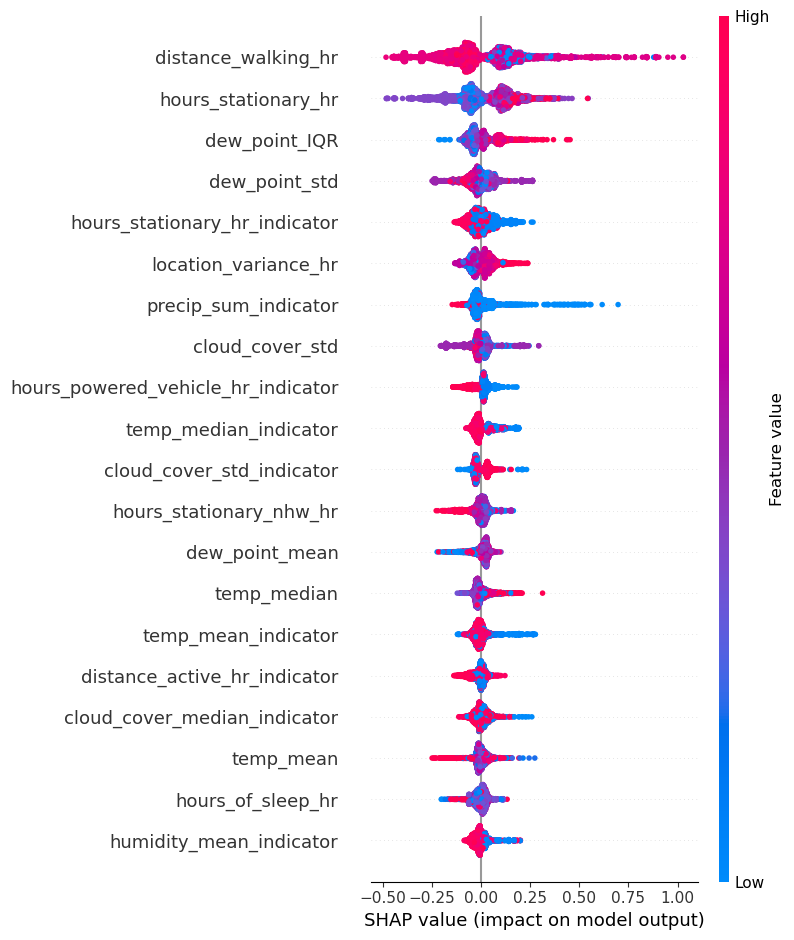

Training shapes: y (3348,), X (3348, 24)
v1_week, Decision Tree
cv score: 0.01984959984768231, mae 1.2111239786708214 PMC: 0.514, p-val 0.000
cv score: -0.24389725690968822, mae 1.3397622462950167 PMC: 0.356, p-val 0.000
cv score: -0.5314996616991086, mae 1.2145029555322455 PMC: 0.392, p-val 0.000
cv score: -0.2529643158850501, mae 1.3629950609562067 PMC: 0.346, p-val 0.000
cv score: -0.2339159819901413, mae 1.2299453183483744 PMC: 0.417, p-val 0.000
R² on test for Decision Tree: -0.291, PMC: 0.412, p-val 0.000


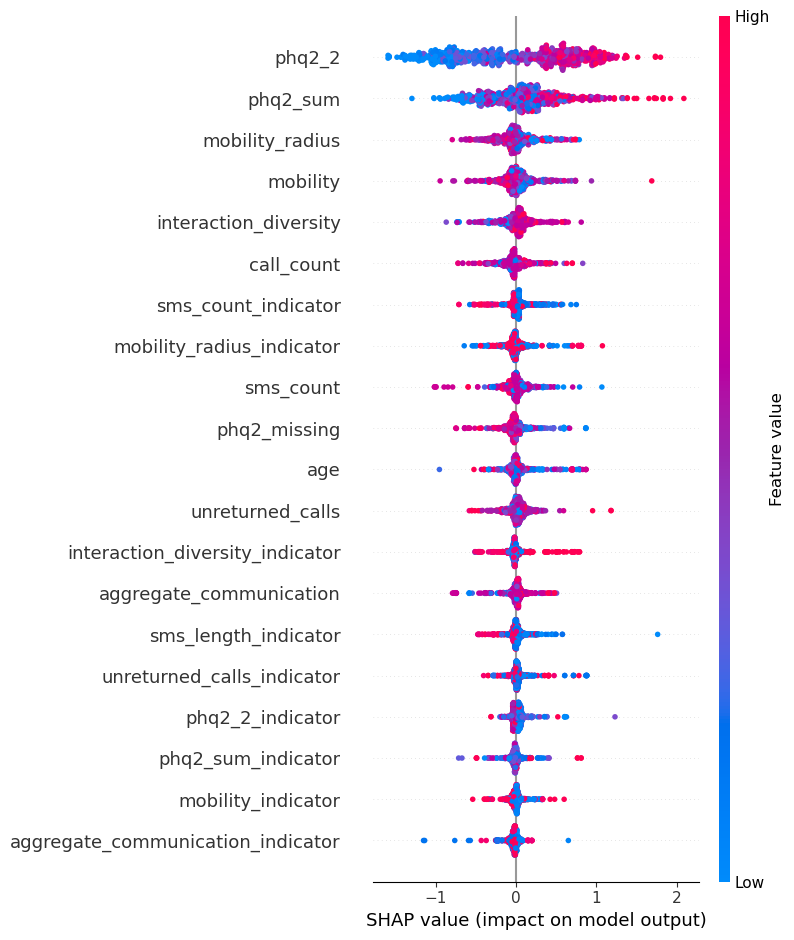

v1_week, Hist Gradient Tree
cv score: 0.4631686782531097, mae 0.8634164685835799 PMC: 0.682, p-val 0.000
cv score: 0.28021586211873406, mae 1.0520643357020814 PMC: 0.539, p-val 0.000
cv score: 0.09487214985046555, mae 0.9466967139661876 PMC: 0.469, p-val 0.000
cv score: 0.3142294075289923, mae 1.0287724262488749 PMC: 0.563, p-val 0.000
cv score: 0.31304594159553545, mae 0.8836720182651487 PMC: 0.576, p-val 0.000
R² on test for Hist Gradient Tree: 0.374, PMC: 0.627, p-val 0.000


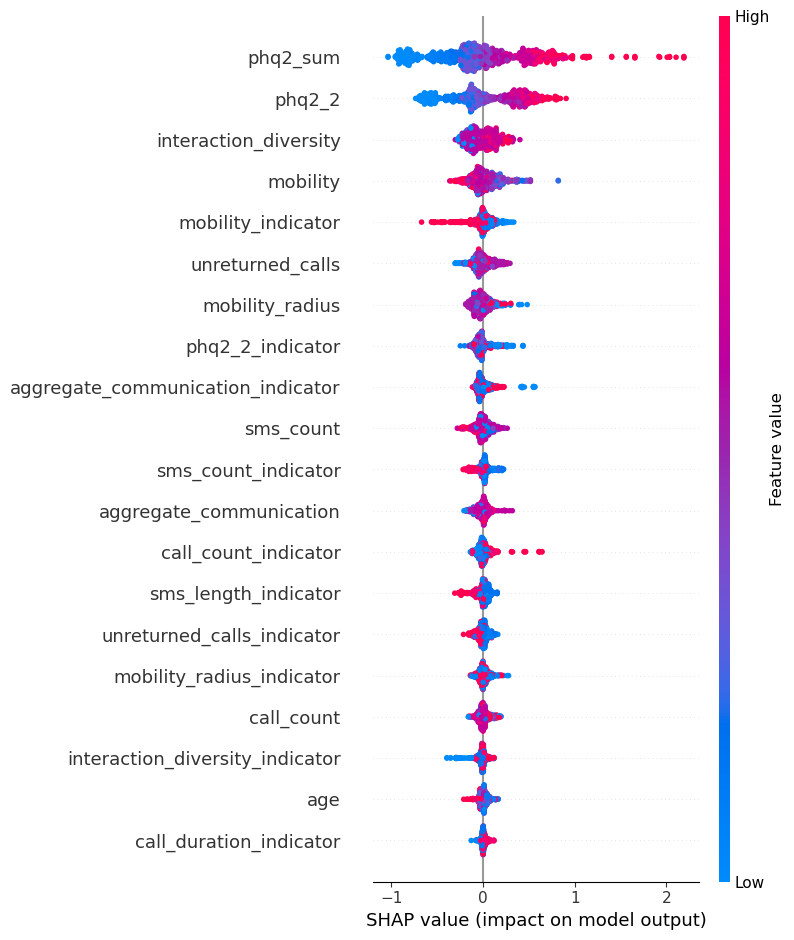

v1_week, Random Forest
cv score: 0.4825487041250134, mae 0.8679036142719425 PMC: 0.697, p-val 0.000
cv score: 0.35008841716852757, mae 0.9931954350831217 PMC: 0.593, p-val 0.000
cv score: 0.1809467909410275, mae 0.8994813330361877 PMC: 0.510, p-val 0.000
cv score: 0.3297846671482736, mae 0.9936494860450805 PMC: 0.574, p-val 0.000
cv score: 0.34810947624548316, mae 0.8751131449969783 PMC: 0.595, p-val 0.000
R² on test for Random Forest: 0.363, PMC: 0.621, p-val 0.000


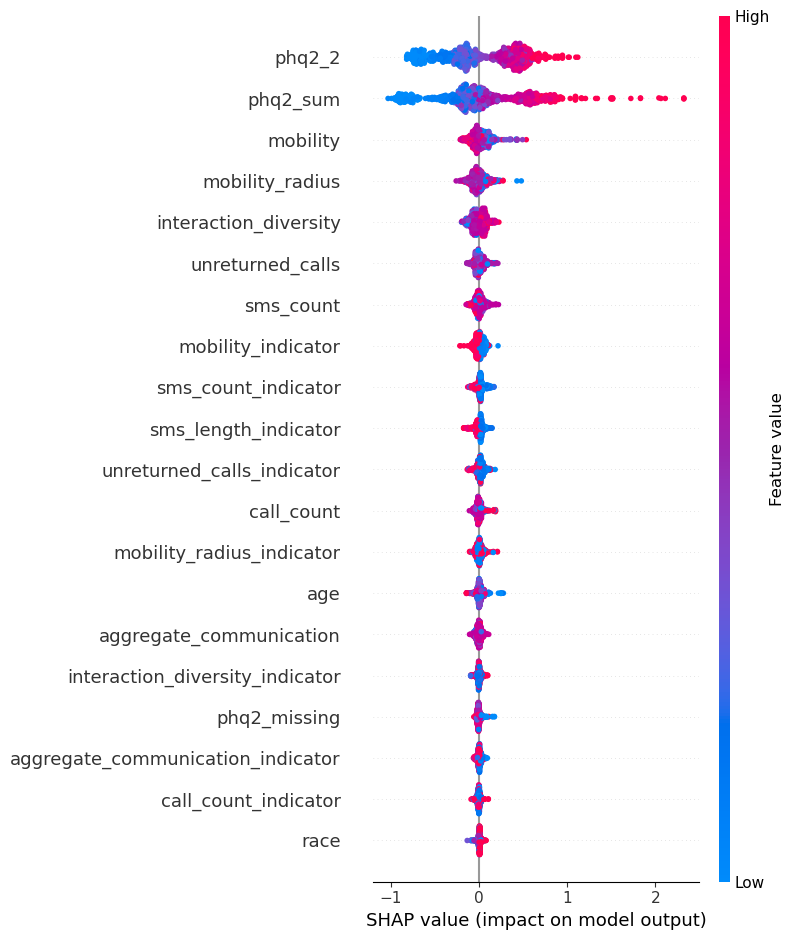

v1_week, XGBoost
cv score: 0.38039238312614765, mae 0.9468101516318033 PMC: 0.627, p-val 0.000
cv score: 0.3169240916016203, mae 1.019808119416383 PMC: 0.579, p-val 0.000
cv score: 0.06110312028354992, mae 0.9603661866710771 PMC: 0.445, p-val 0.000
cv score: 0.24517842593999084, mae 1.0630221209231632 PMC: 0.512, p-val 0.000
cv score: 0.23853086388846234, mae 0.9488771802016416 PMC: 0.533, p-val 0.000
R² on test for XGBoost: 0.310, PMC: 0.589, p-val 0.000


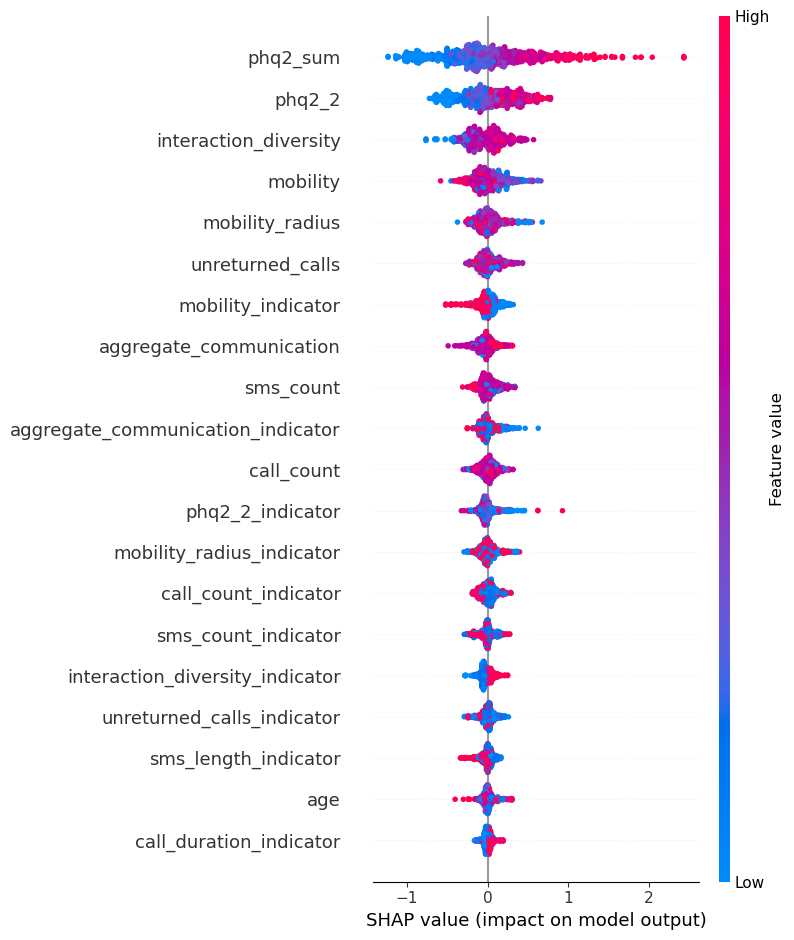

v1_week, AdaBoost
cv score: 0.4596512844272648, mae 0.9344367852497526 PMC: 0.711, p-val 0.000
cv score: 0.2962924647655577, mae 1.0806491355542571 PMC: 0.569, p-val 0.000
cv score: 0.17814943714180997, mae 0.9071962515584495 PMC: 0.506, p-val 0.000
cv score: 0.32875768723427334, mae 1.0336362041657594 PMC: 0.588, p-val 0.000
cv score: 0.33563203022603927, mae 0.9111730347407565 PMC: 0.614, p-val 0.000
R² on test for AdaBoost: 0.264, PMC: 0.604, p-val 0.000
v1_week, Gradient Boost
cv score: 0.5012312096141334, mae 0.8586486221434058 PMC: 0.710, p-val 0.000
cv score: 0.33721724230884353, mae 1.023515008623056 PMC: 0.581, p-val 0.000
cv score: 0.19863802889280913, mae 0.8891529866912758 PMC: 0.513, p-val 0.000
cv score: 0.33733887135154317, mae 1.0149689148210654 PMC: 0.582, p-val 0.000
cv score: 0.37191669067401256, mae 0.8564126265745902 PMC: 0.613, p-val 0.000
R² on test for Gradient Boost: 0.371, PMC: 0.621, p-val 0.000


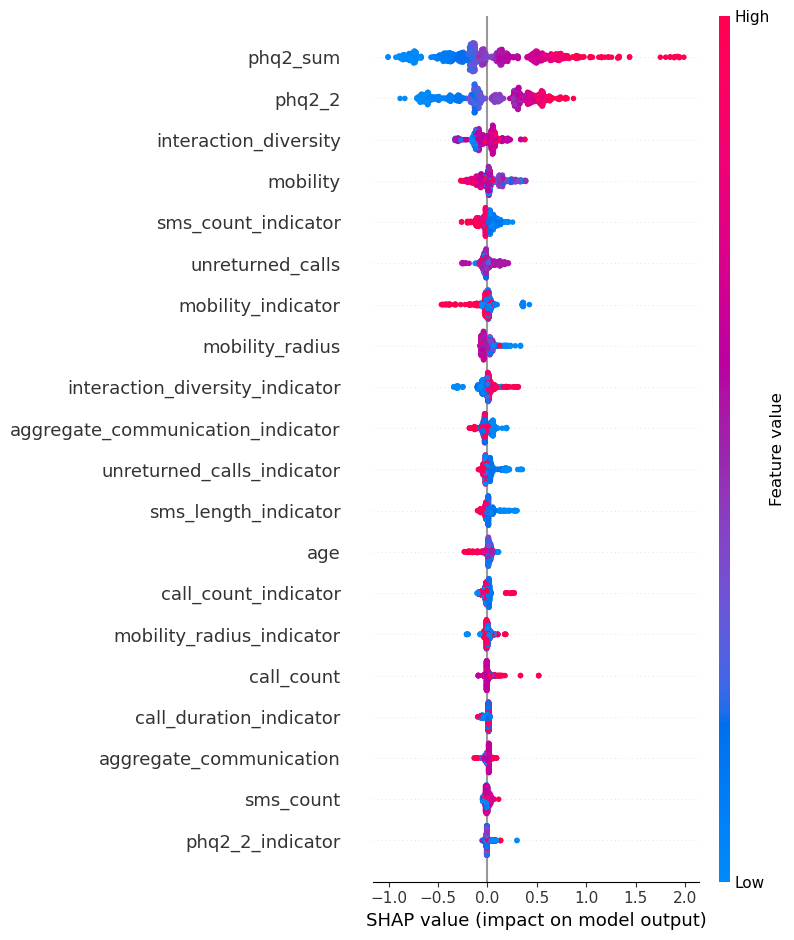

v1_week, Bagging
cv score: 0.42862071873064145, mae 0.9252794507647755 PMC: 0.666, p-val 0.000
cv score: 0.32567915782444035, mae 1.0153523327088392 PMC: 0.578, p-val 0.000
cv score: 0.07071170555051431, mae 0.9426620689632782 PMC: 0.463, p-val 0.000
cv score: 0.3003130761036683, mae 1.026189138534303 PMC: 0.551, p-val 0.000
cv score: 0.2535100511844015, mae 0.9471440704338804 PMC: 0.530, p-val 0.000
R² on test for Bagging: 0.300, PMC: 0.582, p-val 0.000
v1_week, CatBoost
cv score: 0.4402242810824416, mae 0.9051796707277853 PMC: 0.665, p-val 0.000
cv score: 0.3434204960909374, mae 1.0050518509508215 PMC: 0.588, p-val 0.000
cv score: 0.13136139644746492, mae 0.9335810459457212 PMC: 0.464, p-val 0.000
cv score: 0.3045473440099975, mae 1.0313021510201232 PMC: 0.553, p-val 0.000
cv score: 0.3749978013574575, mae 0.8611698878126853 PMC: 0.617, p-val 0.000
R² on test for CatBoost: 0.408, PMC: 0.652, p-val 0.000


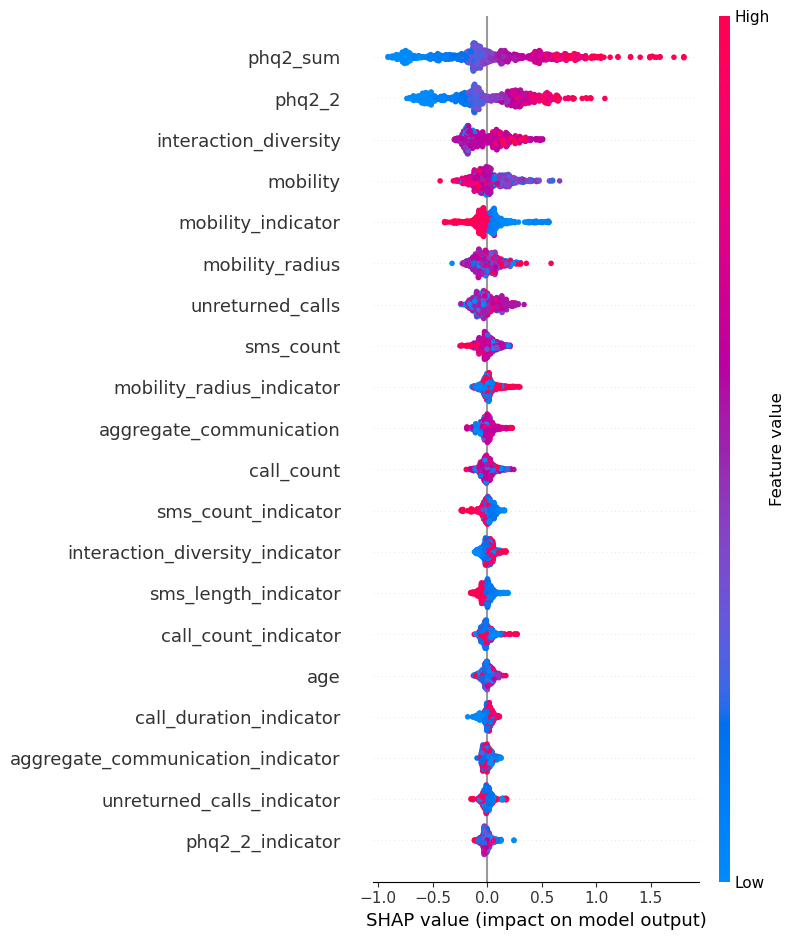

Training shapes: y (795,), X (795, 60)
v2_week, Decision Tree
cv score: -0.6752596768531272, mae 1.6453160241958558 PMC: 0.323, p-val 0.000
cv score: -0.47981188721019286, mae 1.8316884299386842 PMC: 0.243, p-val 0.002
cv score: -0.3451950982723242, mae 1.5004859991704411 PMC: 0.371, p-val 0.000
cv score: -0.1485997558240999, mae 1.3064433183149349 PMC: 0.480, p-val 0.000
cv score: -0.2574568495538596, mae 1.7411276314608317 PMC: 0.343, p-val 0.000
R² on test for Decision Tree: -0.599, PMC: 0.279, p-val 0.000


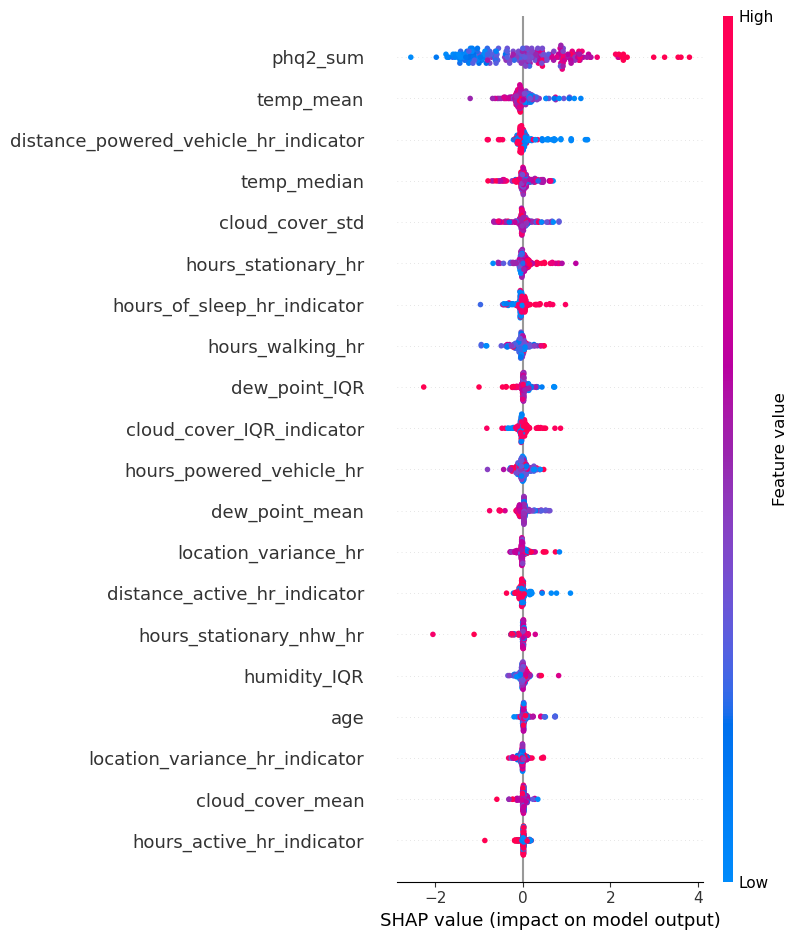

v2_week, Hist Gradient Tree
cv score: 0.23504542282049612, mae 1.115095629919467 PMC: 0.529, p-val 0.000
cv score: 0.28943020859217605, mae 1.21529137352702 PMC: 0.541, p-val 0.000
cv score: 0.17650680792381845, mae 1.1591243610127735 PMC: 0.519, p-val 0.000
cv score: 0.031033554831160215, mae 1.1906503111039655 PMC: 0.480, p-val 0.000
cv score: 0.33649083028306215, mae 1.290597599954435 PMC: 0.588, p-val 0.000
R² on test for Hist Gradient Tree: 0.173, PMC: 0.494, p-val 0.000


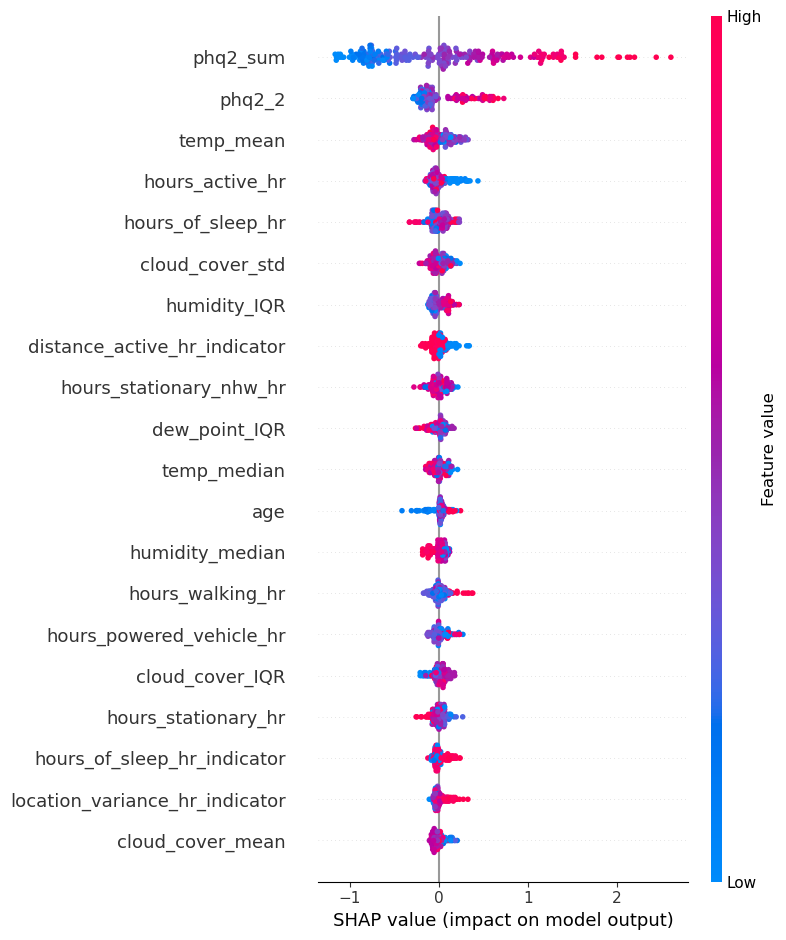

v2_week, Random Forest
cv score: 0.28219540584552927, mae 1.1106416230396325 PMC: 0.549, p-val 0.000
cv score: 0.2864480884850389, mae 1.235629378826237 PMC: 0.540, p-val 0.000
cv score: 0.17097751429786656, mae 1.1775458994831562 PMC: 0.498, p-val 0.000
cv score: 0.16027458302401054, mae 1.1312165451115495 PMC: 0.511, p-val 0.000
cv score: 0.409616432091899, mae 1.2267679883710896 PMC: 0.664, p-val 0.000
R² on test for Random Forest: 0.241, PMC: 0.537, p-val 0.000


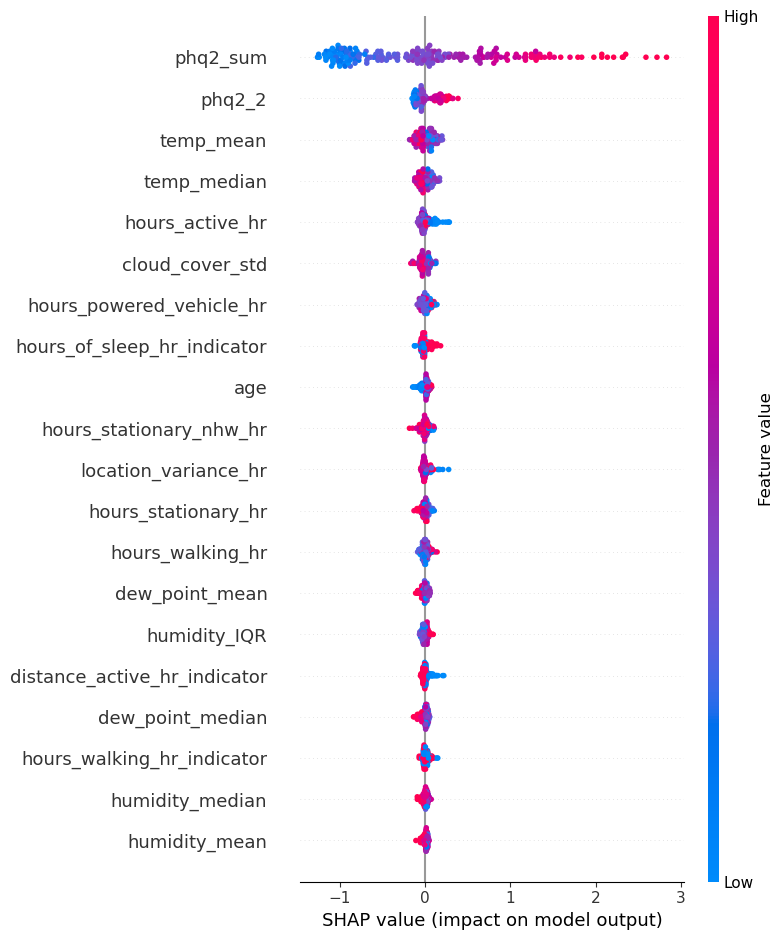

v2_week, XGBoost
cv score: 0.20785703807924327, mae 1.1305803170841622 PMC: 0.508, p-val 0.000
cv score: 0.31143502626035946, mae 1.1974793081262385 PMC: 0.566, p-val 0.000
cv score: 0.08300045230550346, mae 1.1920619681725193 PMC: 0.524, p-val 0.000
cv score: -0.005109742477094059, mae 1.194003268358835 PMC: 0.447, p-val 0.000
cv score: 0.24114646328416067, mae 1.4059639213591126 PMC: 0.493, p-val 0.000
R² on test for XGBoost: 0.083, PMC: 0.438, p-val 0.000


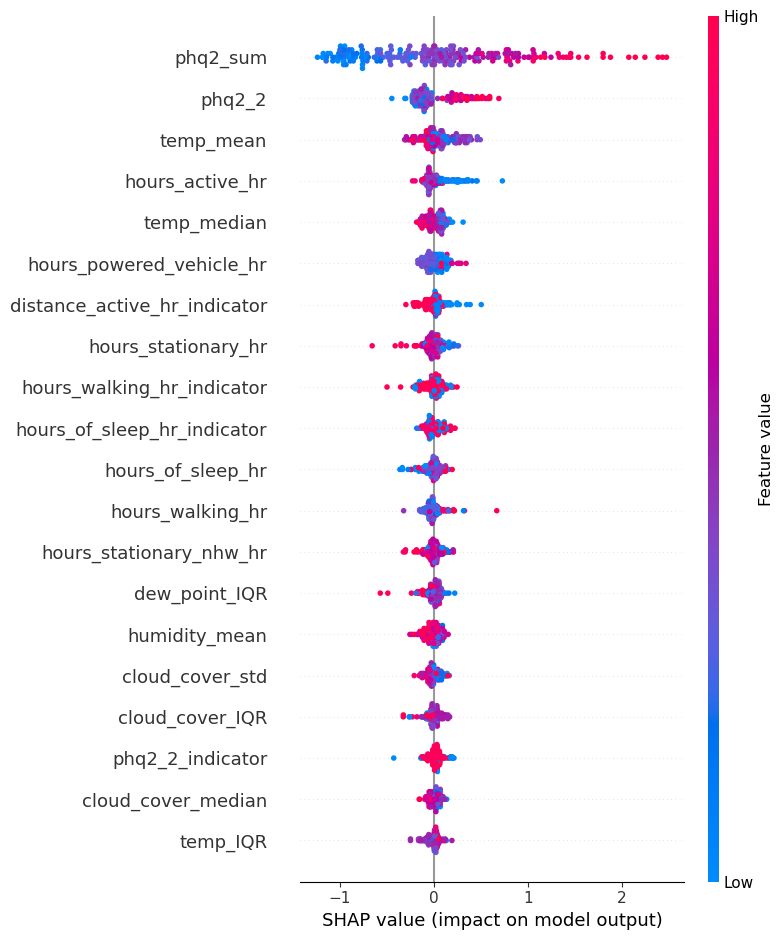

v2_week, AdaBoost
cv score: 0.16319020562355502, mae 1.211111988962364 PMC: 0.478, p-val 0.000
cv score: 0.3255669350879451, mae 1.1786726344261511 PMC: 0.572, p-val 0.000
cv score: 0.25630027247409704, mae 1.1141278135142818 PMC: 0.551, p-val 0.000
cv score: 0.1609506035372894, mae 1.1278618414821833 PMC: 0.524, p-val 0.000
cv score: 0.4226420178721685, mae 1.235714330560174 PMC: 0.666, p-val 0.000
R² on test for AdaBoost: 0.272, PMC: 0.547, p-val 0.000
v2_week, Gradient Boost
cv score: 0.2283522195946106, mae 1.152752231482963 PMC: 0.505, p-val 0.000
cv score: 0.3164112368509122, mae 1.2063751105017433 PMC: 0.570, p-val 0.000
cv score: 0.23144846282980558, mae 1.1531009244419403 PMC: 0.537, p-val 0.000
cv score: 0.10932770260661784, mae 1.1192158331766213 PMC: 0.499, p-val 0.000
cv score: 0.37468428707728507, mae 1.2802376067339274 PMC: 0.647, p-val 0.000
R² on test for Gradient Boost: 0.215, PMC: 0.513, p-val 0.000


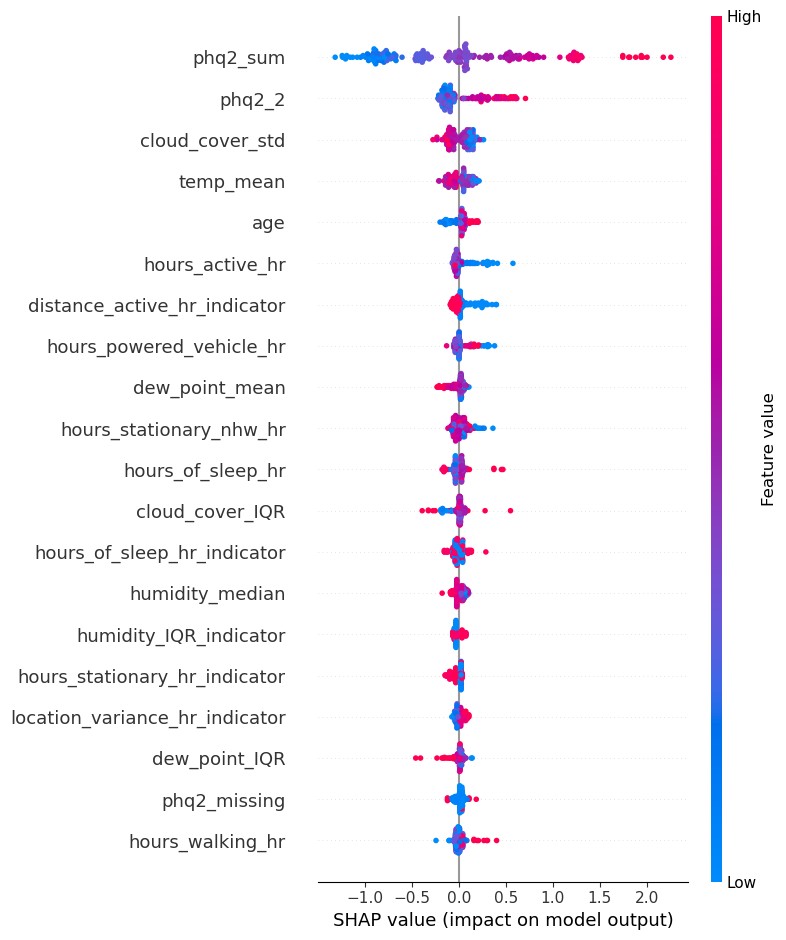

v2_week, Bagging
cv score: 0.27779038670907064, mae 1.092272845647486 PMC: 0.570, p-val 0.000
cv score: 0.13531761678952325, mae 1.4157618087575101 PMC: 0.432, p-val 0.000
cv score: 0.0978818098692934, mae 1.2663006300201205 PMC: 0.471, p-val 0.000
cv score: 0.08658934414002961, mae 1.1836841730715615 PMC: 0.449, p-val 0.000
cv score: 0.35094827506658977, mae 1.2775005591996131 PMC: 0.608, p-val 0.000
R² on test for Bagging: 0.170, PMC: 0.490, p-val 0.000
v2_week, CatBoost
cv score: 0.20515870127731994, mae 1.1606080521812079 PMC: 0.470, p-val 0.000
cv score: 0.31481368233844964, mae 1.2255520423618533 PMC: 0.575, p-val 0.000
cv score: 0.2655457064722794, mae 1.072482890773123 PMC: 0.554, p-val 0.000
cv score: 0.07691394516970629, mae 1.169462940885658 PMC: 0.476, p-val 0.000
cv score: 0.370933495480226, mae 1.2641198982767052 PMC: 0.643, p-val 0.000
R² on test for CatBoost: 0.215, PMC: 0.507, p-val 0.000


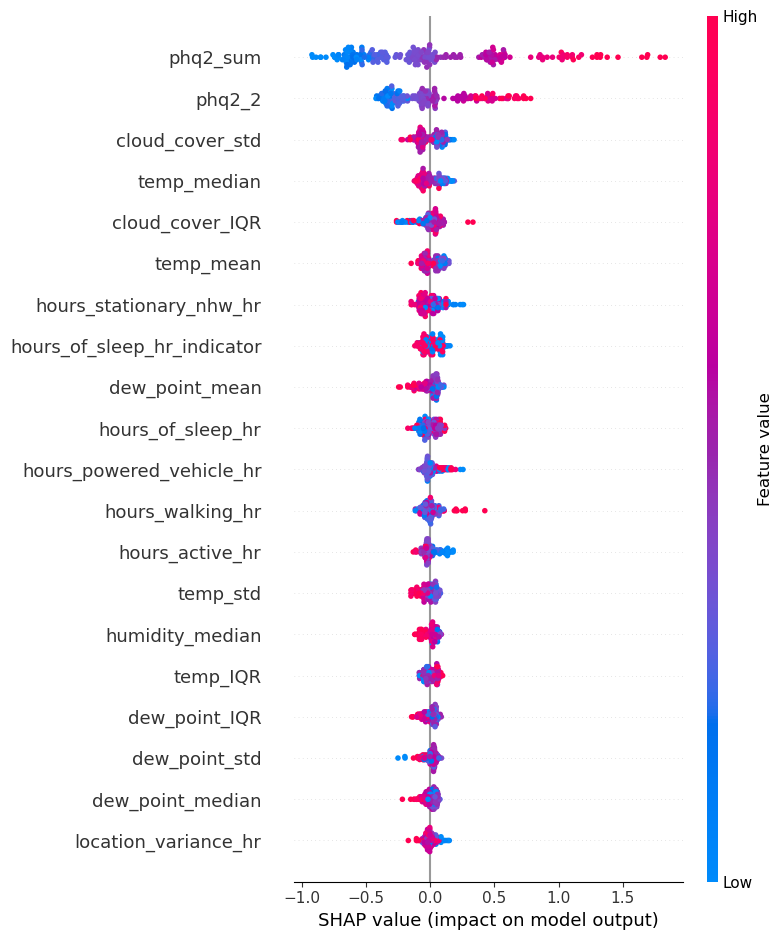

<Figure size 640x480 with 0 Axes>

In [2]:
cv_results = {}
test_results = {}

for name in df_names:
    cv_results[name] = {}
    test_results[name] = {}
    X_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_train.csv'))
    y_train= pd.read_csv(os.path.join(brighten_dir, f'{name}_y_train.csv'))

    # Create KFold object which groups based on num ID
    gkf = GroupKFold(n_splits=5)
    groups = X_train['num_id']    # Set num_id for the groups

    # Now drop all other id columns 
    X_train_cleaned = X_train.drop(columns=[col for col in X_train.columns if col in id_columns or 'Unnamed' in col or '_int' in col])
    y_train_cleaned = y_train.drop(columns=[col for col in y_train.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
    print(f'Training shapes: y {y_train_cleaned.shape}, X {X_train_cleaned.shape}')
    # Evaluate each classifier using cross-validation

    for reg_name, reg in regs:
        print(f'{name}, {reg_name}')
        cv_results[name][reg_name] = {}
        test_results[name][reg_name] = {}

        cv_results[name][reg_name]['r2'] = []
        cv_results[name][reg_name]['mae'] = []
        cv_results[name][reg_name]['pmc'] = []
        test_results[name][reg_name]['r2'] = []
        test_results[name][reg_name]['mae'] = []
        test_results[name][reg_name]['pmc'] = []
        # 5 fold cross validation
        gkf = GroupKFold(n_splits=5)
        # going through each CV split
        for train_idx, val_idx in gkf.split(X_train_cleaned, y_train_cleaned, groups=groups):
            X_tr, X_cv_val = X_train_cleaned.iloc[train_idx], X_train_cleaned.iloc[val_idx]
            y_tr, y_cv_val = y_train_cleaned.iloc[train_idx], y_train_cleaned.iloc[val_idx]
            
            reg.fit(X_tr, y_tr)  # Now this reg is the trained model for this fold
            # Predict on CV
            y_cv_val_pred = reg.predict(X_cv_val)
            # Evaluate r2 CV score
            cv_score = r2_score(y_cv_val, y_cv_val_pred)
            cv_mae = mean_absolute_error(y_cv_val, y_cv_val_pred)
            cv_pmc = pearsonr(y_cv_val, y_cv_val_pred)
            print(f'cv score: {cv_score}, mae {cv_mae} PMC: {cv_pmc[0]:.3f}, p-val {cv_pmc[1]:.3f}')
            cv_results[name][reg_name]['r2'].append(cv_score)
            cv_results[name][reg_name]['mae'].append(cv_mae)
            cv_results[name][reg_name]['pmc'].append(cv_pmc[0])

            


        
        # For that reg, predict test
        X_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_val.csv'))
        X_val_cleaned = X_val.drop(columns=[col for col in X_val.columns if col in id_columns or 'Unnamed' in col or '_int' in col])
        y_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_val.csv'))
        y_val_cleaned = y_val.drop(columns=[col for col in y_val.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
        # Fit that reg
        reg.fit(X_train_cleaned, y_train_cleaned)
        y_val_pred = reg.predict(X_val_cleaned)
        # Evaluate r2 test score
        test_score = r2_score(y_val_cleaned, y_val_pred)
        test_mae = mean_absolute_error(y_val_cleaned, y_val_pred)
        test_pmc = pearsonr(y_val_cleaned, y_val_pred)
        print(f'R² on test for {reg_name}: {test_score:.3f}, PMC: {test_pmc[0]:.3f}, p-val {test_pmc[1]:.3f}')
        test_results[name][reg_name]['r2'].append(test_score)
        test_results[name][reg_name]['mae'].append(test_mae)
        test_results[name][reg_name]['pmc'].append(test_pmc[0])
        if 'Ada' not in reg_name and "agging" not in reg_name:
            explainer = shap.Explainer(reg)
            shap_values = explainer.shap_values(X_val_cleaned)
            shap.summary_plot(shap_values, X_val_cleaned,show=False)
            plt.savefig(os.path.join(shap_dir, f"shap_{name}_{reg_name}_imputed.png"), bbox_inches="tight", dpi=300)
            plt.show()
            plt.clf()   # (Optional) Clear the figure to avoid overlap with future plots






[{'Dataset': 'v1_day',
  'Regressor': 'Decision Tree',
  'Metric': 'r2',
  'Score': -0.3386537850850051},
 {'Dataset': 'v1_day',
  'Regressor': 'Decision Tree',
  'Metric': 'r2',
  'Score': -0.3545347766815008},
 {'Dataset': 'v1_day',
  'Regressor': 'Decision Tree',
  'Metric': 'r2',
  'Score': -0.41959438414812844},
 {'Dataset': 'v1_day',
  'Regressor': 'Decision Tree',
  'Metric': 'r2',
  'Score': -0.49569008099762435},
 {'Dataset': 'v1_day',
  'Regressor': 'Decision Tree',
  'Metric': 'r2',
  'Score': -0.3348152787183345},
 {'Dataset': 'v1_day',
  'Regressor': 'Decision Tree',
  'Metric': 'mae',
  'Score': 0.6770190815586712},
 {'Dataset': 'v1_day',
  'Regressor': 'Decision Tree',
  'Metric': 'mae',
  'Score': 0.7245311023951883},
 {'Dataset': 'v1_day',
  'Regressor': 'Decision Tree',
  'Metric': 'mae',
  'Score': 0.7988468676005086},
 {'Dataset': 'v1_day',
  'Regressor': 'Decision Tree',
  'Metric': 'mae',
  'Score': 0.891660597967397},
 {'Dataset': 'v1_day',
  'Regressor': 'Decisi

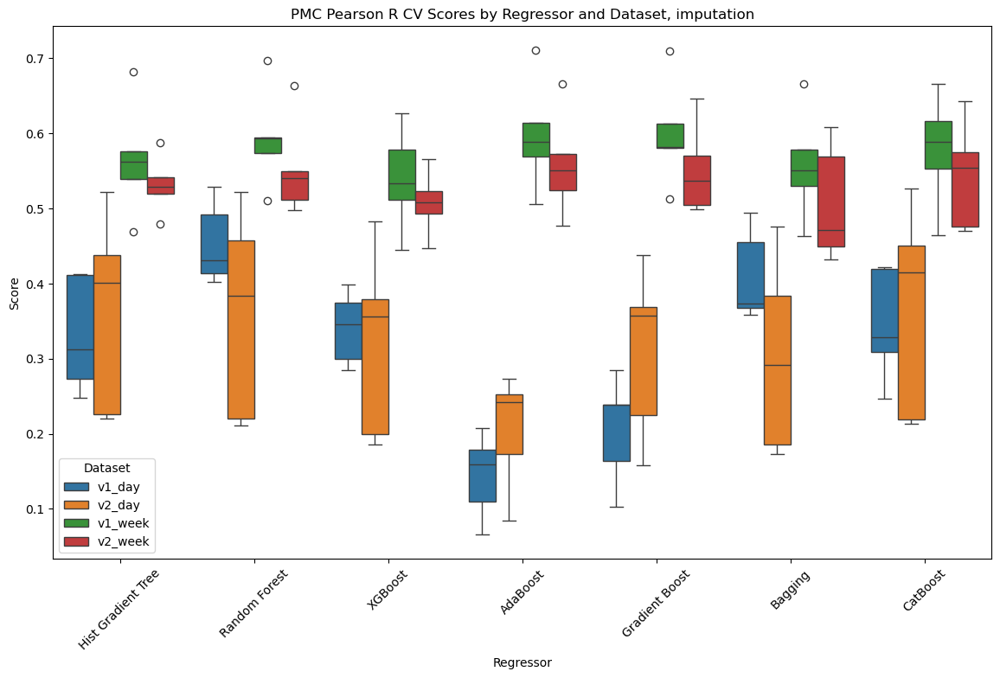

In [4]:
# Extract test data to flattened df for plotting
flat_cv_results = []

# iterate over each dataset name
for dataset_name, reg_results in cv_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                for cv_score in metrics[metric]:
                    flat_cv_results.append({
                        'Dataset': dataset_name,
                        'Regressor': reg_name,
                        'Metric': metric,
                        'Score': cv_score,
                    })
flat_cv_results_df = pd.DataFrame(flat_cv_results)
flat_cv_results_df.to_csv(os.path.join(brighten_dir, 'flat_cv_results_df.csv'))
display(flat_cv_results)
plt.figure(figsize=(14, 8))
sns.boxplot(x='Regressor', y='Score', hue='Dataset', data=flat_cv_results_df[(flat_cv_results_df['Metric']=='pmc') & (flat_cv_results_df['Regressor']!='Decision Tree')])
plt.xticks(rotation=45)
plt.title('PMC Pearson R CV Scores by Regressor and Dataset, imputation')
plt.savefig(os.path.join(cv_dir, 'PMC Pearson R CV Scores by Regressor and Dataset on _train dataset, imputed, before tuning.png'))
plt.show()


,v1_day,v2_day,v1_week,v2_week
Decision Tree,"{'r2': [-0.034734434261741276], 'mae': [0.6129...","{'r2': [-0.6645988894432466], 'mae': [0.751838...","{'r2': [-0.2908126410756795], 'mae': [1.249184...","{'r2': [-0.5988191850869296], 'mae': [1.680033..."
Hist Gradient Tree,"{'r2': [0.262158493296485], 'mae': [0.65823539...","{'r2': [0.20796458906543092], 'mae': [0.579739...","{'r2': [0.3743442149259808], 'mae': [0.9450558...","{'r2': [0.1727829173355403], 'mae': [1.2202985..."
Random Forest,"{'r2': [0.41974796613613996], 'mae': [0.499509...","{'r2': [0.20278118826128244], 'mae': [0.560975...","{'r2': [0.3630198892923593], 'mae': [0.9323145...","{'r2': [0.24055724313504379], 'mae': [1.184951..."
XGBoost,"{'r2': [0.3110142568399844], 'mae': [0.6191728...","{'r2': [0.16716653411487037], 'mae': [0.616648...","{'r2': [0.31043899350115234], 'mae': [0.948830...","{'r2': [0.08275666327551834], 'mae': [1.284561..."
AdaBoost,"{'r2': [-0.036654654704664], 'mae': [0.8819251...","{'r2': [-0.376917189531323], 'mae': [1.0371855...","{'r2': [0.2638929336276795], 'mae': [1.0486555...","{'r2': [0.27249458840788865], 'mae': [1.181898..."
Gradient Boost,"{'r2': [0.12903569731563225], 'mae': [0.732511...","{'r2': [0.16421267815133456], 'mae': [0.593565...","{'r2': [0.37059431149132105], 'mae': [0.946094...","{'r2': [0.21518117499747424], 'mae': [1.208616..."
Bagging,"{'r2': [0.3773532994501414], 'mae': [0.5189772...","{'r2': [0.09842003692206214], 'mae': [0.614368...","{'r2': [0.29998934236938823], 'mae': [0.968038...","{'r2': [0.17031697109998178], 'mae': [1.251593..."
CatBoost,"{'r2': [0.3047972556438219], 'mae': [0.6332889...","{'r2': [0.20106231172381217], 'mae': [0.594290...","{'r2': [0.40790138651813357], 'mae': [0.905429...","{'r2': [0.21506969306524315], 'mae': [1.192267..."


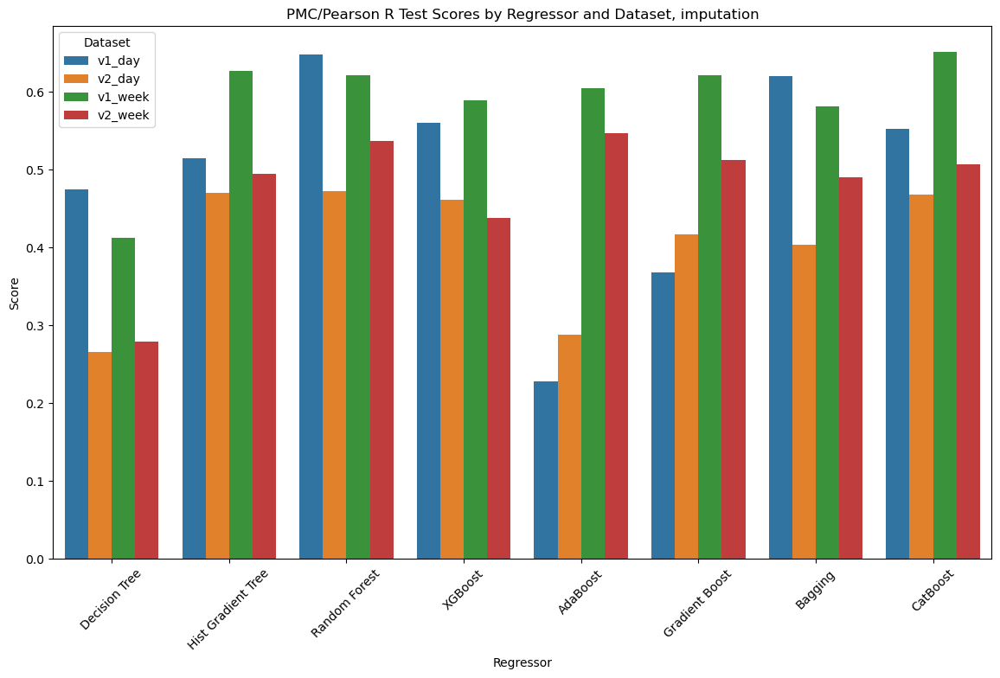

In [6]:
test_results_df = pd.DataFrame(test_results)
test_results_df.to_csv(os.path.join(brighten_dir, 'test_results_df.csv'))
display(test_results_df)


# Extract test data to flattened df for plotting
flat_test_results = []

# iterate over each dataset name
for dataset_name, reg_results in test_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                flat_test_results.append({
                    'Dataset': dataset_name,
                    'Regressor': reg_name,
                    'Metric': metric,
                    'Score': metrics[metric][0],
                })
flat_test_results_df = pd.DataFrame(flat_test_results)

plt.figure(figsize=(14, 8))
sns.barplot(x='Regressor', y='Score', hue='Dataset', data=flat_test_results_df[flat_test_results_df['Metric']=='pmc'])
plt.xticks(rotation=45)
plt.title('PMC/Pearson R Test Scores by Regressor and Dataset, imputation')
plt.savefig(os.path.join(val_dir, 'PMC Pearson R Test Scores by Regressor and Dataset on _val dataset, imputed, before tuning.png'))
plt.show()


In [ ]:
# results_df_grouped_imp = flat_test_results_df.groupby(['Dataset', 'Regressor','Metric']).agg('mean')
# display(results_df_grouped_imp.head())
# results_df_grouped_imp.to_csv(os.path.join(brighten_dir, 'test_score_df_imputed'))

Score
Dataset Regressor Metric          
v1_day  AdaBoost  mae     0.881925
                  r2     -0.036655
        Bagging   mae     0.518977
                  r2      0.377353
        CatBoost  mae     0.633289

Training shapes: y (4513,), X (4513, 64)
R² on test for Hist Gradient Tree: 0.074


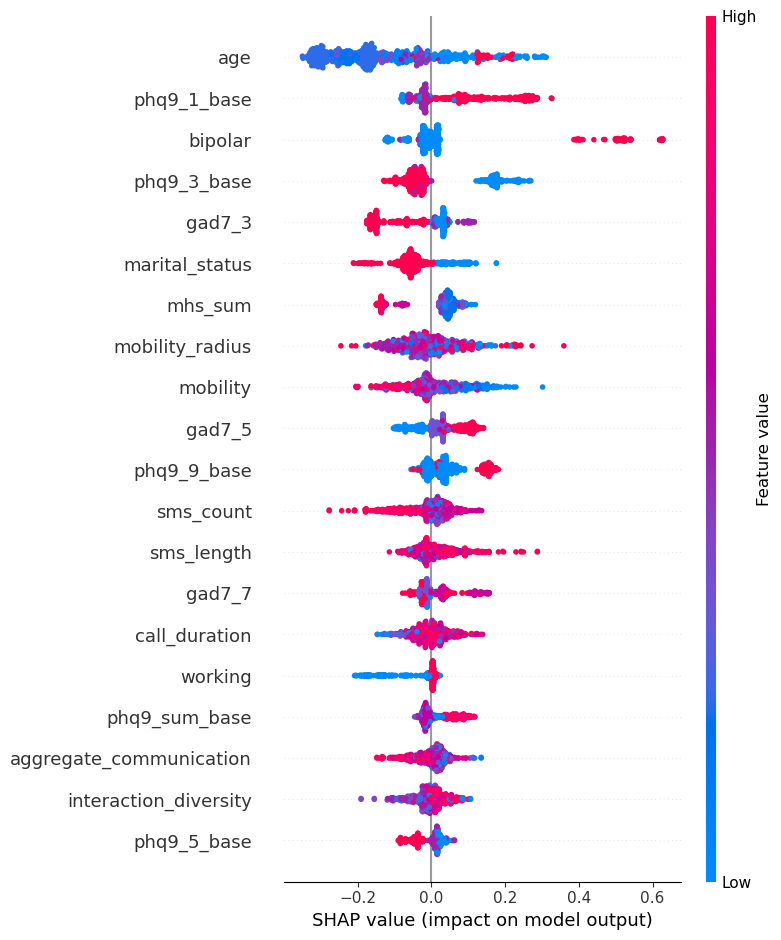

R² on test for Random Forest: -0.003


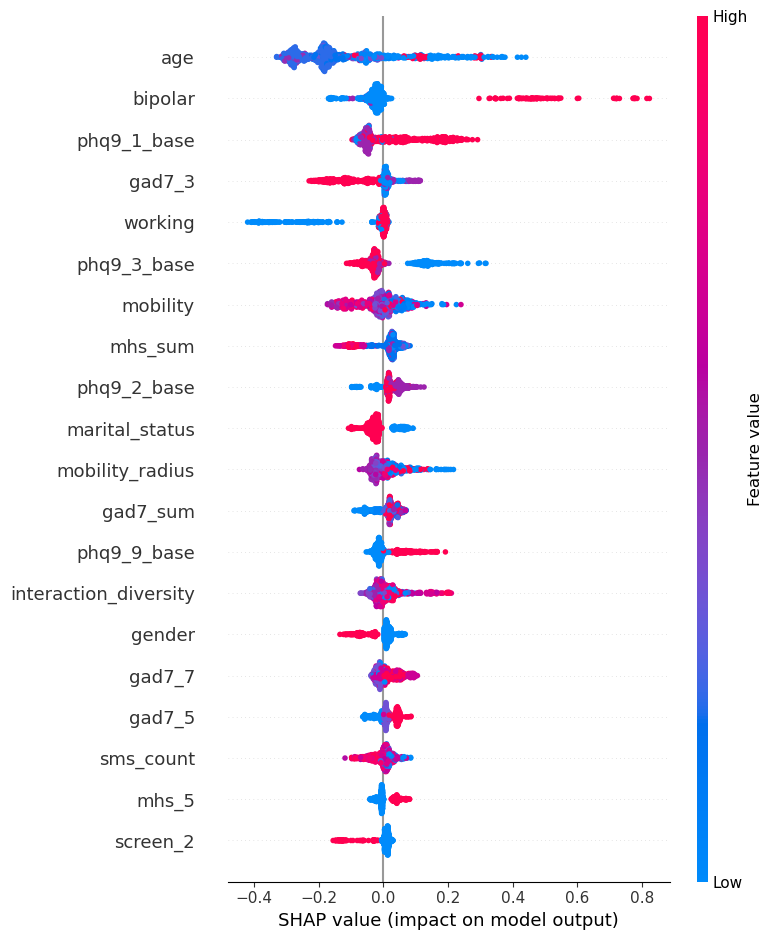

R² on test for XGBoost: -0.151


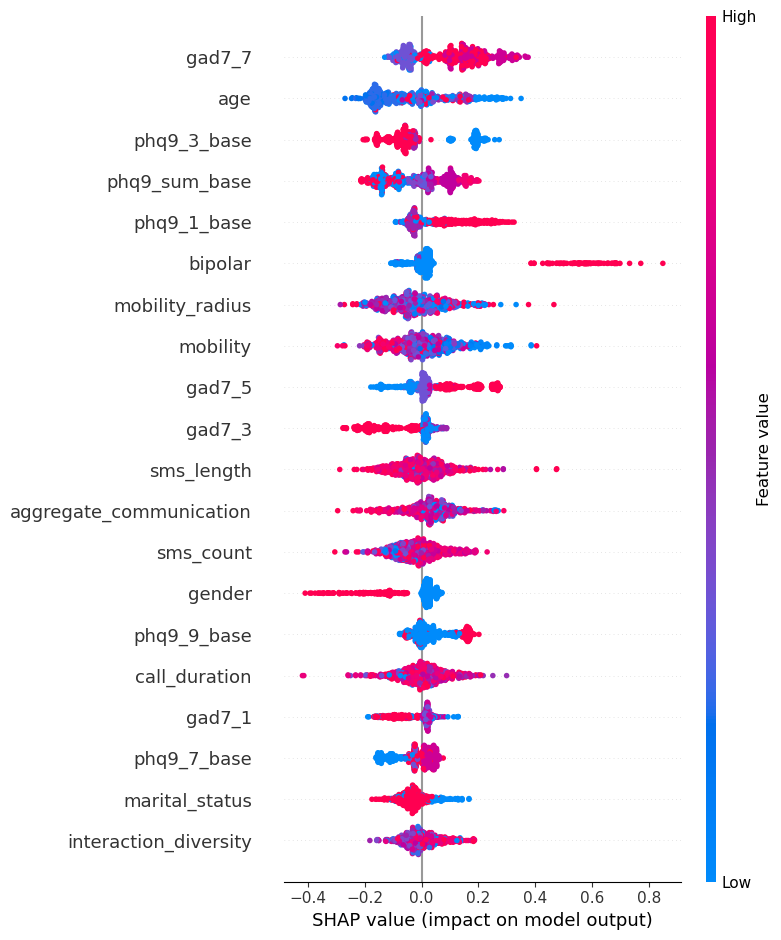

R² on test for AdaBoost: 0.154
R² on test for Gradient Boost: 0.077


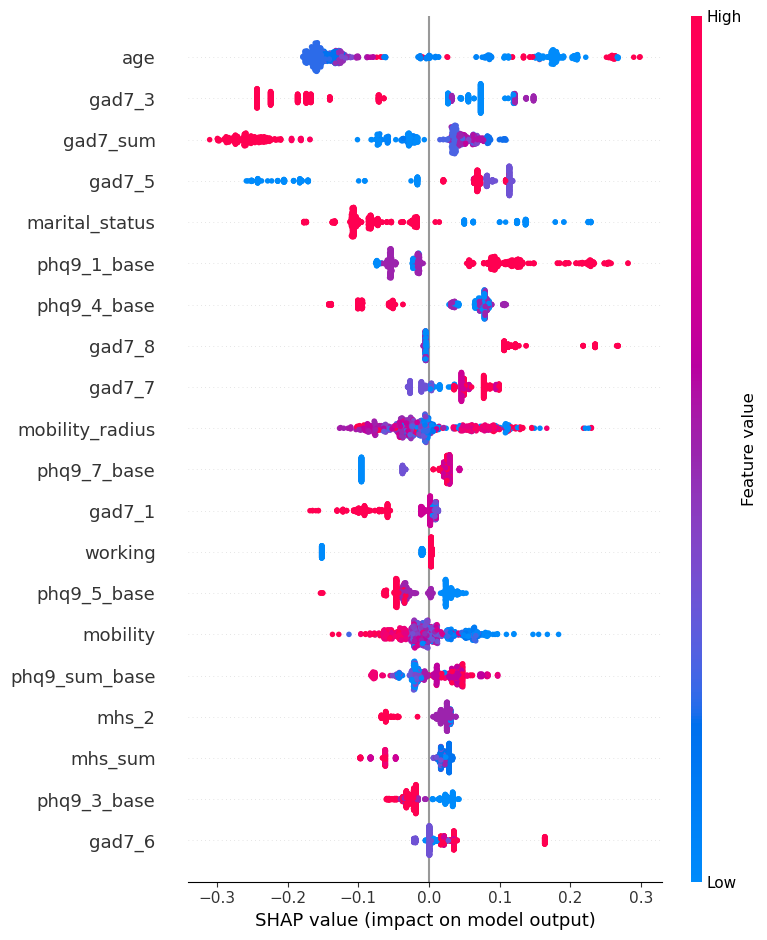

R² on test for Bagging: -0.087
R² on test for CatBoost: 0.106


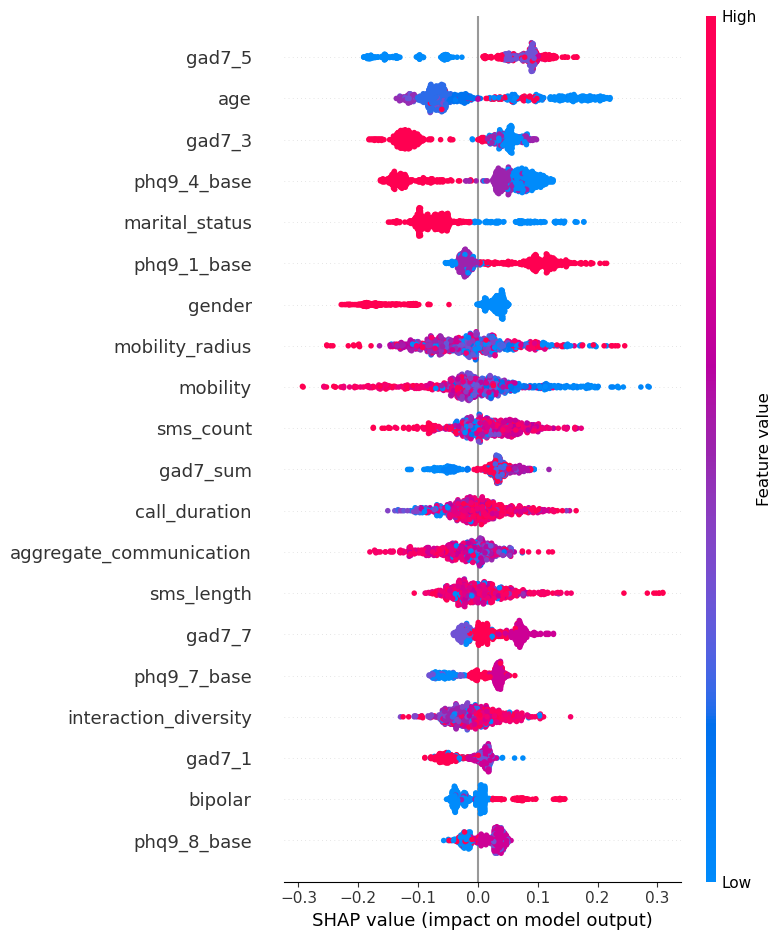

Training shapes: y (31,), X (31, 100)
R² on test for Hist Gradient Tree: 0.000


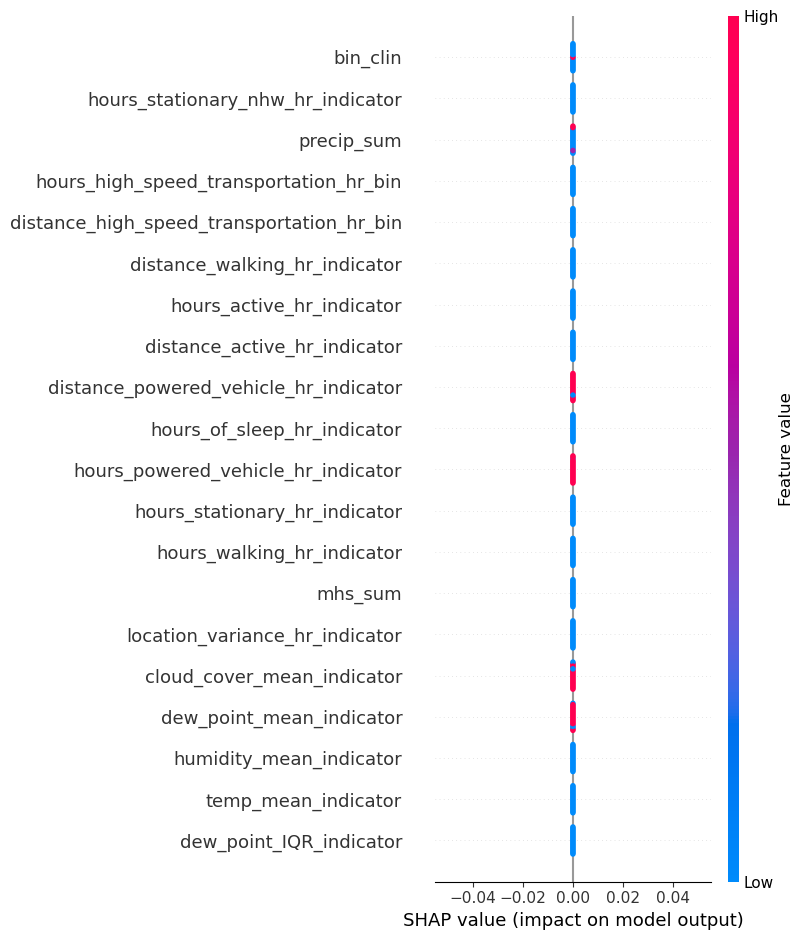

R² on test for Random Forest: 0.000


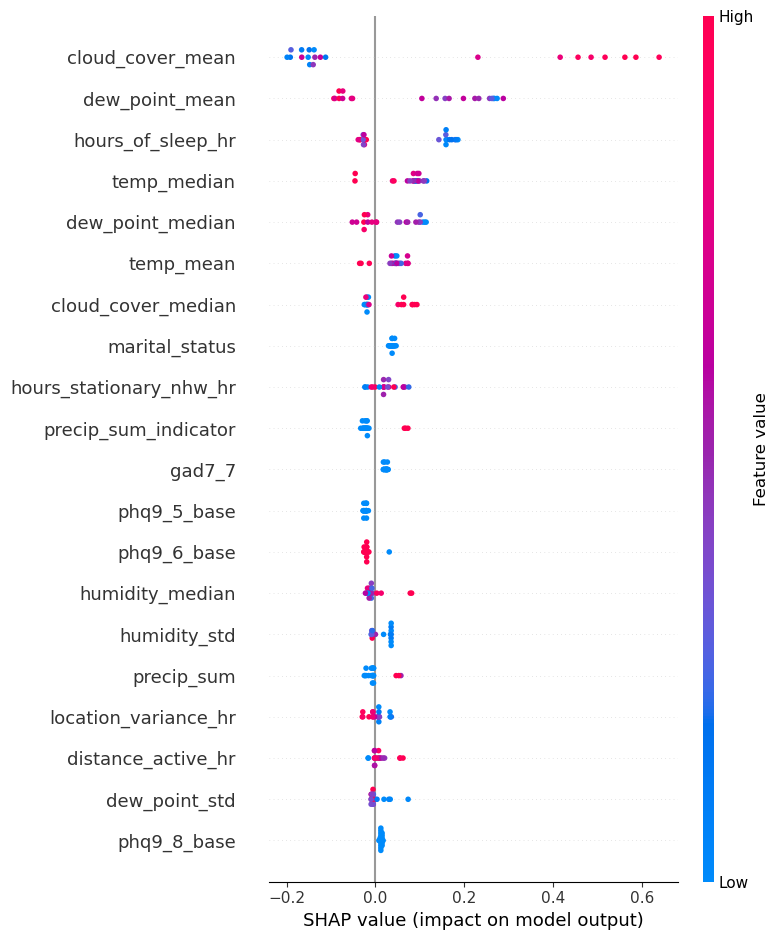

R² on test for XGBoost: 0.000


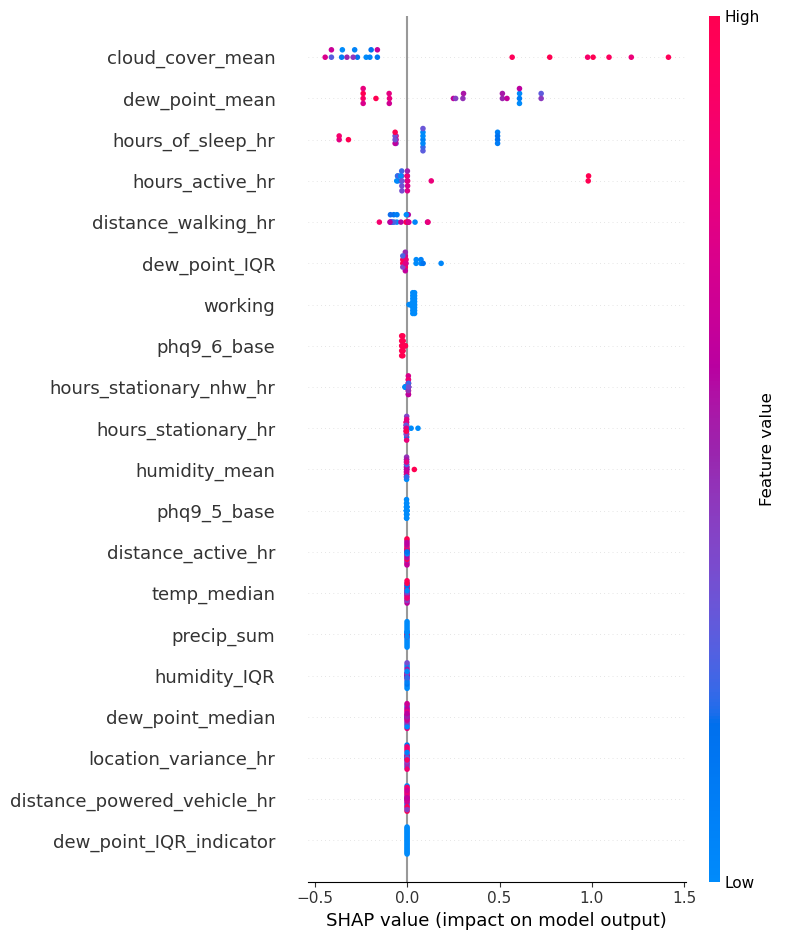

R² on test for AdaBoost: 0.000
R² on test for Gradient Boost: 0.000


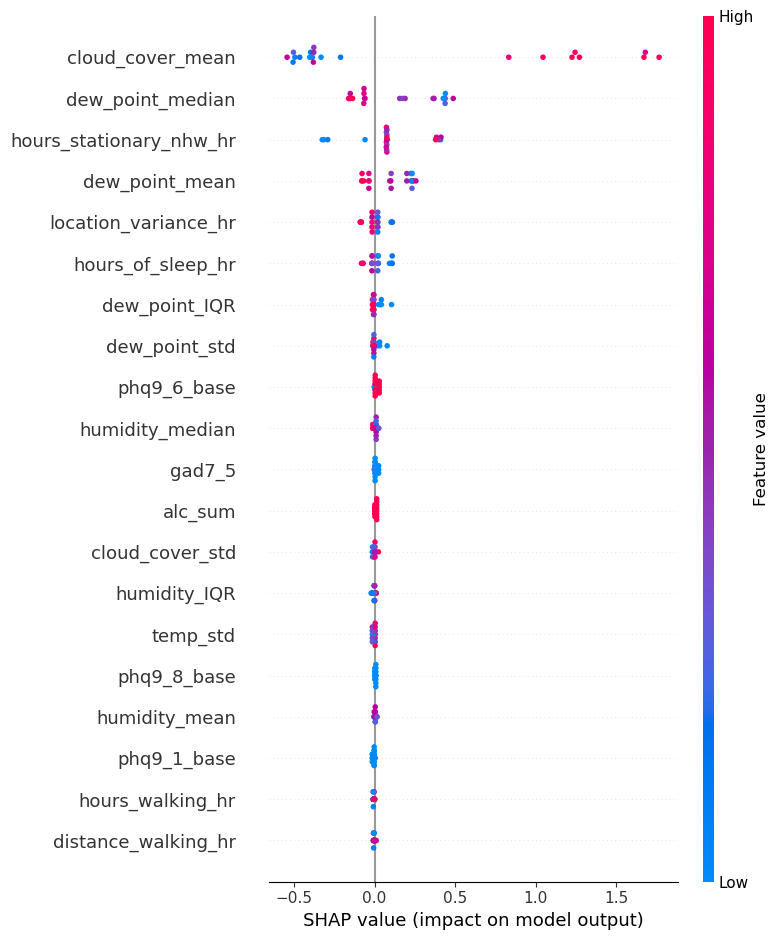

R² on test for Bagging: 0.000
R² on test for CatBoost: 0.000


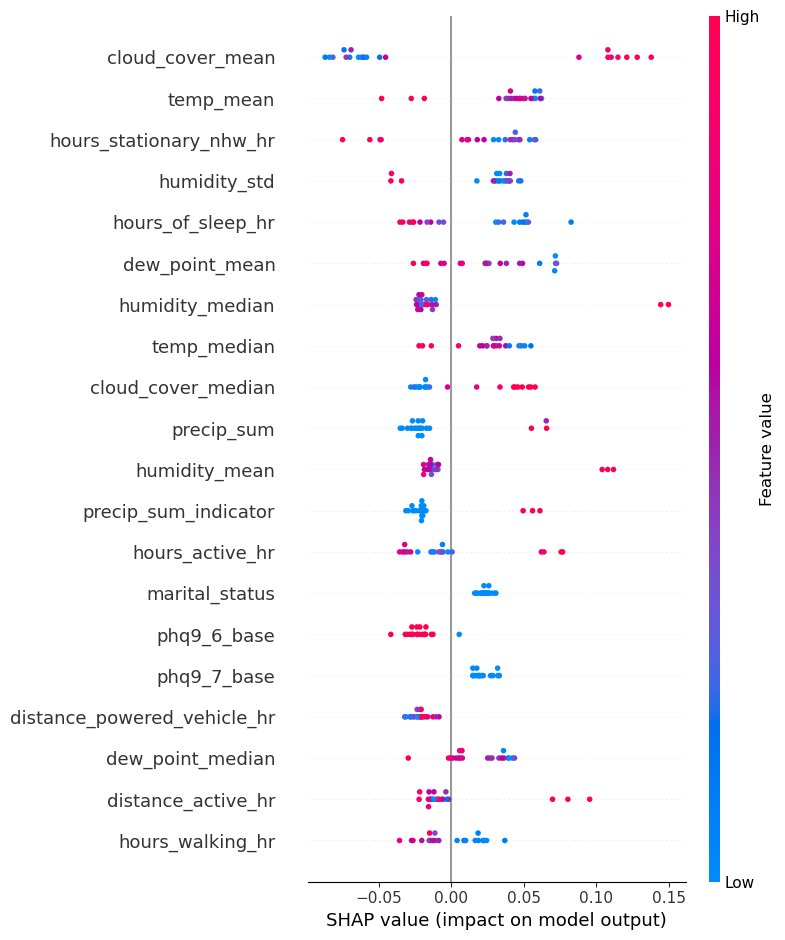

Training shapes: y (281,), X (281, 61)
R² on test for Hist Gradient Tree: 0.365


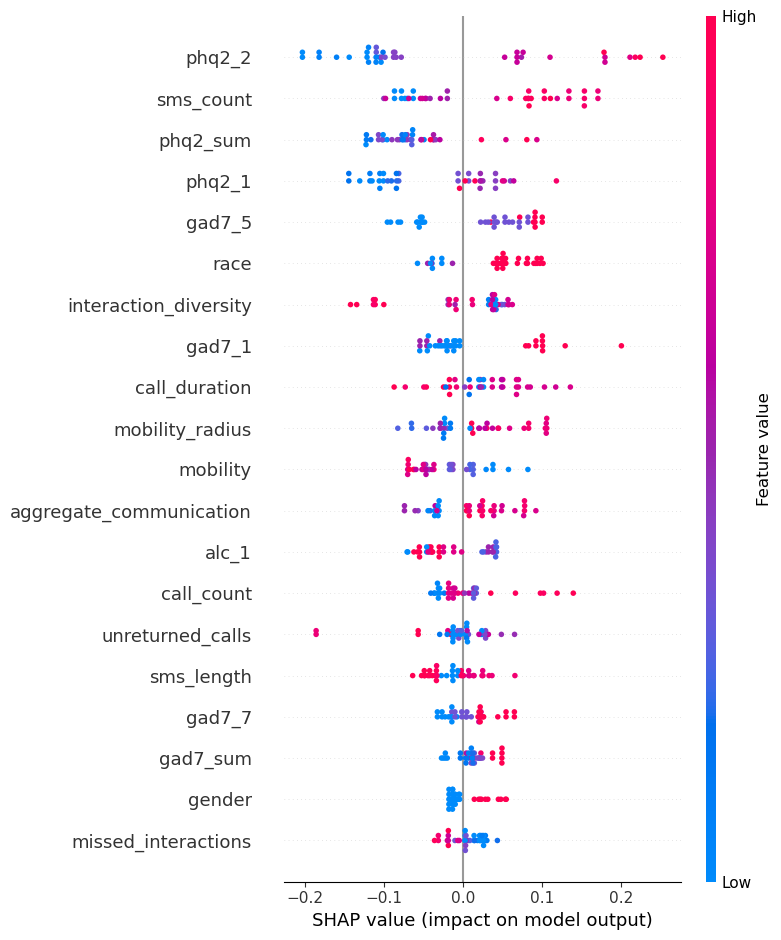

R² on test for Random Forest: 0.354


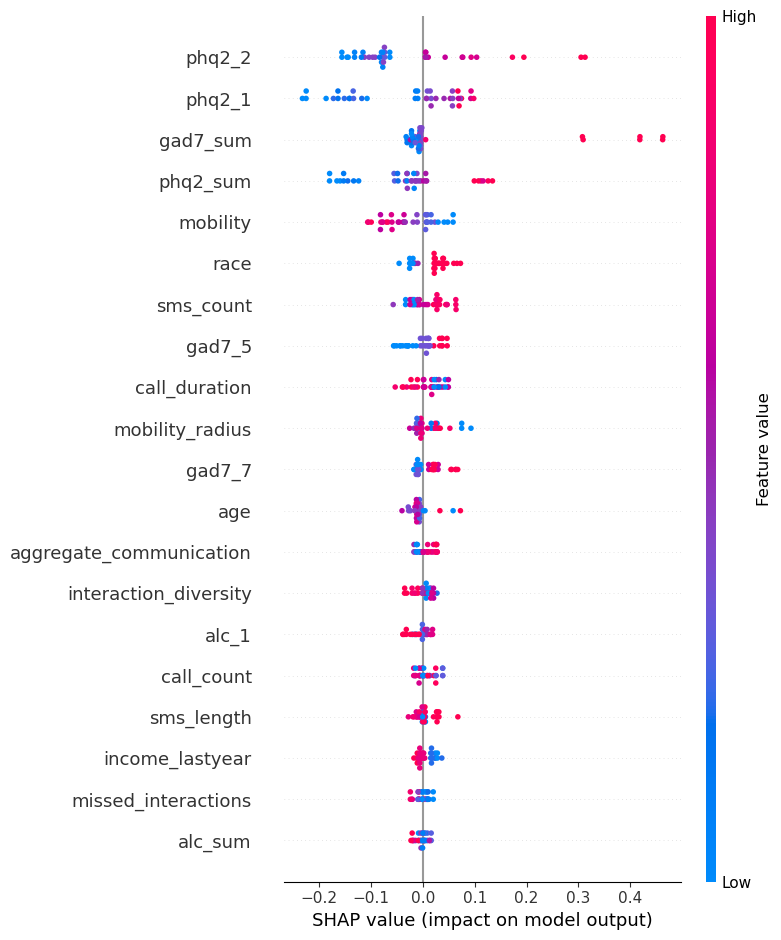

R² on test for XGBoost: 0.536


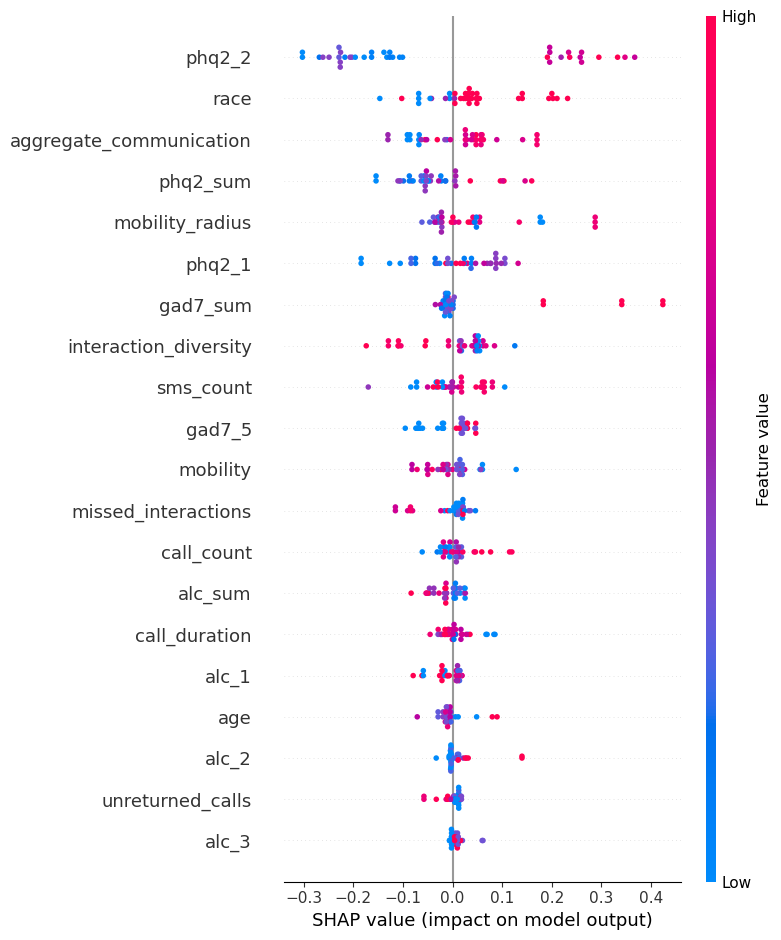

R² on test for AdaBoost: 0.425
R² on test for Gradient Boost: 0.407


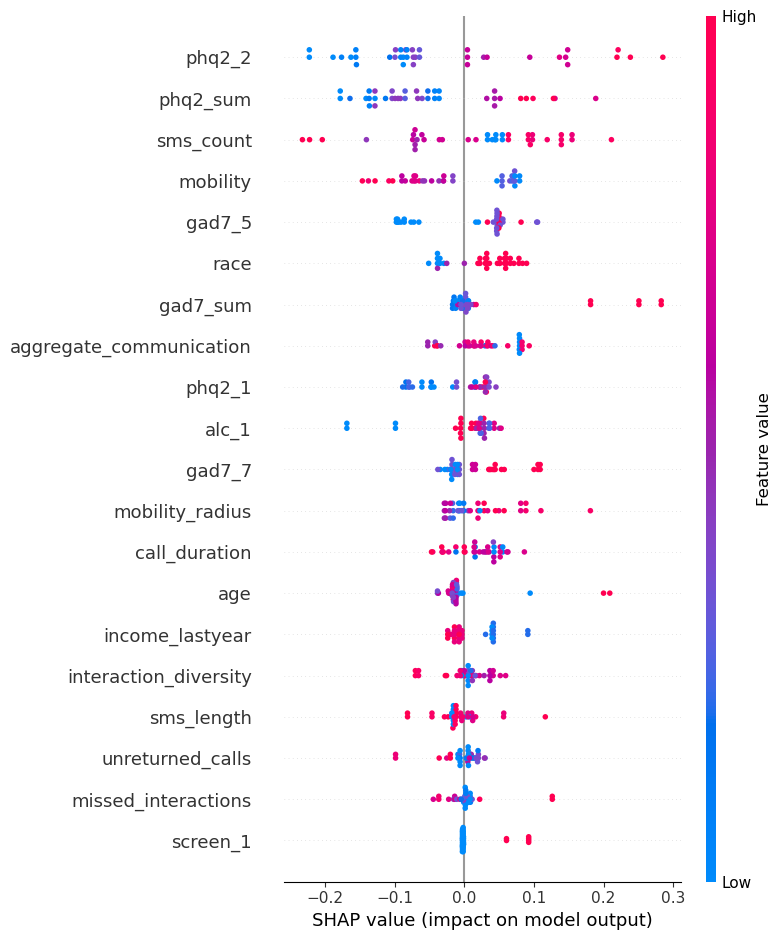

R² on test for Bagging: 0.218
R² on test for CatBoost: 0.263


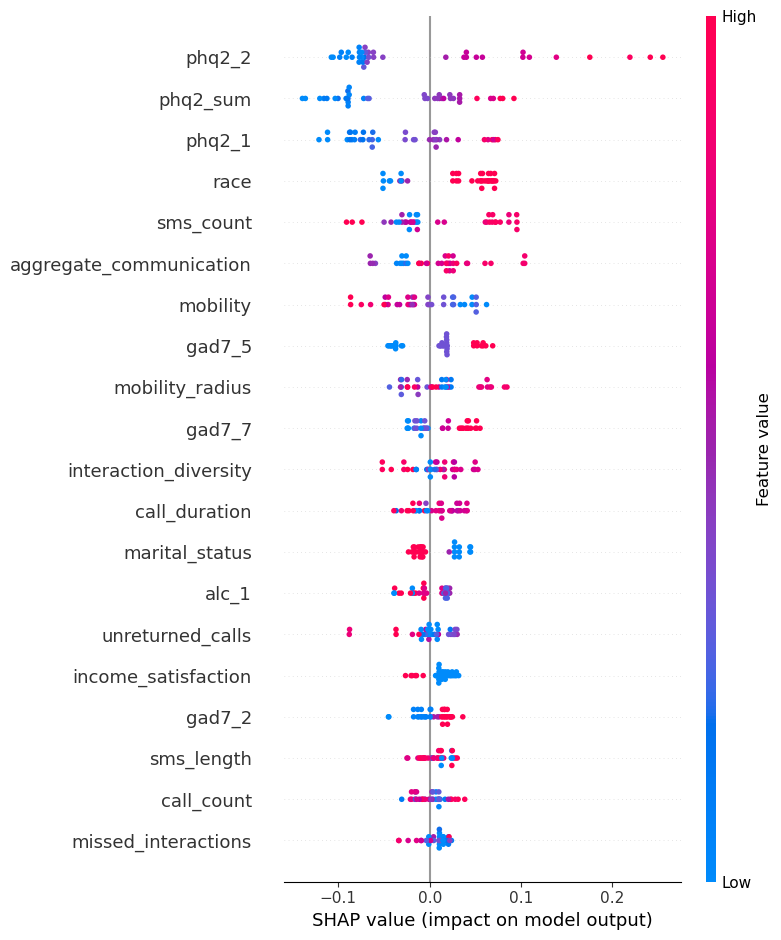

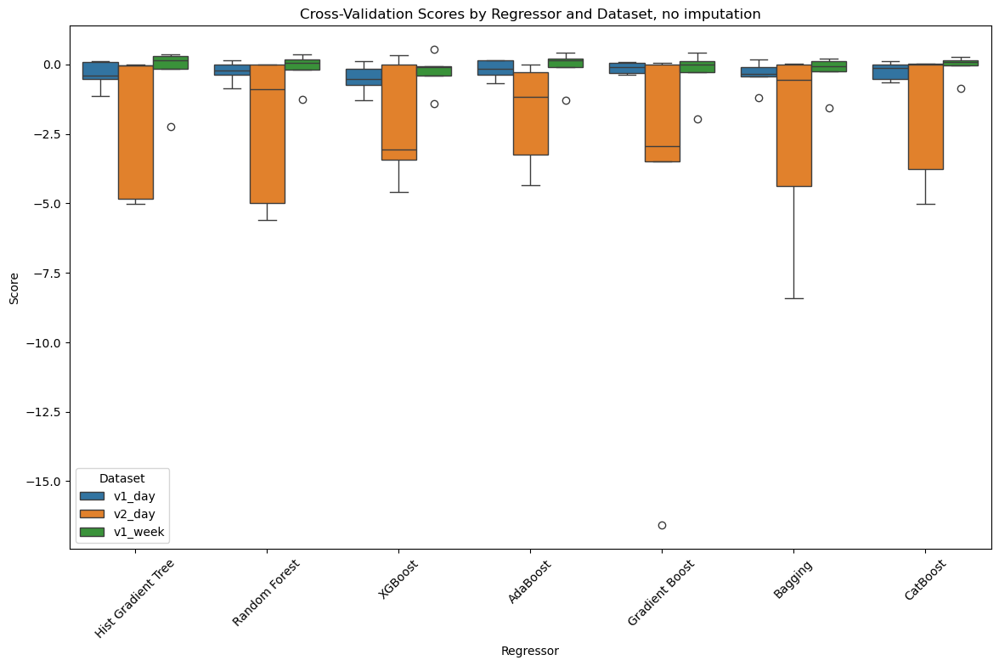

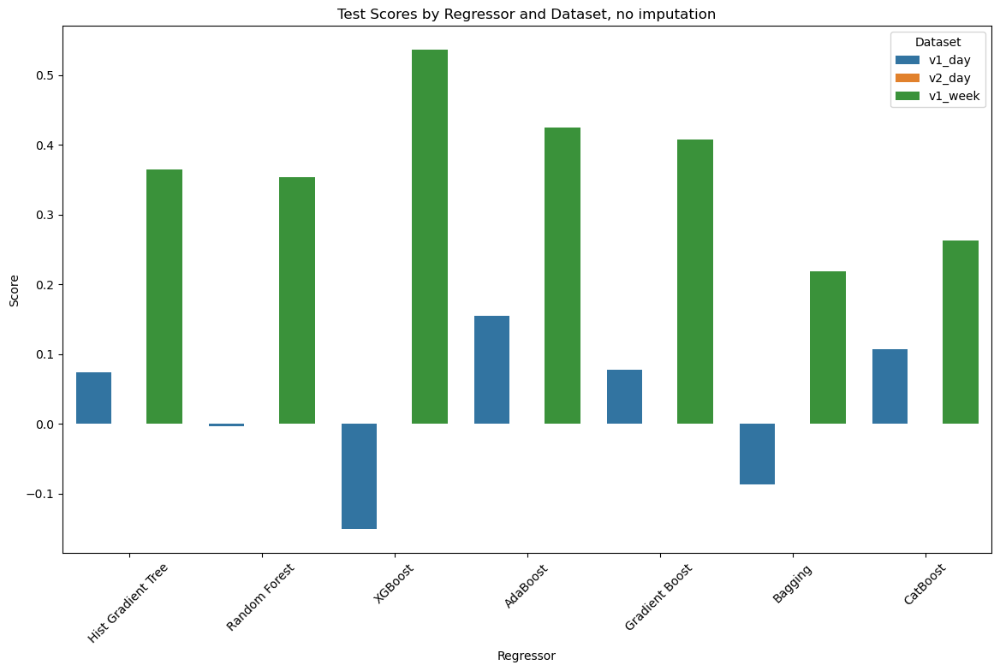

In [ ]:
# no mae
from sklearn.model_selection import GroupKFold, cross_val_score
id_columns.append('idx')
wNA_cv_results = {}
wNA_test_results = {}

for name in df_names:
    wNA_cv_results[name] = {}
    wNA_test_results[name] = {}
    X_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_X_trainval.csv'))
    y_train= pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_y_trainval.csv'))

    # Create KFold object which groups based on num ID
    gkf = GroupKFold(n_splits=5)
    groups = X_train['num_id']    # Set num_id for the groups
    # Now drop all other id columns 
    X_train_cleaned = X_train.drop(columns=[col for col in X_train.columns if col in id_columns or 'Unnamed' in col])
    y_train_cleaned = y_train.drop(columns=[col for col in y_train.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
    print(f'Training shapes: y {y_train_cleaned.shape}, X {X_train_cleaned.shape}')
    # Evaluate each classifier using cross-validation

    for reg_name, reg in regs_someNA:
        wNA_cv_results[name][reg_name] = []
        wNA_test_results[name][reg_name] = []
        # 5 fold cross validation
        gkf = GroupKFold(n_splits=5)
        # going through each CV split
        for train_idx, val_idx in gkf.split(X_train_cleaned, y_train_cleaned, groups=groups):
            X_tr, X_val = X_train_cleaned.iloc[train_idx], X_train_cleaned.iloc[val_idx]
            y_tr, y_val = y_train_cleaned.iloc[train_idx], y_train_cleaned.iloc[val_idx]
            
            reg.fit(X_tr, y_tr)  # Now this reg is the trained model for this fold
            # Predict on CV
            y_val_pred = reg.predict(X_val)
            # Evaluate r2 CV score
            cv_score = r2_score(y_val, y_val_pred)
            wNA_cv_results[name][reg_name].append(cv_score)
        
        # For that reg, predict test
        X_test = pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_X_test.csv'))
        X_test_cleaned = X_test.drop(columns=[col for col in X_test.columns if col in id_columns or 'Unnamed' in col])
        y_test = pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_y_test.csv'))
        y_test_cleaned = y_test.drop(columns=[col for col in y_test.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
        # Fit that reg
        reg.fit(X_train_cleaned, y_train_cleaned)
        y_test_pred = reg.predict(X_test_cleaned)
        # Evaluate r2 test score
        test_score = r2_score(y_val, y_val_pred)
        print(f'R² on test for {reg_name}: {test_score:.3f}')
        wNA_test_results[name][reg_name].append(test_score)
        if 'Ada' not in reg_name and "agging" not in reg_name:
            explainer = shap.Explainer(reg)
            shap_values = explainer.shap_values(X_test_cleaned)
            shap.summary_plot(shap_values, X_test_cleaned)


# Extract CV data to flattened df for plotting
wNA_flat_cv_results = []

# iterate over each dataset name
for dataset_name, reg_results in wNA_cv_results.items():
    # iterate over the scores within it
    for reg_name, scores in reg_results.items():
        for score in scores:
            wNA_flat_cv_results.append({
                'Dataset': dataset_name,
                'Regressor': reg_name,
                'Score': score
            })


wNA_cv_results_df = pd.DataFrame(wNA_flat_cv_results)

plt.figure(figsize=(14, 8))
sns.boxplot(x='Regressor', y='Score', hue='Dataset', data=wNA_cv_results_df)
plt.xticks(rotation=45)
plt.title('Cross-Validation Scores by Regressor and Dataset, no imputation')
plt.show()



# Extract test data to flattened df for plotting
wNA_flat_test_results = []

# iterate over each dataset name
for dataset_name, reg_results in wNA_test_results.items():
    # iterate over the scores within it
    for reg_name, scores in reg_results.items():
        for score in scores:
            wNA_flat_test_results.append({
                'Dataset': dataset_name,
                'Regressor': reg_name,
                'Score': score
            })


test_results_df = pd.DataFrame(wNA_flat_test_results)

plt.figure(figsize=(14, 8))
sns.barplot(x='Regressor', y='Score', hue='Dataset', data=test_results_df)
plt.xticks(rotation=45)
plt.title('Test Scores by Regressor and Dataset, no imputation')
plt.show()


Training shapes: y (5609,), X (5609, 23)
v1_day, Hist Gradient Boost
cv score: -0.314, mae 1.091, pmc: -0.155
cv score: -0.293, mae 0.974, pmc: -0.069
cv score: -0.179, mae 0.938, pmc: 0.106
R² on test for Hist Gradient Boost: 0.059, PMC: 0.315


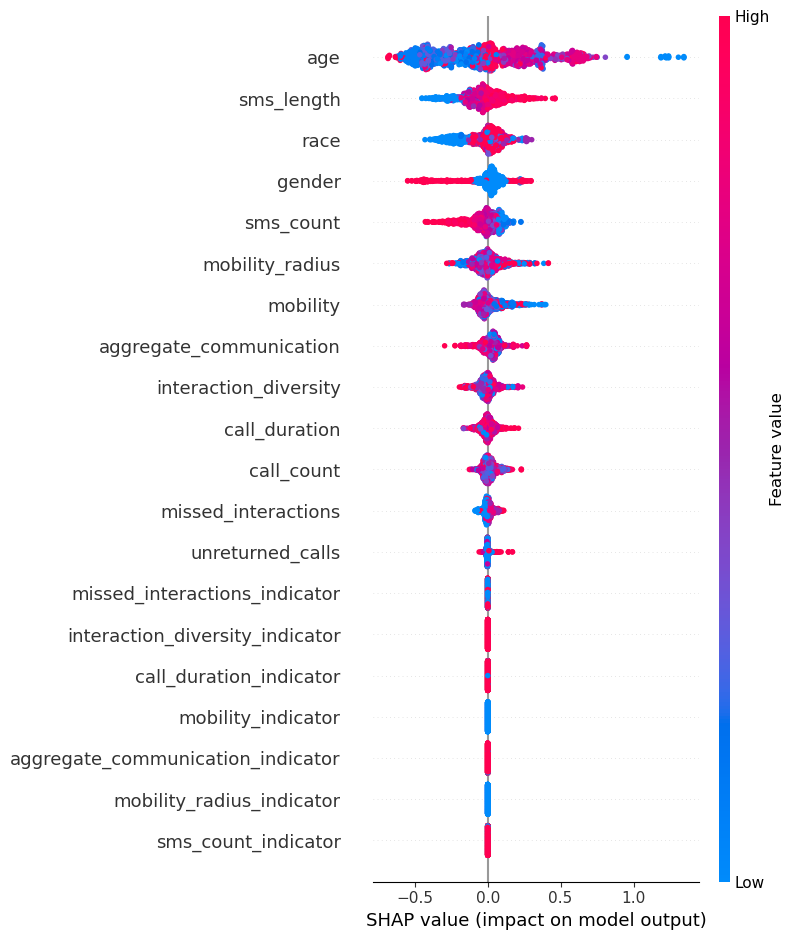

v1_day, XGBoost
cv score: -0.354, mae 1.101, pmc: -0.120
cv score: -0.405, mae 1.009, pmc: -0.069
cv score: -0.196, mae 0.931, pmc: 0.129
R² on test for XGBoost: 0.000, PMC: 0.314


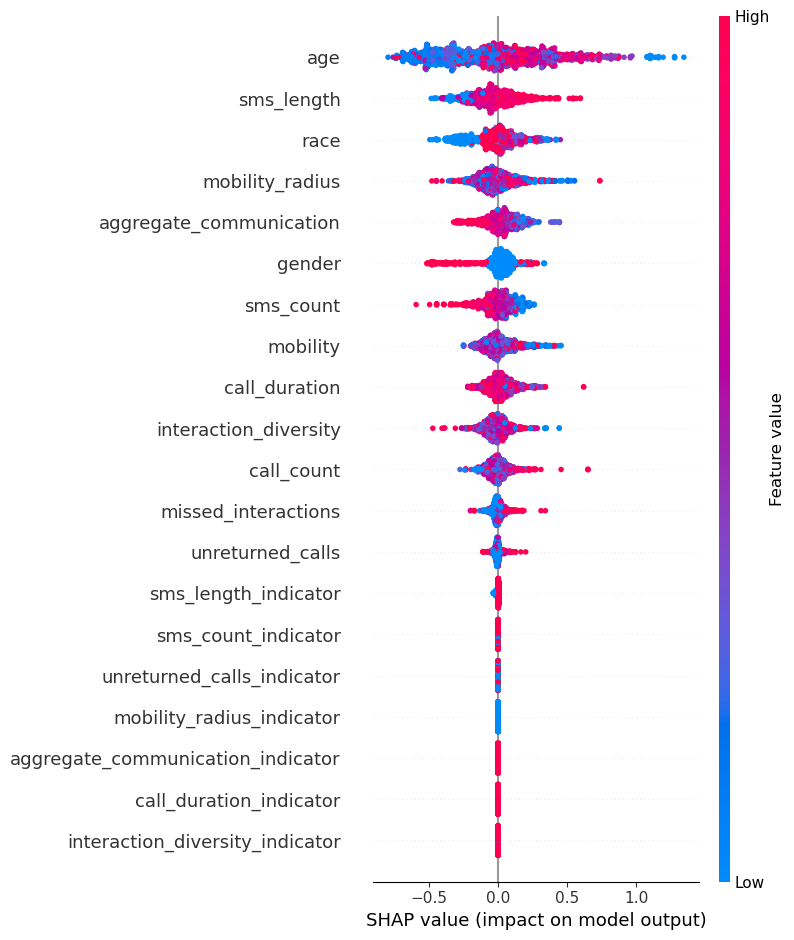

v1_day, CatBoost
cv score: -0.232, mae 1.054, pmc: -0.077
cv score: -0.330, mae 0.999, pmc: -0.119
cv score: -0.012, mae 0.877, pmc: 0.221
R² on test for CatBoost: 0.081, PMC: 0.352


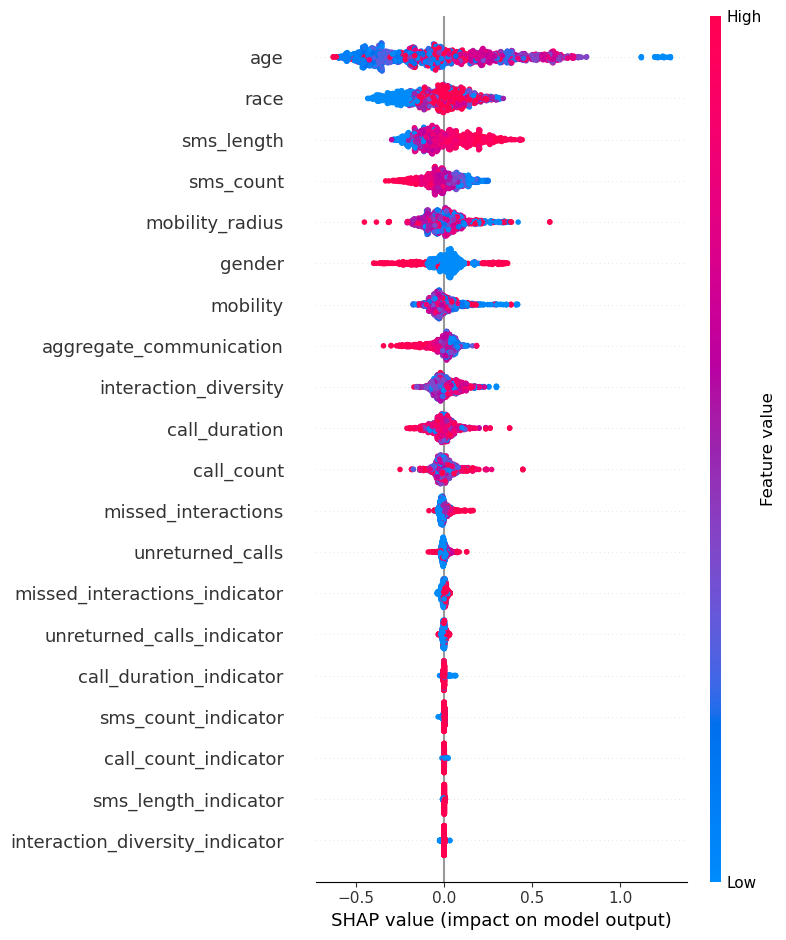

Training shapes: y (1537,), X (1537, 56)
v2_day, Hist Gradient Boost
cv score: -0.223, mae 1.042, pmc: -0.119
cv score: -0.444, mae 0.792, pmc: -0.008
cv score: -0.227, mae 0.835, pmc: -0.009
R² on test for Hist Gradient Boost: -0.100, PMC: 0.097


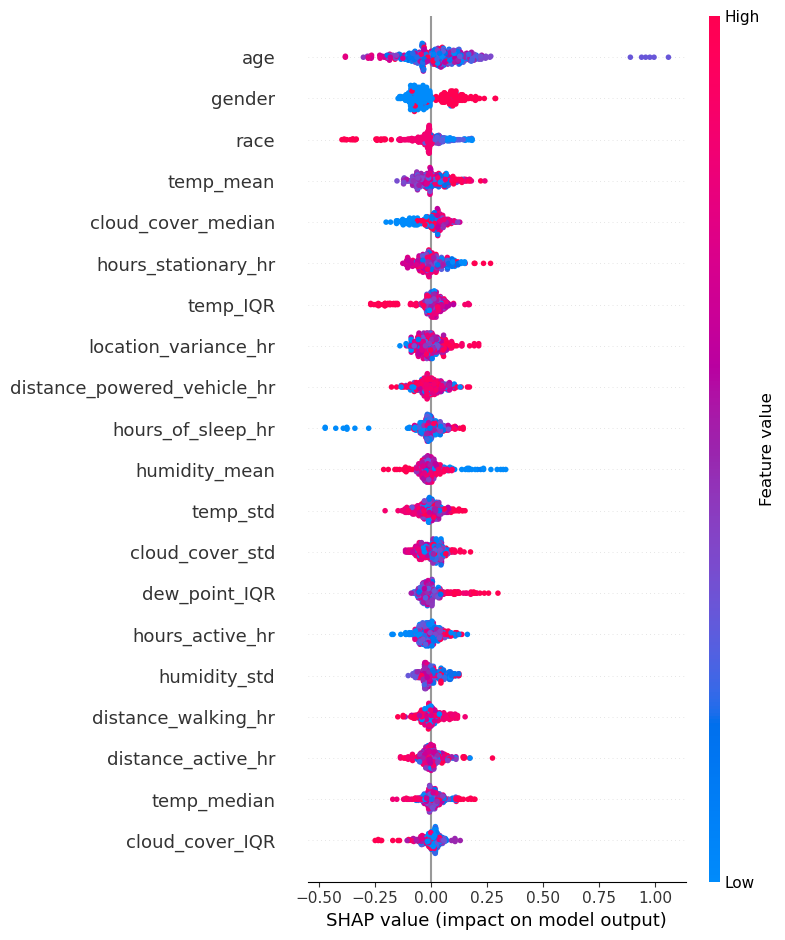

v2_day, XGBoost
cv score: -0.334, mae 1.065, pmc: -0.136
cv score: -0.398, mae 0.783, pmc: 0.036
cv score: -0.235, mae 0.837, pmc: 0.020
R² on test for XGBoost: -0.242, PMC: 0.043


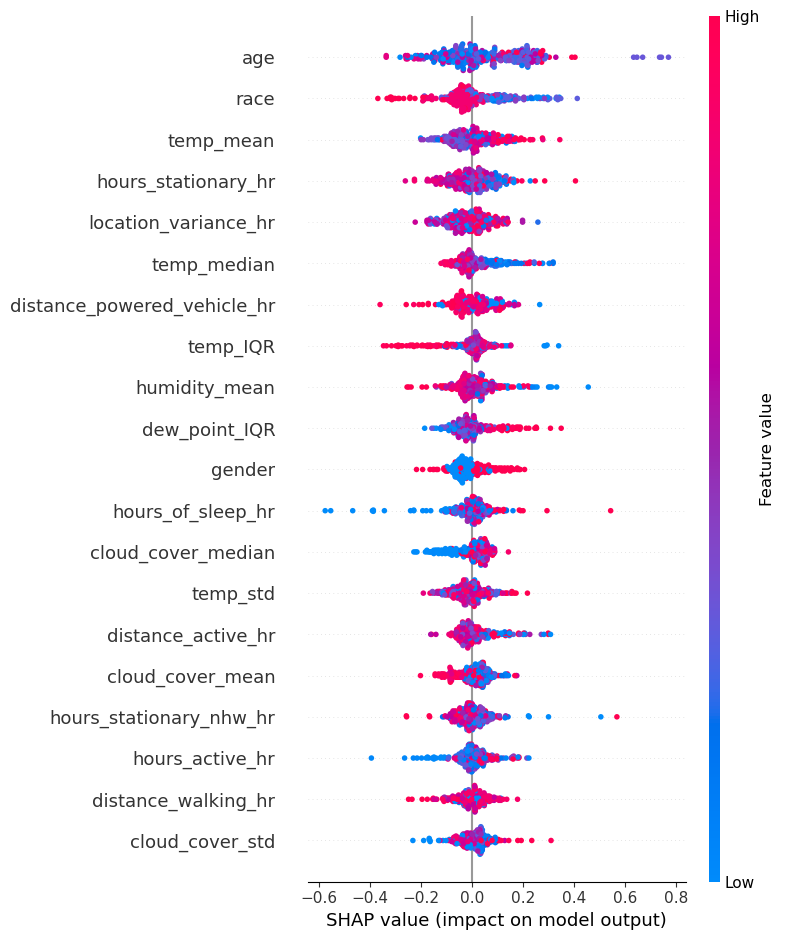

v2_day, CatBoost
cv score: -0.113, mae 0.990, pmc: -0.049
cv score: -0.398, mae 0.784, pmc: -0.004
cv score: -0.184, mae 0.818, pmc: -0.012
R² on test for CatBoost: -0.119, PMC: 0.044


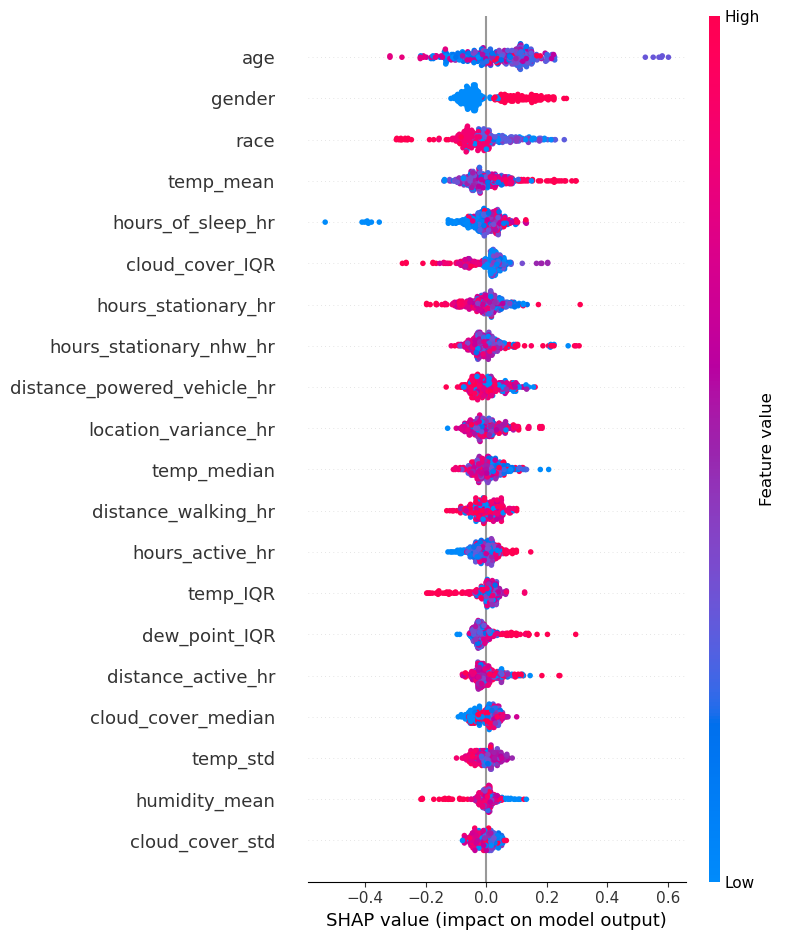

Training shapes: y (368,), X (368, 28)
v1_week, Hist Gradient Boost
cv score: 0.123, mae 0.336, pmc: 0.481
cv score: -0.193, mae 0.602, pmc: 0.164
cv score: -0.222, mae 0.431, pmc: 0.204
R² on test for Hist Gradient Boost: 0.053, PMC: 0.385


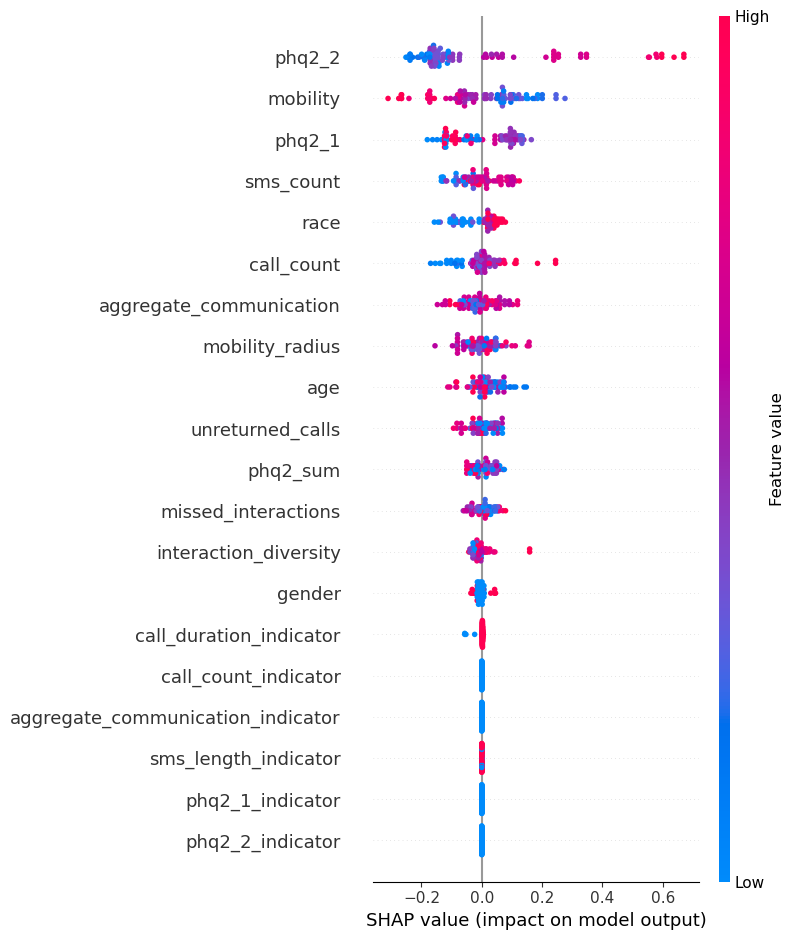

v1_week, XGBoost
cv score: -0.034, mae 0.377, pmc: 0.403
cv score: -0.253, mae 0.611, pmc: 0.158
cv score: -0.200, mae 0.442, pmc: 0.326
R² on test for XGBoost: 0.053, PMC: 0.381


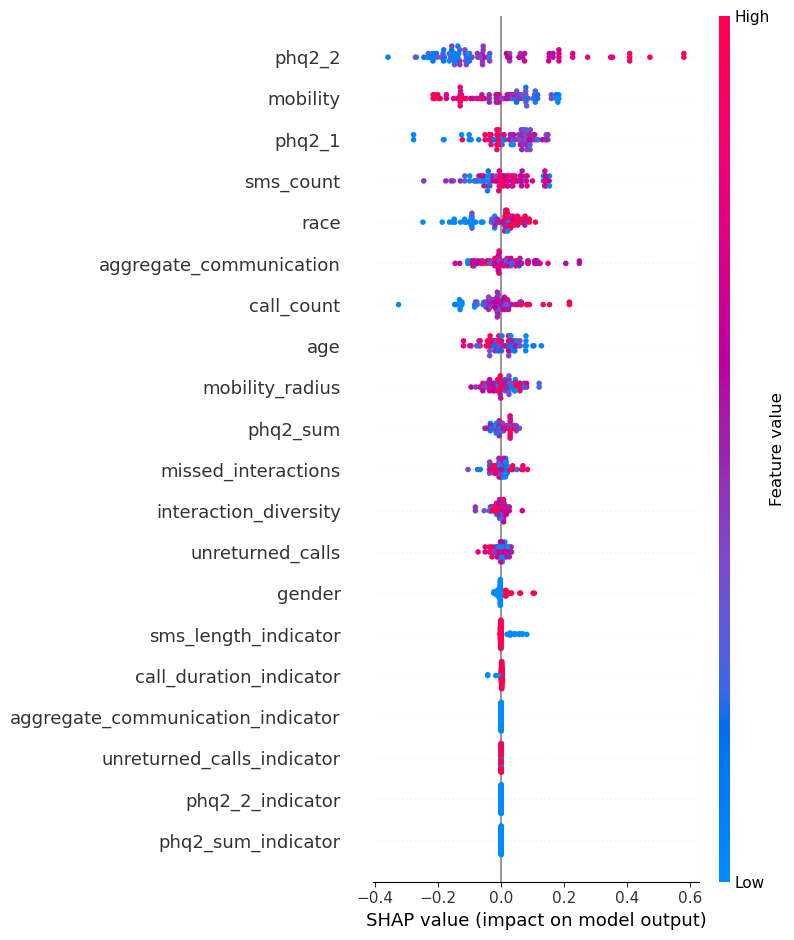

v1_week, CatBoost
cv score: 0.048, mae 0.359, pmc: 0.376
cv score: -0.068, mae 0.571, pmc: 0.220
cv score: -0.091, mae 0.413, pmc: 0.219
R² on test for CatBoost: 0.038, PMC: 0.365


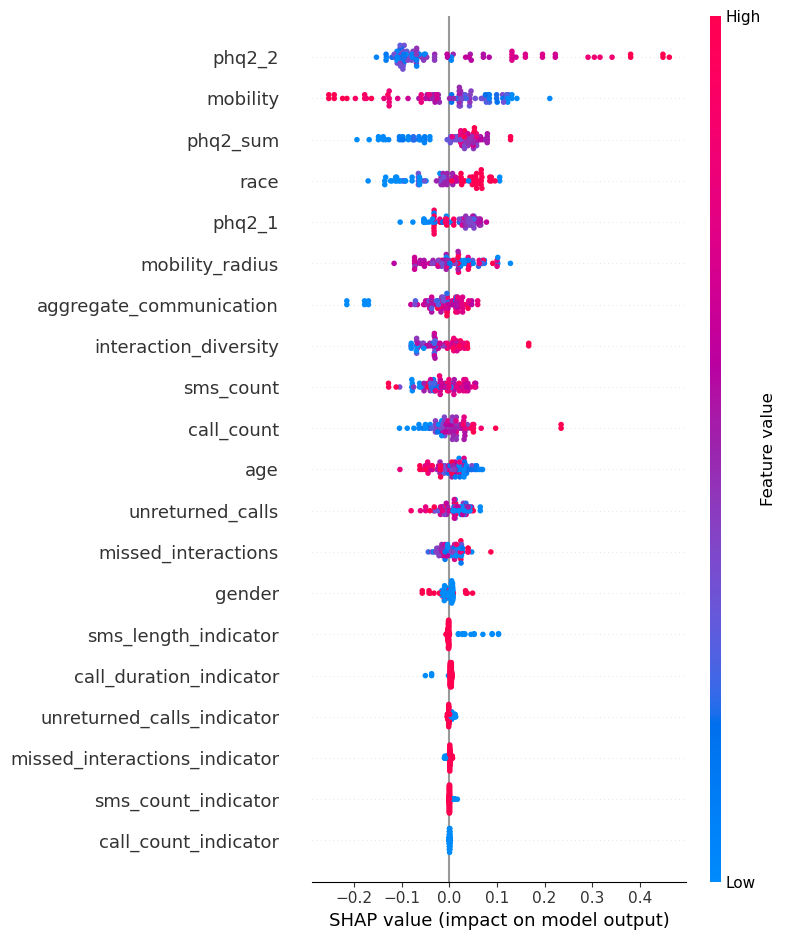

Training shapes: y (422,), X (422, 62)
v2_week, Hist Gradient Boost
cv score: 0.326, mae 0.586, pmc: 0.629
cv score: 0.329, mae 0.617, pmc: 0.587
cv score: 0.215, mae 0.651, pmc: 0.565
R² on test for Hist Gradient Boost: 0.258, PMC: 0.534


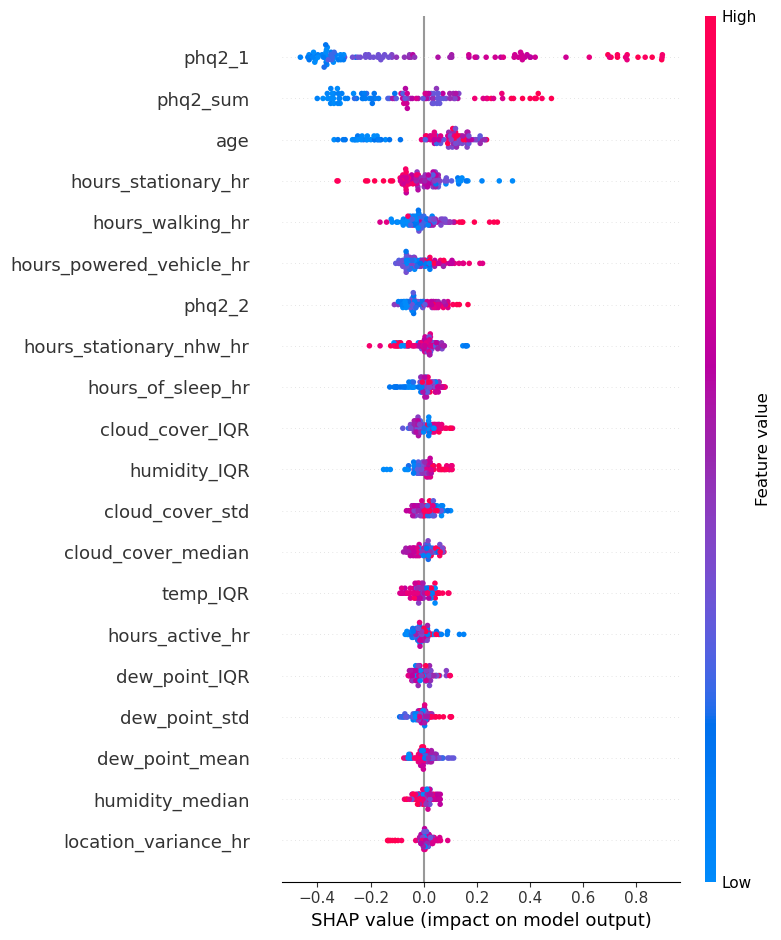

v2_week, XGBoost
cv score: 0.204, mae 0.627, pmc: 0.549
cv score: 0.201, mae 0.670, pmc: 0.511
cv score: 0.236, mae 0.630, pmc: 0.561
R² on test for XGBoost: 0.235, PMC: 0.537


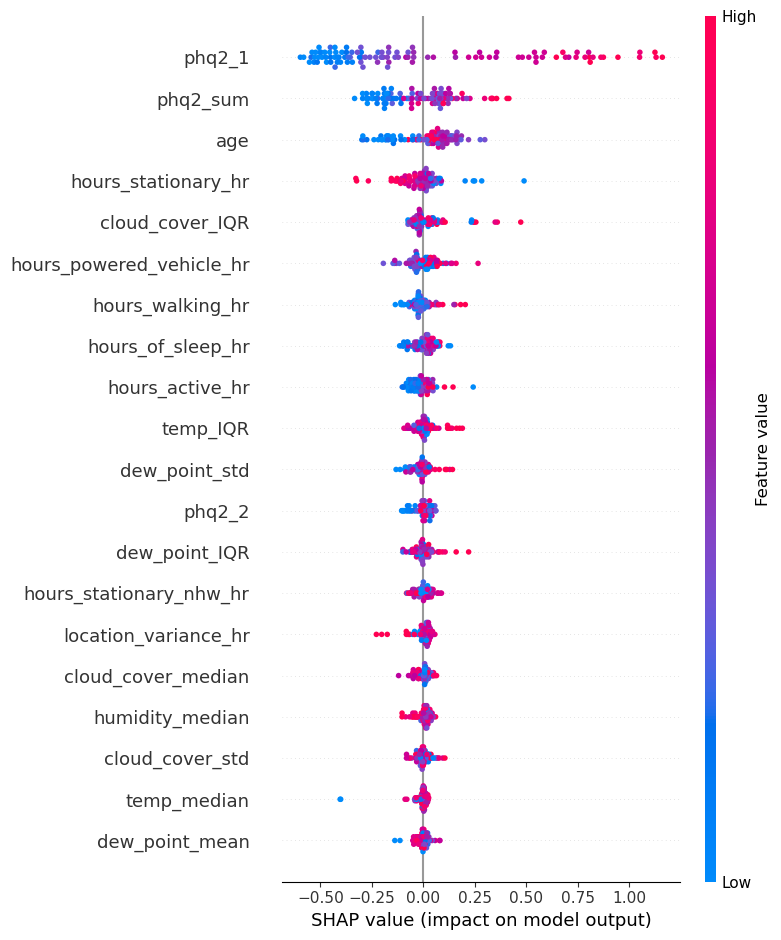

v2_week, CatBoost
cv score: 0.313, mae 0.603, pmc: 0.630
cv score: 0.355, mae 0.604, pmc: 0.600
cv score: 0.295, mae 0.614, pmc: 0.590
R² on test for CatBoost: 0.343, PMC: 0.622


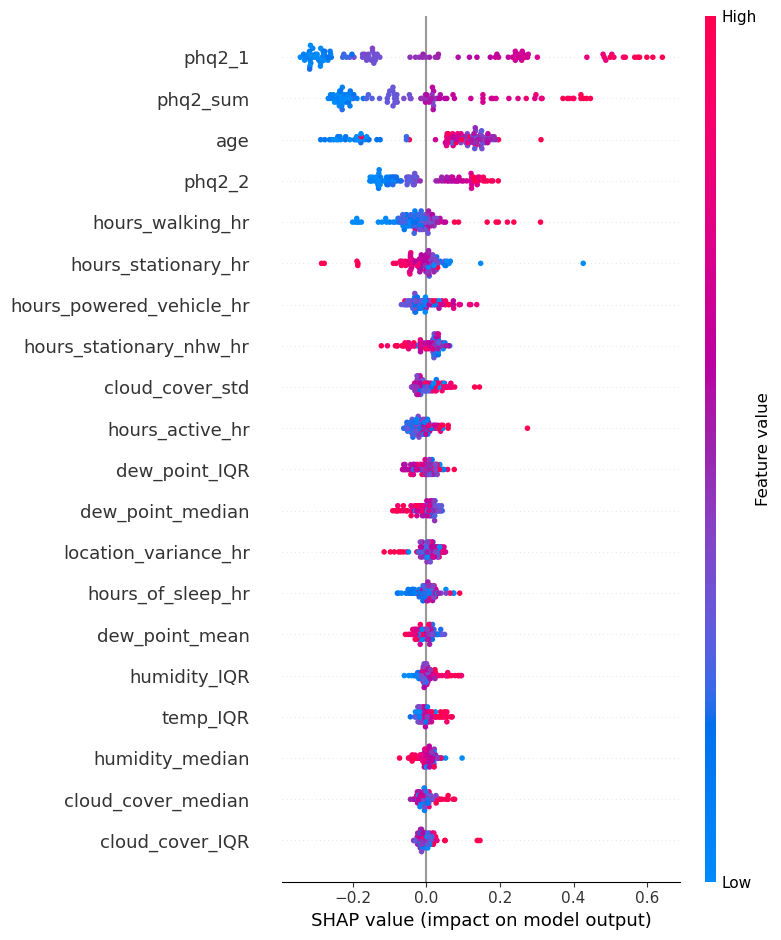

<Figure size 640x480 with 0 Axes>

In [7]:
## R2 and MAE for Non-imputed data

wNA_cv_results = {}
wNA_test_results = {}

for name in df_names:
    wNA_cv_results[name] = {}
    wNA_test_results[name] = {}
    X_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_X_train.csv'))
    y_train= pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_y_train.csv'))

    # Create KFold object which groups based on num ID
    gkf = GroupKFold(n_splits=5)
    groups = X_train['num_id']    # Set num_id for the groups
    # Now drop all other id columns 
    X_train_cleaned = X_train.drop(columns=[col for col in X_train.columns if col in id_columns or 'Unnamed' in col])
    y_train_cleaned = y_train.drop(columns=[col for col in y_train.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
    print(f'Training shapes: y {y_train_cleaned.shape}, X {X_train_cleaned.shape}')
    # Evaluate each classifier using cross-validation

    for reg_name, reg in regs_someNA:
        print(f'{name}, {reg_name}')
        wNA_cv_results[name][reg_name] = {}
        wNA_test_results[name][reg_name] = {}

        wNA_cv_results[name][reg_name]['r2'] = []
        wNA_cv_results[name][reg_name]['mae'] = []
        wNA_test_results[name][reg_name]['r2'] = []
        wNA_test_results[name][reg_name]['mae'] = []
        wNA_cv_results[name][reg_name]['pmc'] = []
        wNA_test_results[name][reg_name]['pmc'] = []

        # 5 fold cross validation
        gkf = GroupKFold(n_splits=3)
        # going through each CV split
        for train_idx, val_idx in gkf.split(X_train_cleaned, y_train_cleaned, groups=groups):
            X_tr, X_cv_val = X_train_cleaned.iloc[train_idx], X_train_cleaned.iloc[val_idx]
            y_tr, y_cv_val = y_train_cleaned.iloc[train_idx], y_train_cleaned.iloc[val_idx]
            try: 
                reg.fit(X_tr, y_tr)  # Now this reg is the trained model for this fold
                # Predict on CV
                y_cv_val_pred = reg.predict(X_cv_val)
                # Evaluate r2 CV score
                cv_score = r2_score(y_cv_val, y_cv_val_pred)
                cv_mae = mean_absolute_error(y_cv_val, y_cv_val_pred)
                cv_pmc = pearsonr(y_cv_val, y_cv_val_pred)
                print(f'cv score: {cv_score:.3f}, mae {cv_mae:.3f}, pmc: {cv_pmc[0]:.3f}')
                wNA_cv_results[name][reg_name]['r2'].append(cv_score)
                wNA_cv_results[name][reg_name]['mae'].append(cv_mae)
                wNA_cv_results[name][reg_name]['pmc'].append(cv_pmc[0])
            except Exception as e: 
                print(f"ERROR: {e}")
        
        # For that reg, predict test
        X_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_X_val.csv'))
        X_val_cleaned = X_val.drop(columns=[col for col in X_val.columns if col in id_columns or 'Unnamed' in col])
        y_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_y_val.csv'))
        y_val_cleaned = y_val.drop(columns=[col for col in y_val.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
        # Fit that reg
        reg.fit(X_train_cleaned, y_train_cleaned)
        y_val_pred = reg.predict(X_val_cleaned)
        # Evaluate r2 test score
        test_score = r2_score(y_val_cleaned, y_val_pred)
        test_mae = mean_absolute_error(y_val_cleaned, y_val_pred)
        test_pmc = pearsonr(y_val_cleaned, y_val_pred)
        print(f'R² on test for {reg_name}: {test_score:.3f}, PMC: {test_pmc[0]:.3f}')
        wNA_test_results[name][reg_name]['r2'].append(test_score)
        wNA_test_results[name][reg_name]['mae'].append(test_mae)
        wNA_test_results[name][reg_name]['pmc'].append(test_pmc[0])
        if 'Ada' not in reg_name and "agging" not in reg_name:
            explainer = shap.Explainer(reg)
            shap_values = explainer.shap_values(X_val_cleaned)
            shap.summary_plot(shap_values, X_val_cleaned,show=False)
            plt.savefig(os.path.join(shap_dir, f"shap_{name}_{reg_name}_non-imputed.png"), bbox_inches="tight", dpi=300)
            plt.show()
            plt.clf()   # (Optional) Clear the figure to avoid overlap with future plots



,Dataset,Regressor,Metric,Score
0,v1_day,Hist Gradient Boost,r2,-0.313951
1,v1_day,Hist Gradient Boost,r2,-0.293002
2,v1_day,Hist Gradient Boost,r2,-0.178630
3,v1_day,Hist Gradient Boost,mae,1.090986
4,v1_day,Hist Gradient Boost,mae,0.973993
...,...,...,...,...
103,v2_week,CatBoost,mae,0.604295
104,v2_week,CatBoost,mae,0.613840
105,v2_week,CatBoost,pmc,0.629631
106,v2_week,CatBoost,pmc,0.600406


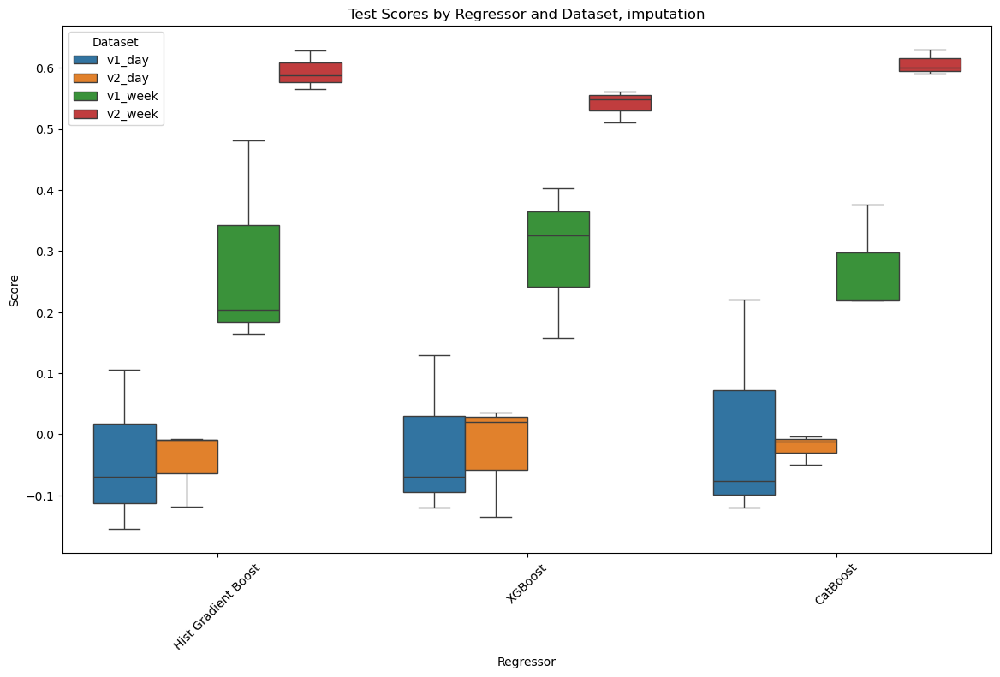

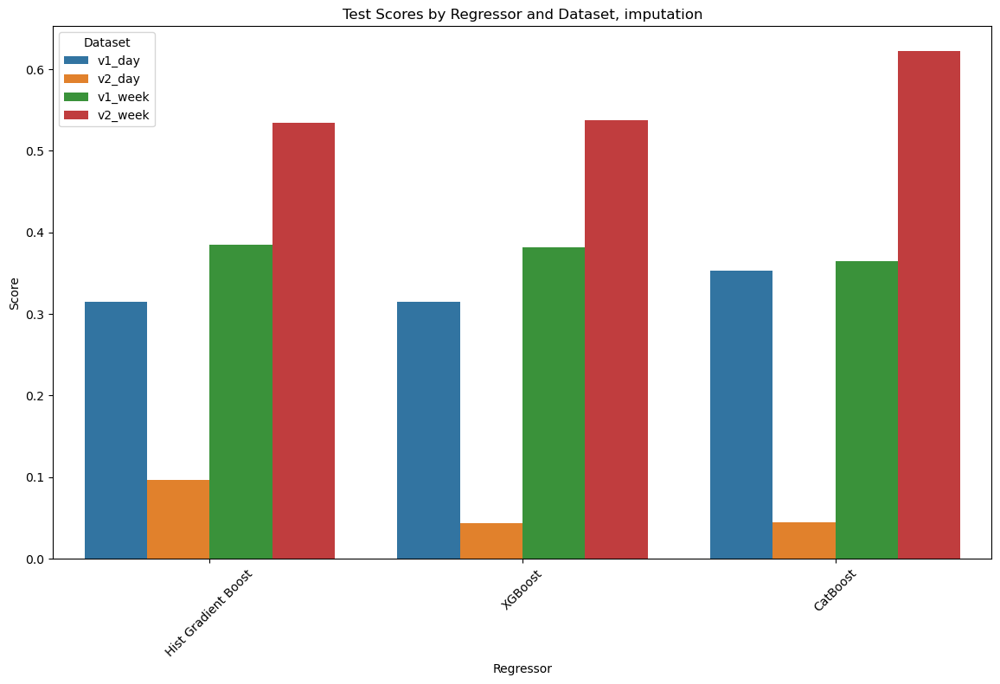

In [8]:

## CV Score Plotting
# Extract test data to flattened df for plotting
wNA_flat_cv_results = []

# iterate over each dataset name
for dataset_name, reg_results in wNA_cv_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                for cv_score in metrics[metric]:
                    wNA_flat_cv_results.append({
                        'Dataset': dataset_name,
                        'Regressor': reg_name,
                        'Metric': metric,
                        'Score': cv_score,
                    })
                    
wNA_flat_cv_results_df = pd.DataFrame(wNA_flat_cv_results)
wNA_flat_cv_results_df.to_csv(os.path.join(brighten_dir, 'wNA_flat_cv_results_df.csv'))
display(wNA_flat_cv_results_df)

plt.figure(figsize=(14, 8))
sns.boxplot(x='Regressor', y='Score', hue='Dataset', data=wNA_flat_cv_results_df[wNA_flat_cv_results_df['Metric']=='pmc'])
plt.xticks(rotation=45)
plt.title('Test Scores by Regressor and Dataset, imputation')
plt.savefig(os.path.join(cv_dir, 'PMC Pearson R CV Scores by Regressor and Dataset on _train dataset, NO imputation, before tuning.png'))
plt.show()


## TEST Results Plotting

# Extract test data to flattened df for plotting
wNA_flat_test_results = []

# iterate over each dataset name
for dataset_name, reg_results in wNA_test_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                wNA_flat_test_results.append({
                    'Dataset': dataset_name,
                    'Regressor': reg_name,
                    'Metric': metric,
                    'Score': metrics[metric][0],
                })
wNA_flat_test_results_df = pd.DataFrame(wNA_flat_test_results)


plt.figure(figsize=(14, 8))
sns.barplot(x='Regressor', y='Score', hue='Dataset', data=wNA_flat_test_results_df[wNA_flat_test_results_df['Metric']=='pmc'])
plt.xticks(rotation=45)
plt.title('Test Scores by Regressor and Dataset, imputation')
plt.savefig(os.path.join(val_dir, 'PMC Pearson R Test Scores by Regressor and Dataset on _val dataset, NO imputation, before tuning.png'))
plt.show()


# results_wNA_grouped = wNA_flat_test_results_df.groupby(['Dataset', 'Regressor']).agg('mean')
# results_wNA_grouped.to_csv(os.path.join(brighten_dir, 'results_wNA_grouped.csv'))





Training shapes: y (49489,), X (49489, 64)
v1_day, Hist Gradient Boost
cv score: -0.056, mae 0.809, pearson: 0.182
cv score: 0.048, mae 0.829, pearson: 0.274
cv score: 0.064, mae 0.805, pearson: 0.303
R² on test for Hist Gradient Boost: 0.220, PMC 0.4962188898800406, MAE: 0.693


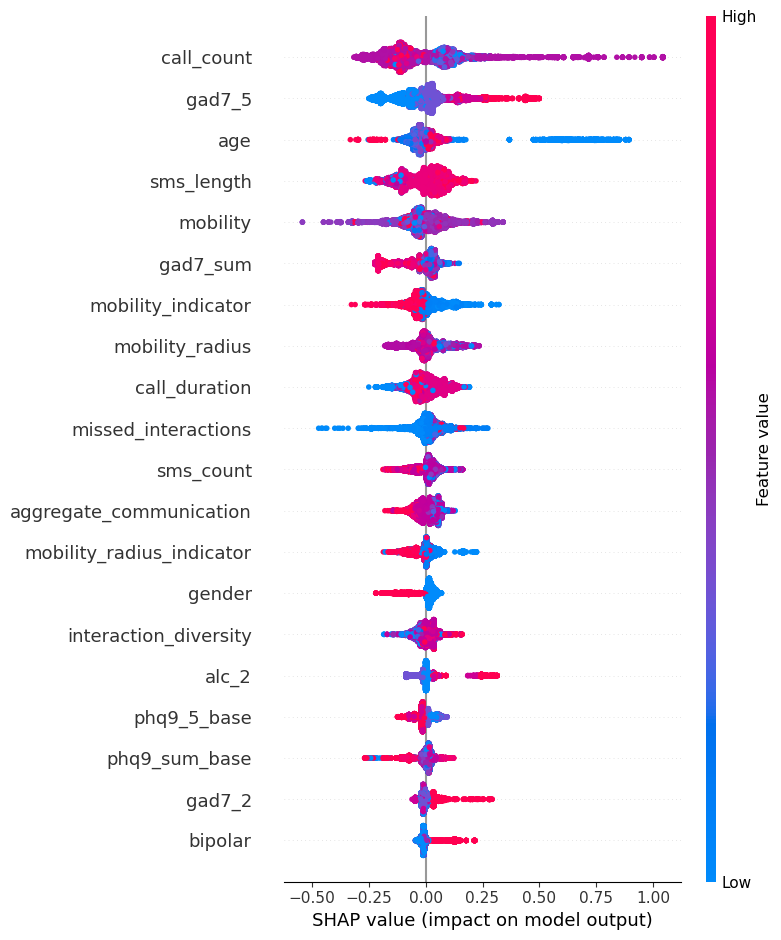

v1_day, XGBoost
cv score: -0.213, mae 0.867, pearson: 0.132
cv score: -0.022, mae 0.842, pearson: 0.251
cv score: -0.038, mae 0.875, pearson: 0.238
R² on test for XGBoost: 0.242, PMC 0.5349623561575853, MAE: 0.653


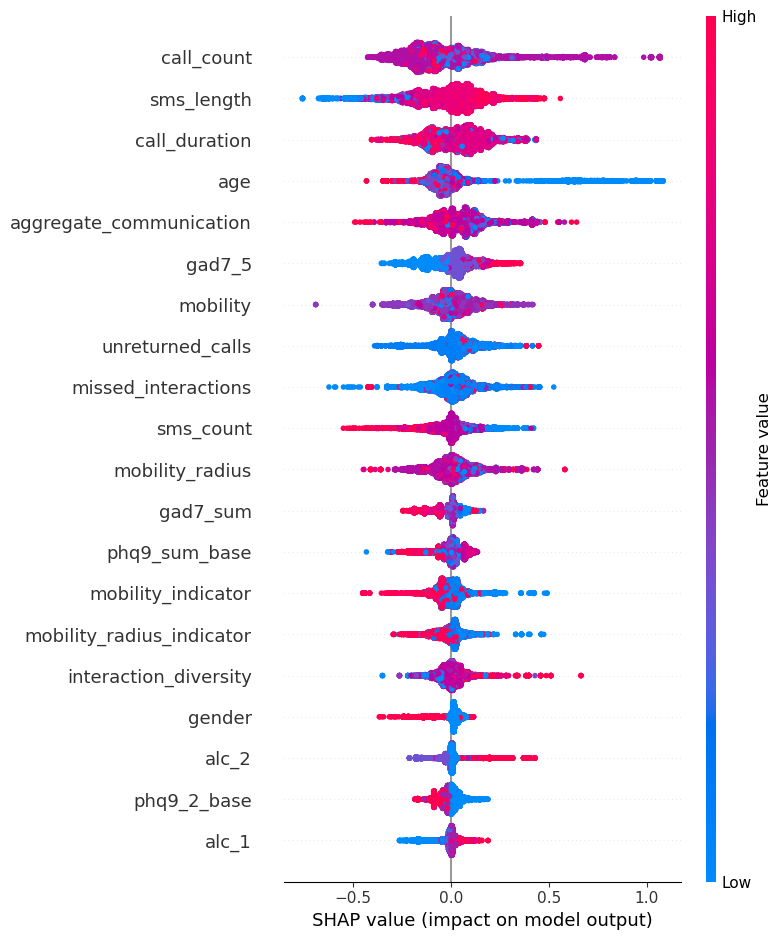

v1_day, CatBoost
cv score: -0.064, mae 0.812, pearson: 0.171
cv score: 0.078, mae 0.815, pearson: 0.303
cv score: 0.154, mae 0.767, pearson: 0.413
R² on test for CatBoost: 0.268, PMC 0.543179923188102, MAE: 0.665


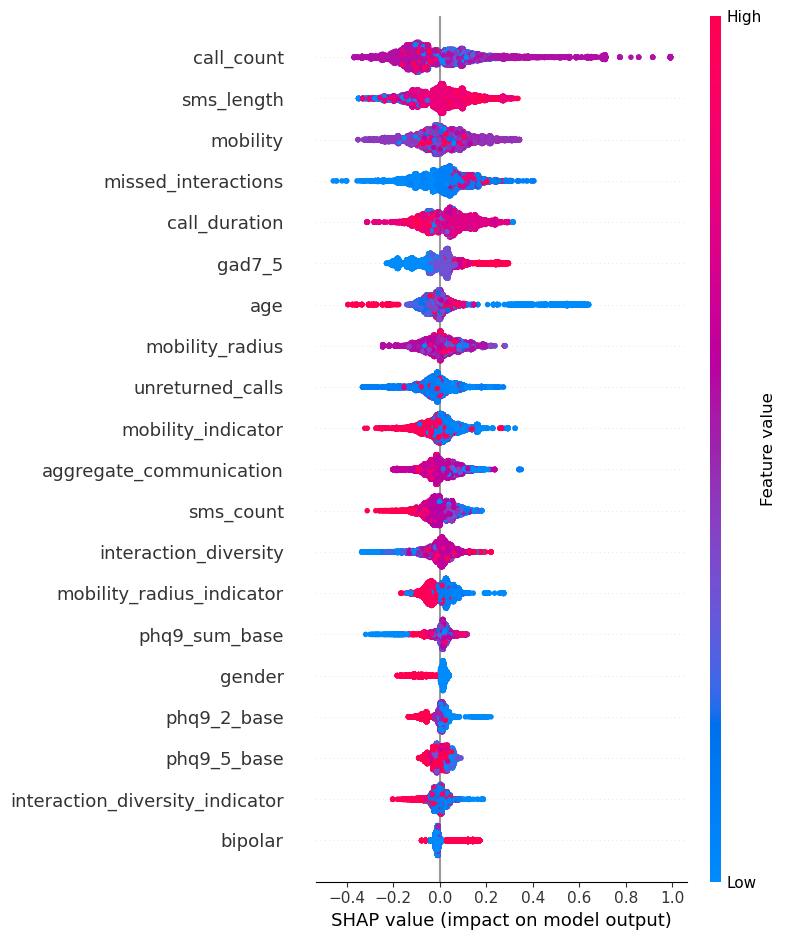

Training shapes: y (1545,), X (1545, 97)
v2_day, Hist Gradient Boost
cv score: -2.689, mae 1.523, pearson: 0.079
cv score: -0.295, mae 1.011, pearson: -0.132
cv score: -0.146, mae 1.113, pearson: 0.298
R² on test for Hist Gradient Boost: -0.371, PMC 0.02849131383772267, MAE: 0.827


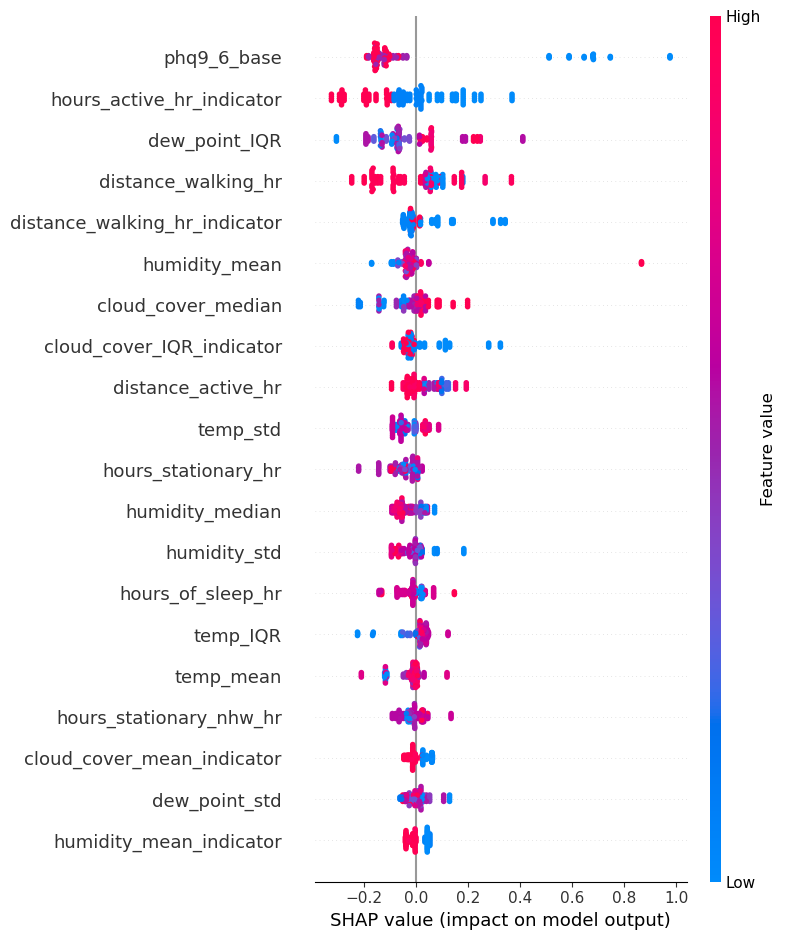

v2_day, XGBoost
cv score: -3.359, mae 1.619, pearson: 0.082
cv score: -0.114, mae 1.001, pearson: 0.105
cv score: -0.047, mae 1.039, pearson: 0.257
R² on test for XGBoost: -0.302, PMC 0.07882939803937515, MAE: 0.829


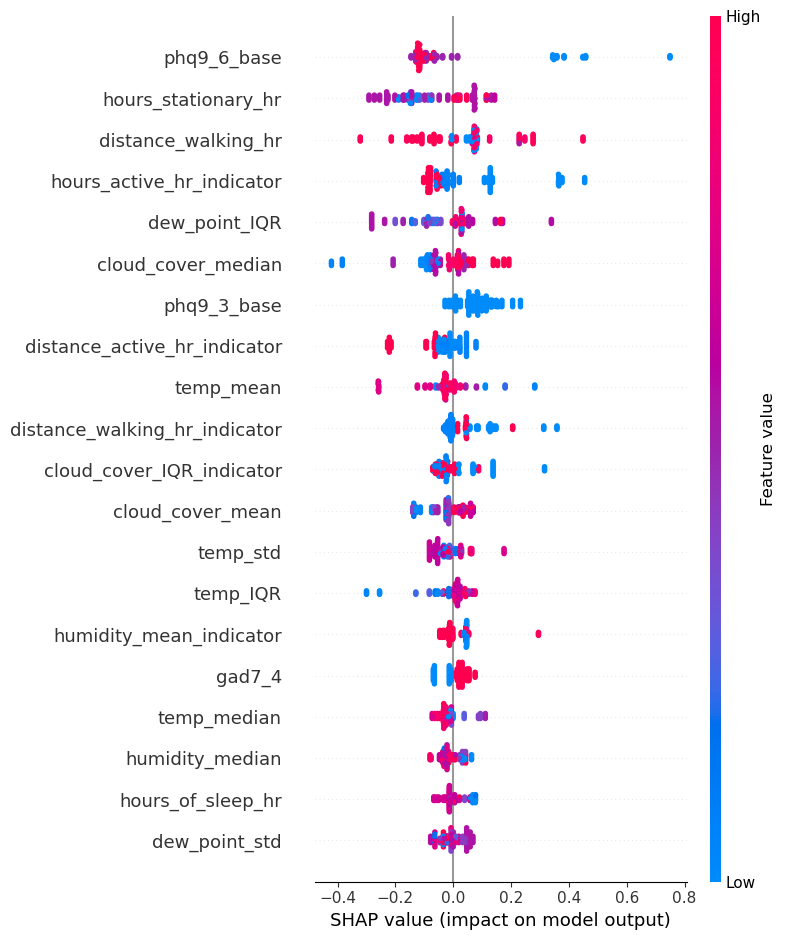

v2_day, CatBoost
cv score: -0.817, mae 1.070, pearson: 0.108
cv score: -0.118, mae 0.944, pearson: 0.004
cv score: 0.075, mae 0.920, pearson: 0.306
R² on test for CatBoost: -0.165, PMC 0.12878732280543861, MAE: 0.809


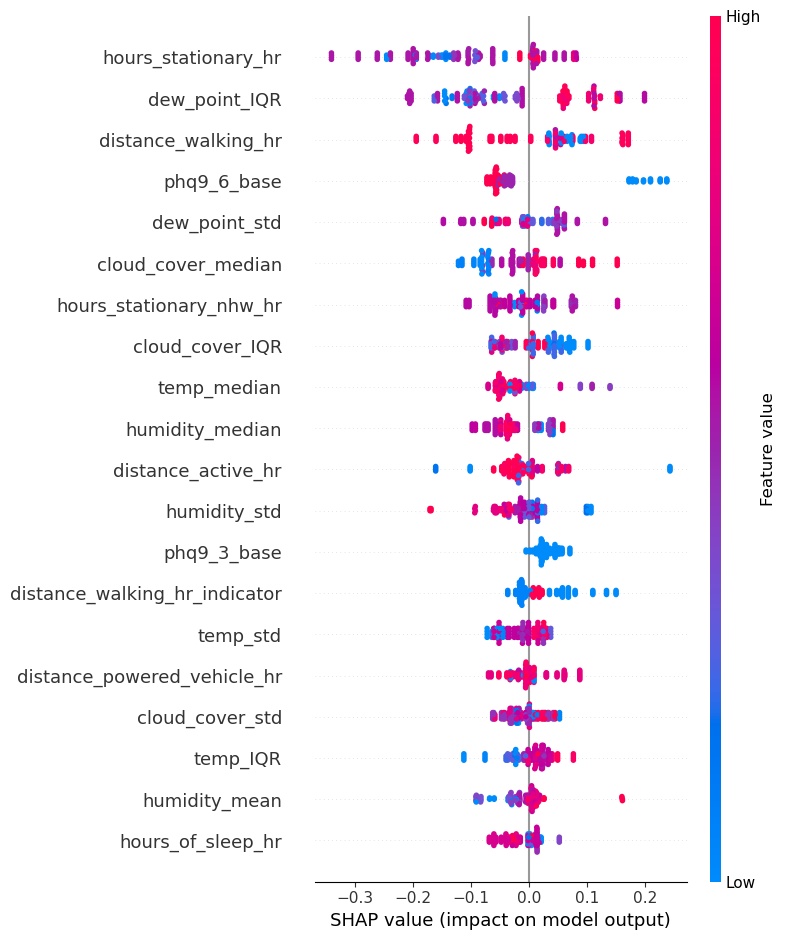

Training shapes: y (4033,), X (4033, 57)
v1_week, Hist Gradient Boost
cv score: 0.265, mae 1.058, pearson: 0.537
cv score: 0.280, mae 1.029, pearson: 0.559
cv score: 0.243, mae 0.979, pearson: 0.539
R² on test for Hist Gradient Boost: 0.551, PMC 0.7449070283205864, MAE: 0.714


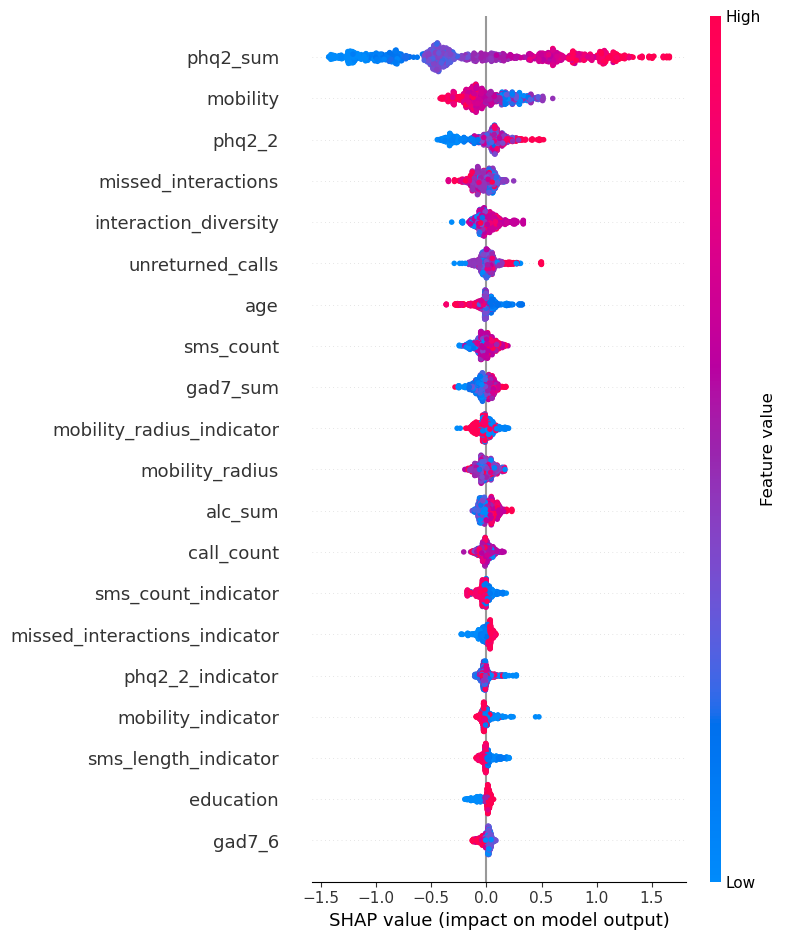

v1_week, XGBoost
cv score: 0.211, mae 1.085, pearson: 0.510
cv score: 0.208, mae 1.071, pearson: 0.530
cv score: 0.135, mae 1.033, pearson: 0.470
R² on test for XGBoost: 0.437, PMC 0.6750513495031699, MAE: 0.785


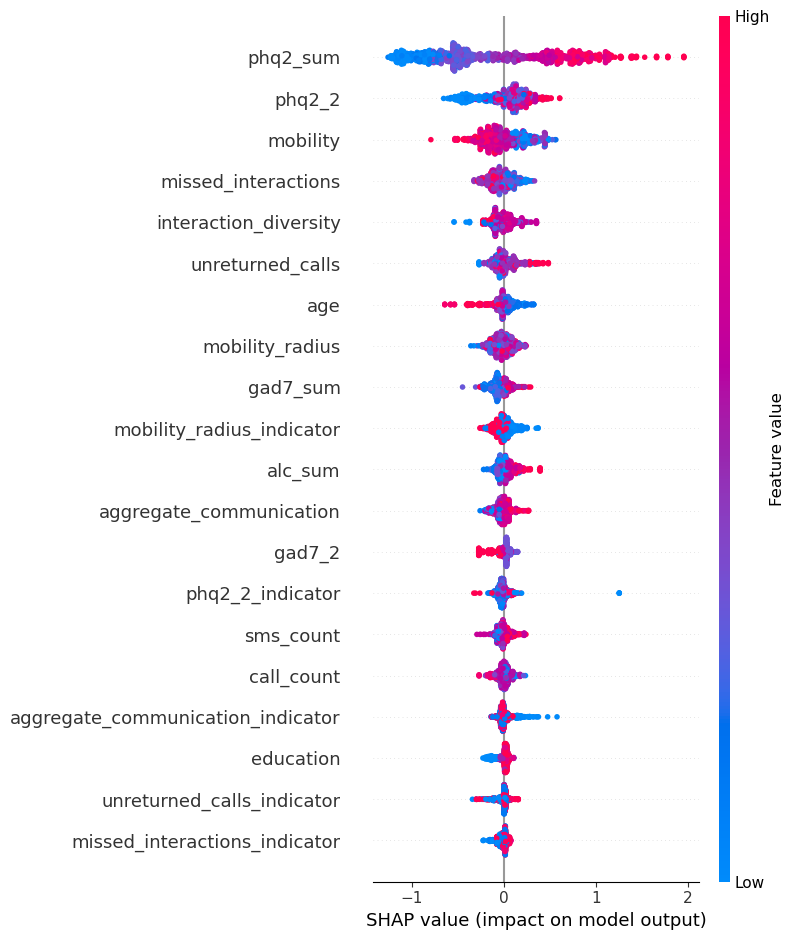

v1_week, CatBoost
cv score: 0.340, mae 0.999, pearson: 0.589
cv score: 0.274, mae 1.041, pearson: 0.540
cv score: 0.262, mae 0.964, pearson: 0.538
R² on test for CatBoost: 0.582, PMC 0.765330949316858, MAE: 0.704


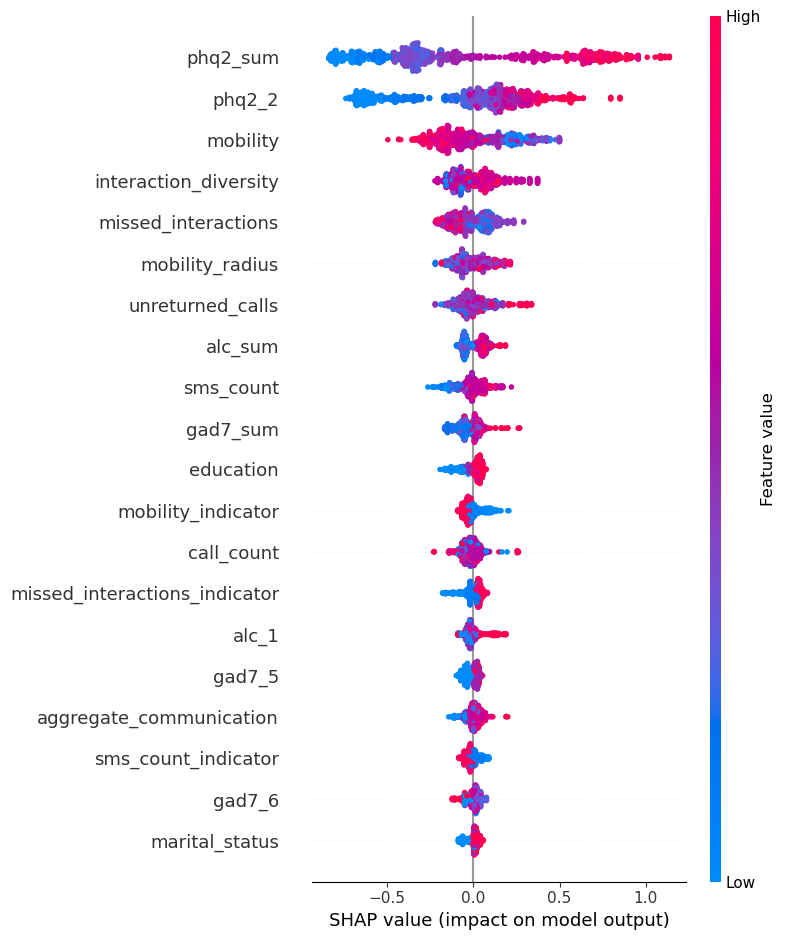

Training shapes: y (99,), X (99, 91)
v2_week, Hist Gradient Boost
cv score: -0.899, mae 1.635, pearson: 0.703
cv score: -0.169, mae 0.696, pearson: 0.851
cv score: 0.152, mae 1.932, pearson: 0.533
R² on test for Hist Gradient Boost: -0.302, PMC 0.9457555611577969, MAE: 0.620


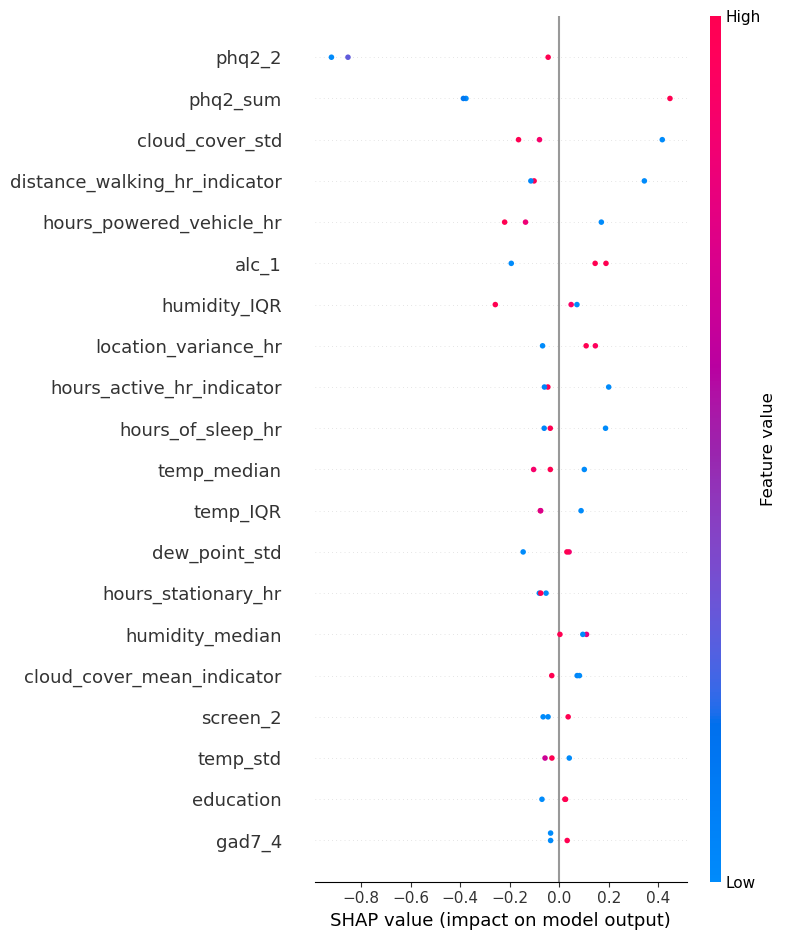

v2_week, XGBoost
cv score: -2.197, mae 2.285, pearson: 0.183
cv score: -0.948, mae 1.108, pearson: 0.852
cv score: -0.057, mae 2.270, pearson: 0.171
R² on test for XGBoost: -0.034, PMC 0.999072329181631, MAE: 0.426


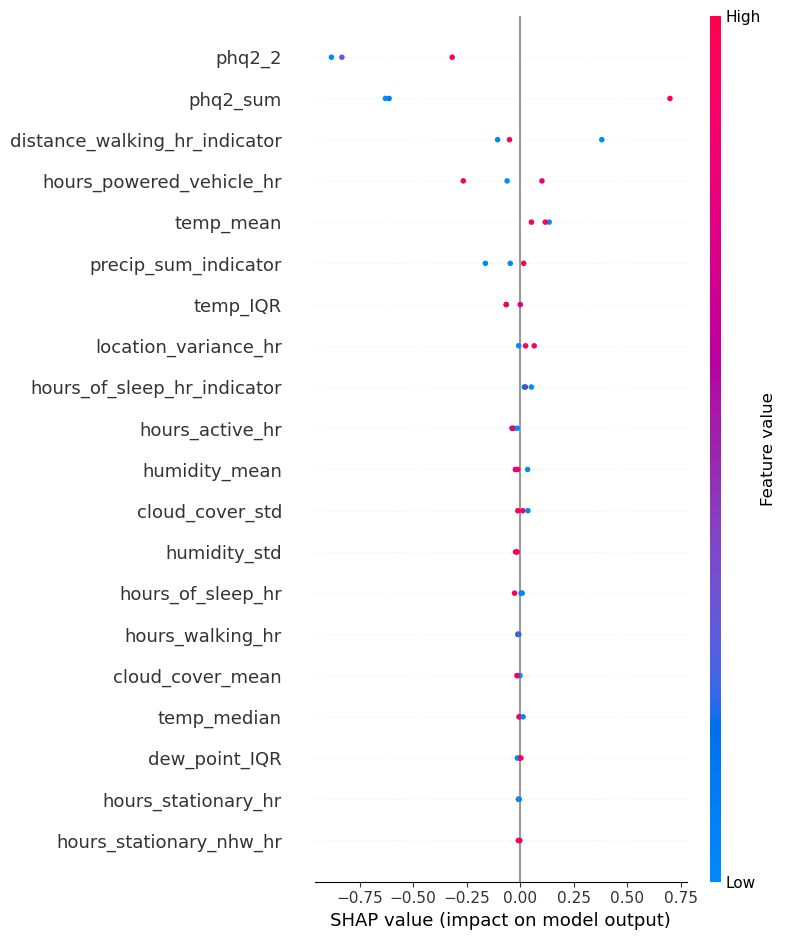

v2_week, CatBoost
cv score: -0.960, mae 1.842, pearson: 0.797
cv score: -2.374, mae 1.509, pearson: 0.741
cv score: -0.006, mae 1.980, pearson: 0.610
R² on test for CatBoost: -1.424, PMC 0.9579976254562028, MAE: 0.833


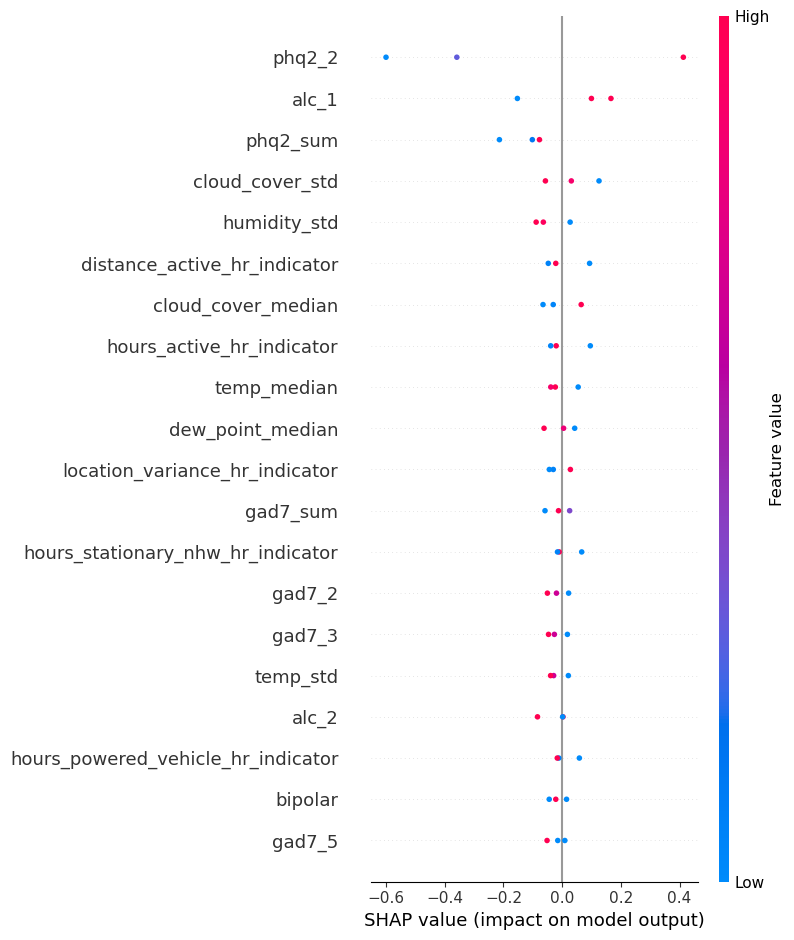

<Figure size 640x480 with 0 Axes>

In [9]:
## R2 and MAE for Non-imputed data

alldem_cv_results = {}
alldem_test_results = {}

for name in df_names:
    alldem_cv_results[name] = {}
    alldem_test_results[name] = {}
    X_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_imp_alldem_X_train.csv'))
    y_train= pd.read_csv(os.path.join(brighten_dir, f'{name}_imp_alldem_y_train.csv'))

    # Create KFold object which groups based on num ID
    gkf = GroupKFold(n_splits=5)
    groups = X_train['num_id']    # Set num_id for the groups
    # Now drop all other id columns 
    X_train_cleaned = X_train.drop(columns=[col for col in X_train.columns if col in id_columns or 'Unnamed' in col])
    y_train_cleaned = y_train.drop(columns=[col for col in y_train.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
    print(f'Training shapes: y {y_train_cleaned.shape}, X {X_train_cleaned.shape}')
    # Evaluate each classifier using cross-validation

    for reg_name, reg in regs_someNA:
        print(f'{name}, {reg_name}')
        alldem_cv_results[name][reg_name] = {}
        alldem_test_results[name][reg_name] = {}

        alldem_cv_results[name][reg_name]['r2'] = []
        alldem_cv_results[name][reg_name]['mae'] = []
        alldem_cv_results[name][reg_name]['pmc'] = []

        alldem_test_results[name][reg_name]['r2'] = []
        alldem_test_results[name][reg_name]['mae'] = []
        alldem_test_results[name][reg_name]['pmc'] = []

        # 5 fold cross validation
        gkf = GroupKFold(n_splits=3)
        # going through each CV split
        for train_idx, val_idx in gkf.split(X_train_cleaned, y_train_cleaned, groups=groups):
            X_tr, X_cv_val = X_train_cleaned.iloc[train_idx], X_train_cleaned.iloc[val_idx]
            y_tr, y_cv_val = y_train_cleaned.iloc[train_idx], y_train_cleaned.iloc[val_idx]
            try: 
                reg.fit(X_tr, y_tr)  # Now this reg is the trained model for this fold
                # Predict on CV
                y_cv_val_pred = reg.predict(X_cv_val)
                # Evaluate r2 CV score
                cv_score = r2_score(y_cv_val, y_cv_val_pred)
                cv_mae = mean_absolute_error(y_cv_val, y_cv_val_pred)
                cv_pmc = pearsonr(y_cv_val, y_cv_val_pred)
                print(f'cv score: {cv_score:.3f}, mae {cv_mae:.3f}, pearson: {cv_pmc[0]:.3f}')
                alldem_cv_results[name][reg_name]['r2'].append(cv_score)
                alldem_cv_results[name][reg_name]['mae'].append(cv_mae)
                alldem_cv_results[name][reg_name]['pmc'].append(cv_pmc[0])
            except Exception as e: 
                print(f"ERROR: {e}")
        
        # For that reg, predict test
        X_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_imp_alldem_X_val.csv'))
        X_val_cleaned = X_val.drop(columns=[col for col in X_val.columns if col in id_columns or 'Unnamed' in col])
        y_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_imp_alldem_y_val.csv'))
        y_val_cleaned = y_val.drop(columns=[col for col in y_val.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
        # Fit that reg
        reg.fit(X_train_cleaned, y_train_cleaned)
        y_val_pred = reg.predict(X_val_cleaned)
        # Evaluate r2 test score
        test_score = r2_score(y_val_cleaned, y_val_pred)
        test_mae = mean_absolute_error(y_val_cleaned, y_val_pred)
        test_pmc = pearsonr(y_val_cleaned, y_val_pred)
        print(f'R² on test for {reg_name}: {test_score:.3f}, PMC {test_pmc[0]}, MAE: {test_mae:.3f}')
        alldem_test_results[name][reg_name]['r2'].append(test_score)
        alldem_test_results[name][reg_name]['mae'].append(test_mae)
        alldem_test_results[name][reg_name]['pmc'].append(test_pmc[0])
        if 'Ada' not in reg_name and "agging" not in reg_name:
            explainer = shap.Explainer(reg)
            shap_values = explainer.shap_values(X_val_cleaned)
            shap.summary_plot(shap_values, X_val_cleaned, show=False)
            plt.savefig(os.path.join(shap_dir, f"shap_{name}_{reg_name}_imputed-alldem.png"), bbox_inches="tight", dpi=300)
            plt.show()
            plt.clf()   # (Optional) Clear the figure to avoid overlap with future plots


,Dataset,Regressor,Metric,Score
0,v1_day,Hist Gradient Boost,r2,-0.056224
1,v1_day,Hist Gradient Boost,r2,0.047981
2,v1_day,Hist Gradient Boost,r2,0.064050
3,v1_day,Hist Gradient Boost,mae,0.808925
4,v1_day,Hist Gradient Boost,mae,0.828801
...,...,...,...,...
103,v2_week,CatBoost,mae,1.509050
104,v2_week,CatBoost,mae,1.980484
105,v2_week,CatBoost,pmc,0.797241
106,v2_week,CatBoost,pmc,0.741097


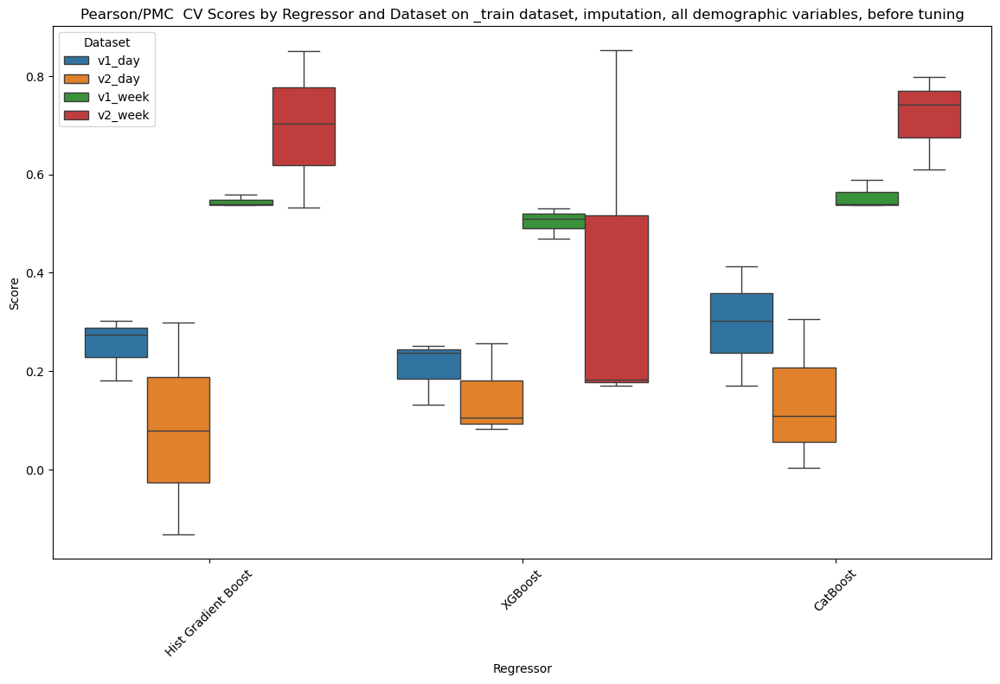

,v1_day,v2_day,v1_week,v2_week
Hist Gradient Boost,"{'r2': [0.22023738409444238], 'mae': [0.692875...","{'r2': [-0.3713349372532708], 'mae': [0.827409...","{'r2': [0.5510302726215845], 'mae': [0.7143045...","{'r2': [-0.3019212177471875], 'mae': [0.620137..."
XGBoost,"{'r2': [0.24243027529915706], 'mae': [0.653453...","{'r2': [-0.3021373387988209], 'mae': [0.828846...","{'r2': [0.43707396225194706], 'mae': [0.784699...","{'r2': [-0.03416412431256832], 'mae': [0.42566..."
CatBoost,"{'r2': [0.267623299040182], 'mae': [0.66489595...","{'r2': [-0.16530380574330317], 'mae': [0.80890...","{'r2': [0.5823732755387033], 'mae': [0.7037133...","{'r2': [-1.4244043814764757], 'mae': [0.832522..."


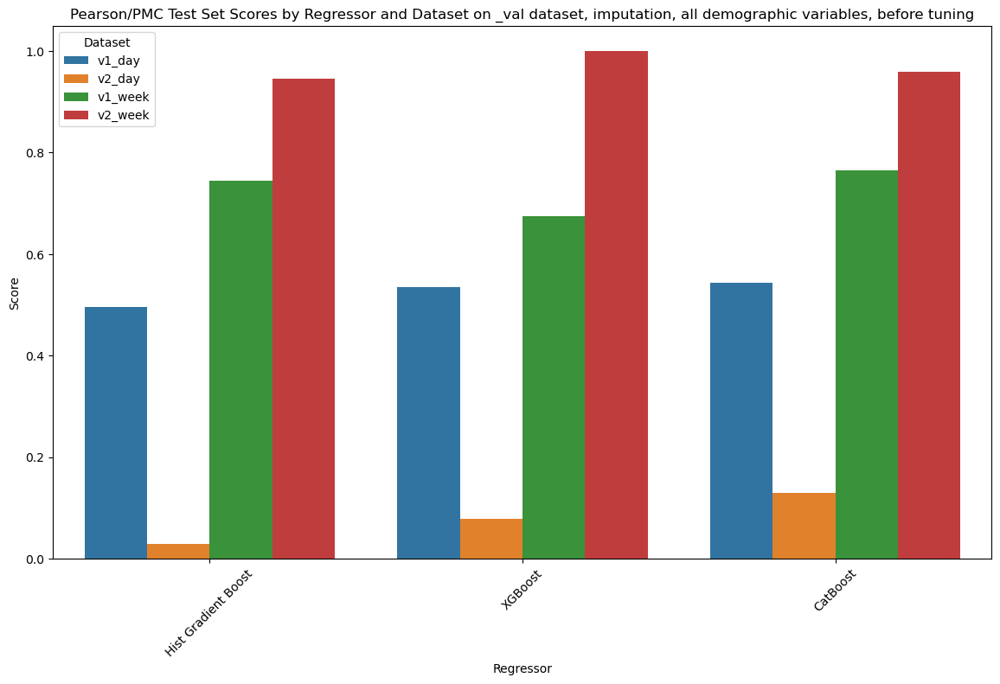

In [10]:

## CV Score Plotting
# Extract test data to flattened df for plotting
alldem_flat_cv_results = []

# iterate over each dataset name
for dataset_name, reg_results in alldem_cv_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                for cv_score in metrics[metric]:
                    alldem_flat_cv_results.append({
                        'Dataset': dataset_name,
                        'Regressor': reg_name,
                        'Metric': metric,
                        'Score': cv_score,
                    })
                    
alldem_flat_cv_results_df = pd.DataFrame(alldem_flat_cv_results)
alldem_flat_cv_results_df.to_csv(os.path.join(brighten_dir, 'alldem_flat_cv_results_df.csv'))

display(alldem_flat_cv_results_df)

plt.figure(figsize=(14, 8))
sns.boxplot(x='Regressor', y='Score', hue='Dataset', data=alldem_flat_cv_results_df[alldem_flat_cv_results_df['Metric']=='pmc'])
plt.xticks(rotation=45)
plt.title('Pearson/PMC  CV Scores by Regressor and Dataset on _train dataset, imputation, all demographic variables, before tuning')
plt.savefig(os.path.join(cv_dir, 'Pearson PMC  CV Scores by Regressor and Dataset on _train dataset, imputation, all demographic variables, before tuning.png'))
plt.show()



## TEST Results Plotting
alldem_test_results_df = pd.DataFrame(alldem_test_results)
alldem_test_results_df.to_csv(os.path.join(brighten_dir, 'alldem_test_results_df.csv'))
display(alldem_test_results_df)


# Extract test data to flattened df for plotting
alldem_flat_test_results = []

# iterate over each dataset name
for dataset_name, reg_results in alldem_test_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                alldem_flat_test_results.append({
                    'Dataset': dataset_name,
                    'Regressor': reg_name,
                    'Metric': metric,
                    'Score': metrics[metric][0],
                })
alldem_flat_test_results_df = pd.DataFrame(alldem_flat_test_results)

plt.figure(figsize=(14, 8))
sns.barplot(x='Regressor', y='Score', hue='Dataset', data=alldem_flat_test_results_df[alldem_flat_test_results_df['Metric']=='pmc'])
plt.xticks(rotation=45)
plt.title('Pearson/PMC Test Set Scores by Regressor and Dataset on _val dataset, imputation, all demographic variables, before tuning')
plt.savefig(os.path.join(val_dir, 'Pearson PMC Test Set Scores by Regressor and Dataset on _val dataset, imputation, all demographic variables, before tuning.png'))
plt.show()



## PCA

v1_day, Decision Tree
cv score: -0.6553138059376882, mae 0.8892772505785699
cv score: -0.5526897091607739, mae 0.818553538466711
cv score: -0.9009310844167269, mae 1.0985642112277
R² on test for Decision Tree: -0.163, PMC: 0.473, MAE: 0.607


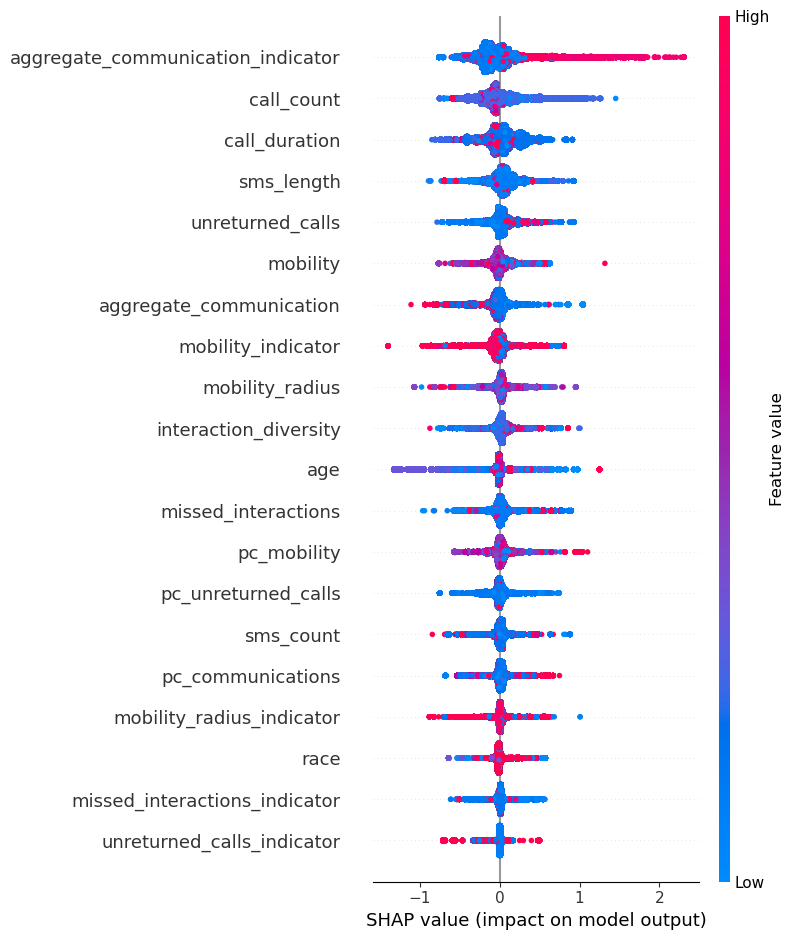

v1_day, Hist Gradient Tree
cv score: 0.006541568048819224, mae 0.7722716039459693
cv score: -0.1339882341925296, mae 0.8439423670390093
cv score: -0.1138566797831535, mae 0.8675971250680072
R² on test for Hist Gradient Tree: 0.209, PMC: 0.474, MAE: 0.640


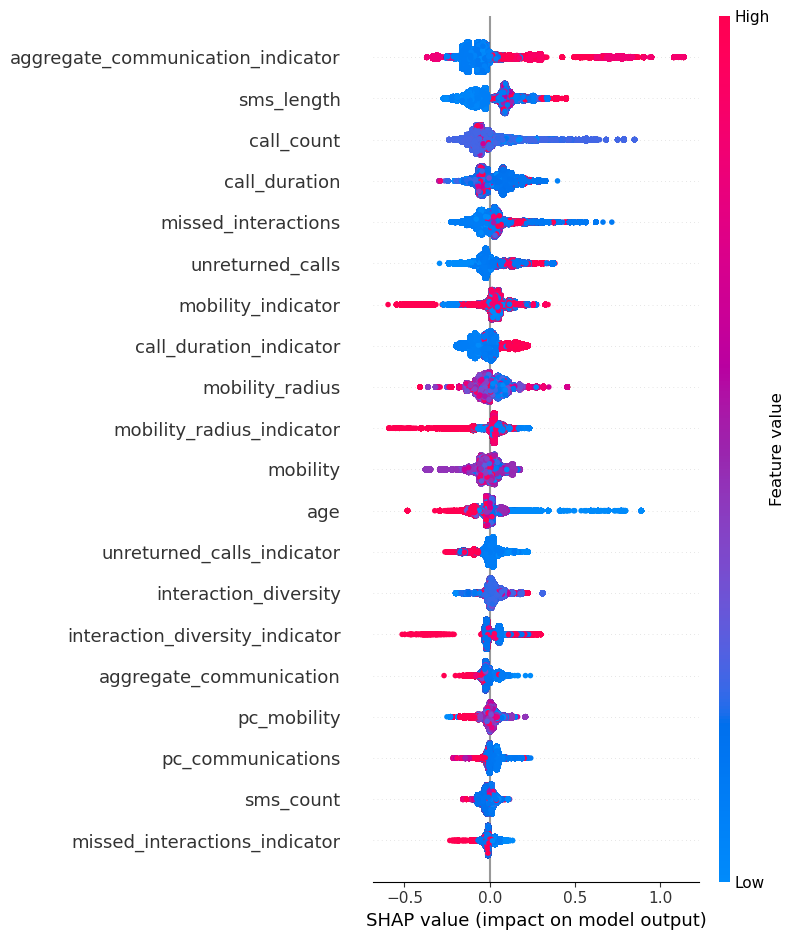

v1_day, XGBoost
cv score: -0.05974965103637908, mae 0.8111068613733746
cv score: -0.28224368213309736, mae 0.8481521655078701
cv score: -0.14242652197178907, mae 0.8864704106563402
R² on test for XGBoost: 0.275, PMC: 0.557, MAE: 0.568


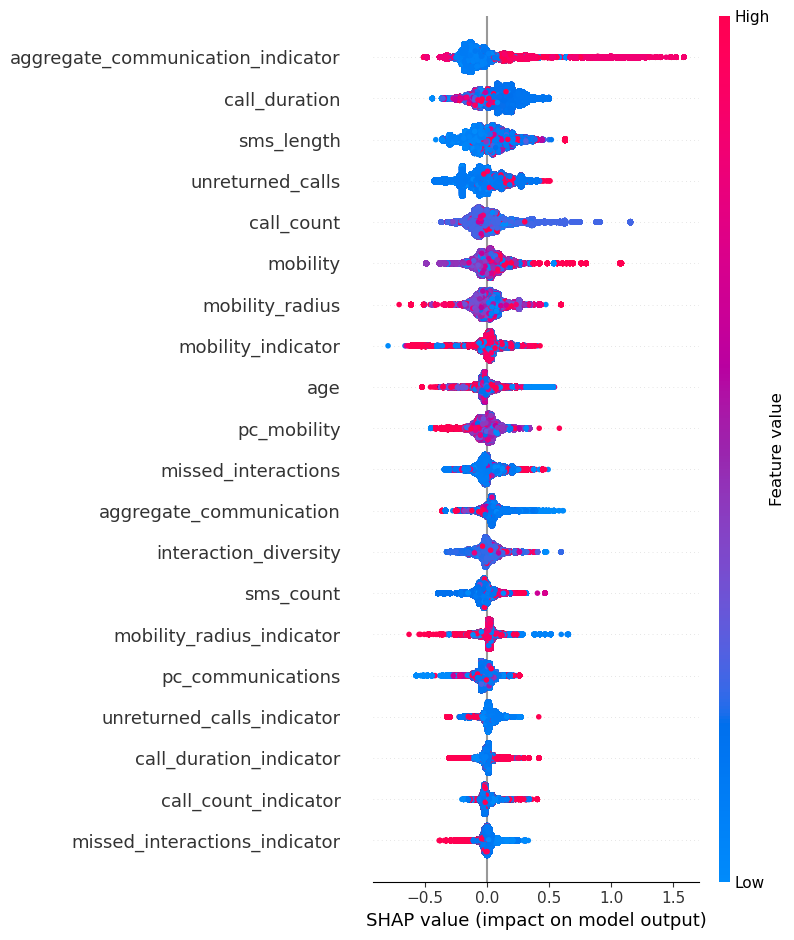

v1_day, AdaBoost
cv score: -0.1201411402200705, mae 0.9068957565800918
cv score: -0.4159604054721493, mae 0.9736226360323679
cv score: -0.1380652912296274, mae 0.9450355115648018
R² on test for AdaBoost: 0.074, PMC: 0.303, MAE: 0.741
v1_day, Gradient Boost
cv score: -0.05332647216188002, mae 0.8094101878596424
cv score: -0.3131946268596857, mae 0.9205638998284259
cv score: -0.09307213901925171, mae 0.8480586588007822
R² on test for Gradient Boost: 0.142, PMC: 0.383, MAE: 0.674


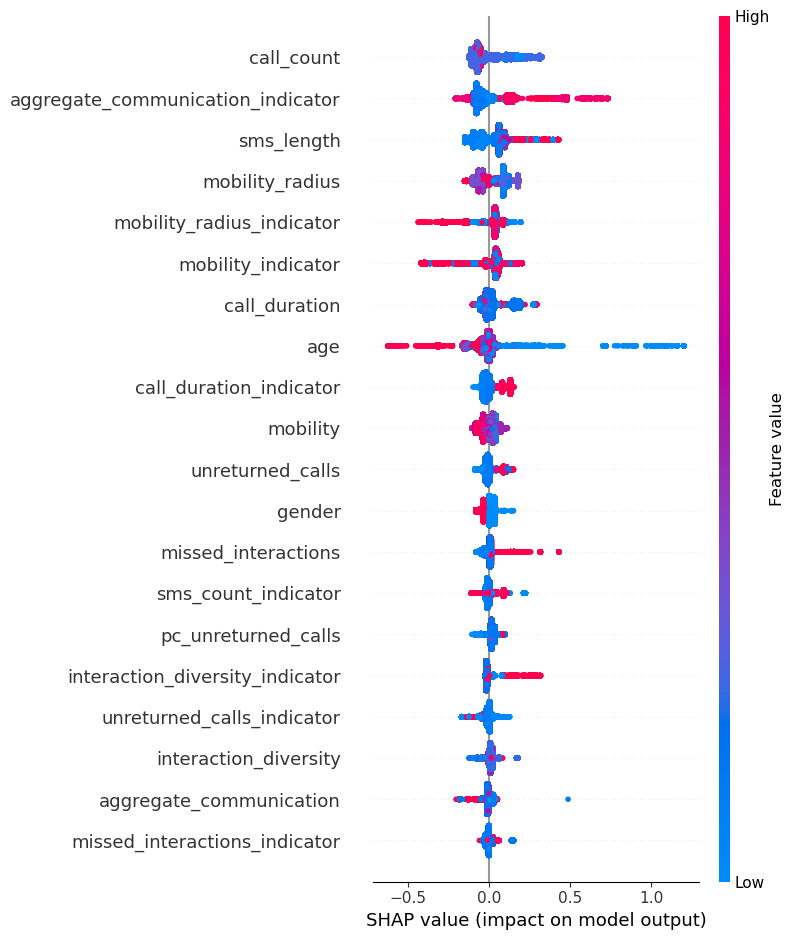

v1_day, Bagging
cv score: -0.0698554772410136, mae 0.7492800493153002
cv score: -0.06335589658101637, mae 0.7337290078108807
cv score: -0.2342957367034455, mae 0.8862665093128218
R² on test for Bagging: 0.283, PMC: 0.598, MAE: 0.500
v1_day, CatBoost
cv score: -0.07954247324899977, mae 0.8125093236104147
cv score: -0.2845706072522194, mae 0.8660169914311825
cv score: -0.06735770022357057, mae 0.8470635842313885
R² on test for CatBoost: 0.358, PMC: 0.604, MAE: 0.544


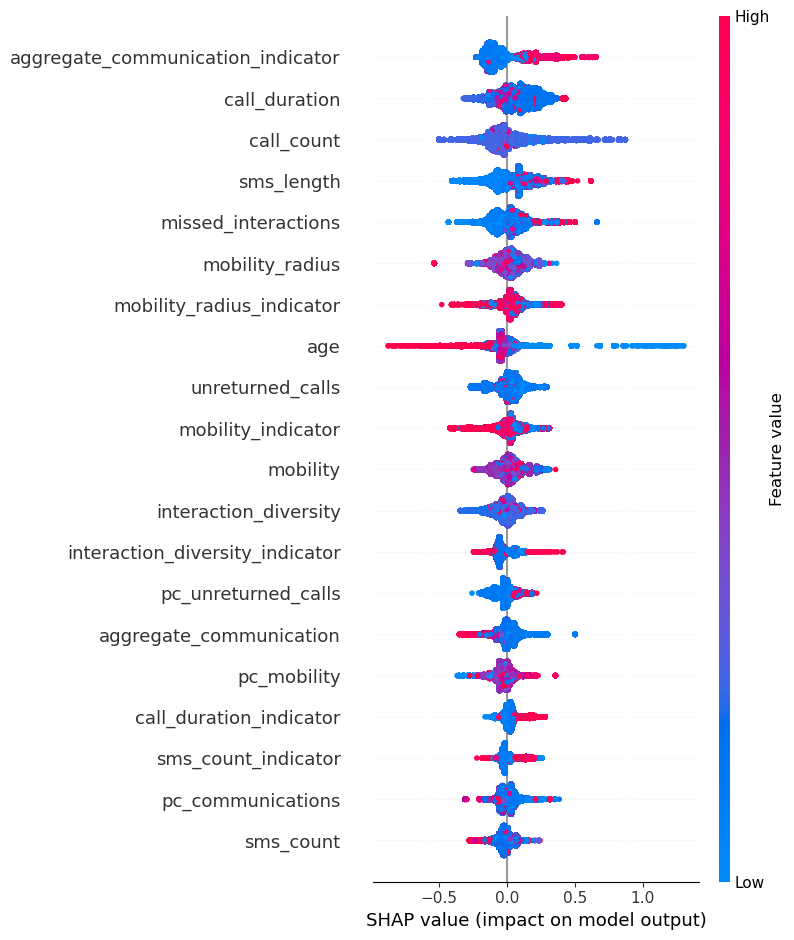

v2_day, Decision Tree
cv score: -2.7562543117583735, mae 1.0228568163889085
cv score: -0.37526265837771033, mae 0.7941640150820389
cv score: -0.7203047379586365, mae 0.7048321034076347
R² on test for Decision Tree: -0.689, PMC: 0.237, MAE: 0.777


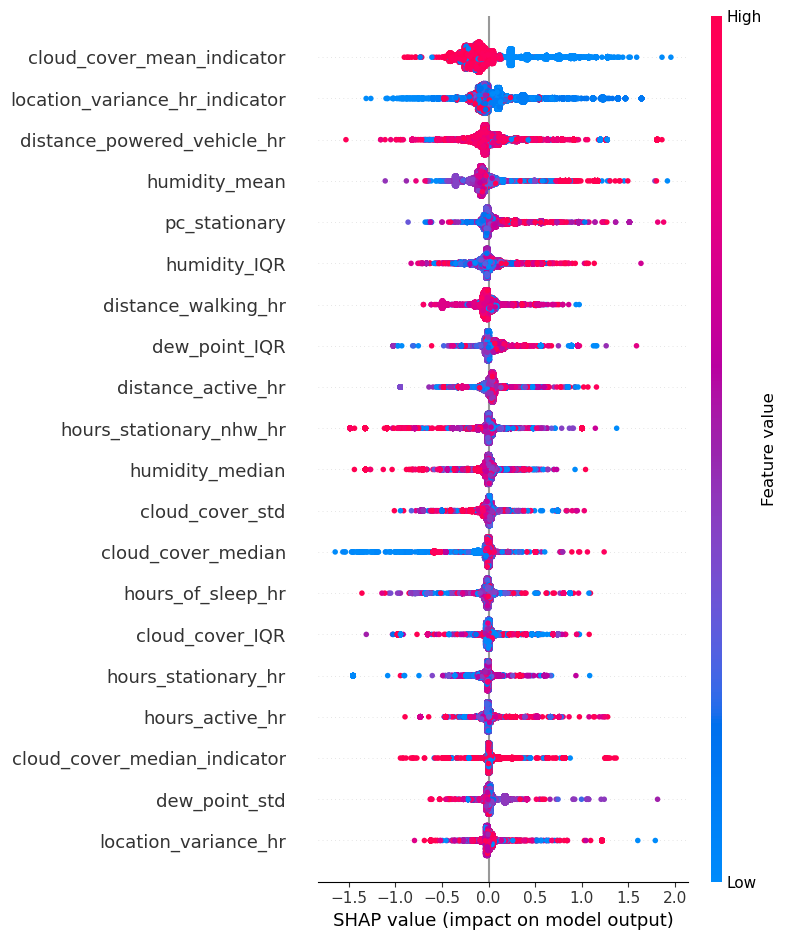

v2_day, Hist Gradient Tree
cv score: 0.006950028174759204, mae 0.6179658440082615
cv score: 0.2595442835941615, mae 0.8802166031402702
cv score: -0.00828053904434789, mae 0.5862904501853445
R² on test for Hist Gradient Tree: 0.077, PMC: 0.357, MAE: 0.637


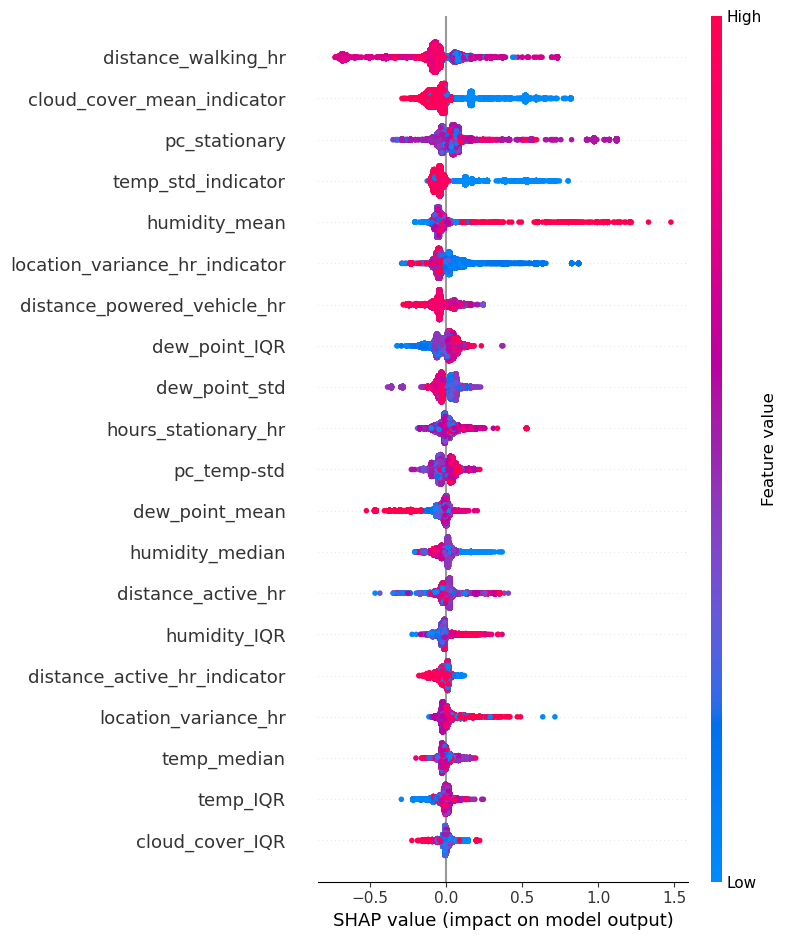

v2_day, XGBoost
cv score: -0.08584621395229908, mae 0.6366439525610447
cv score: 0.408554878841926, mae 0.7004860454728924
cv score: -0.07219537676201515, mae 0.6597404792494492
R² on test for XGBoost: 0.100, PMC: 0.397, MAE: 0.604


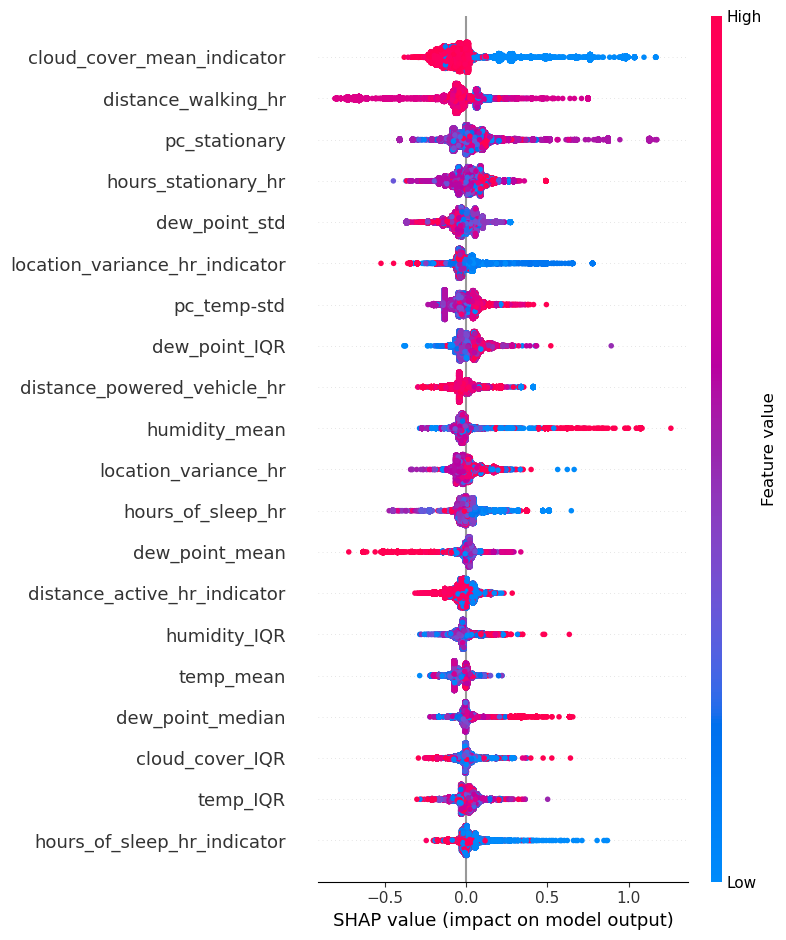

v2_day, AdaBoost
cv score: -0.3890181459148696, mae 0.9921150552924753
cv score: -0.03847275932913852, mae 1.2212003425692723
cv score: -0.5964318784199876, mae 1.0707550228770992
R² on test for AdaBoost: -0.404, PMC: 0.240, MAE: 1.013
v2_day, Gradient Boost
cv score: 0.14475117190496734, mae 0.5481735759587788
cv score: 0.03709976475920418, mae 1.038723692645177
cv score: 0.02111046460418997, mae 0.6442745959644164
R² on test for Gradient Boost: 0.029, PMC: 0.278, MAE: 0.665


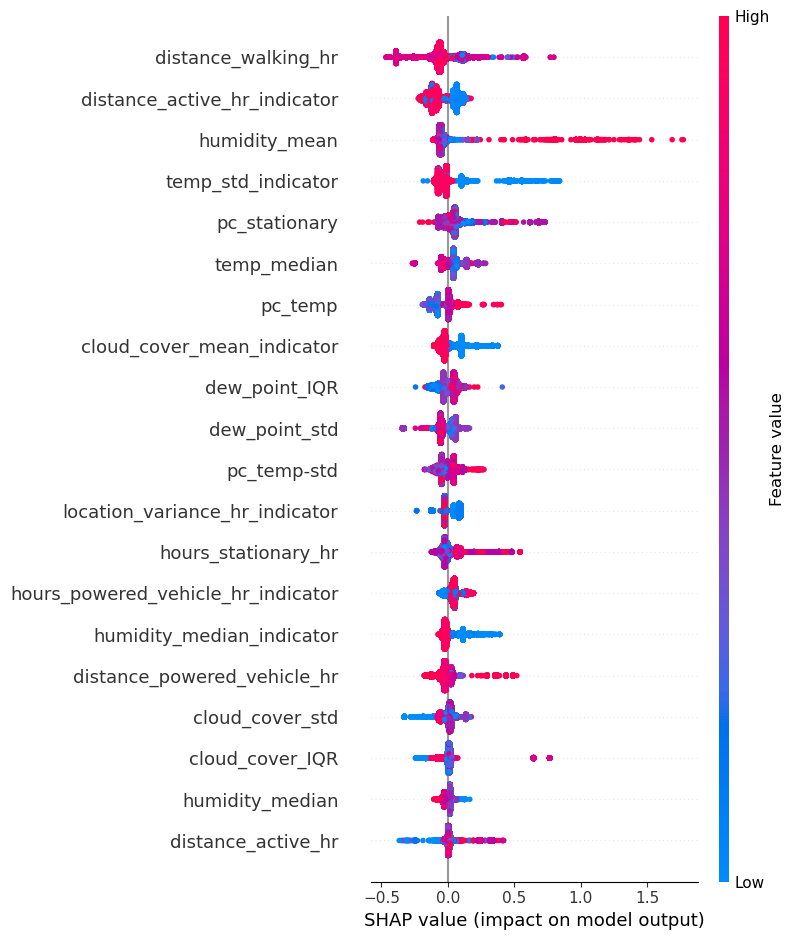

v2_day, Bagging
cv score: -0.2593233766697782, mae 0.6933256842311084
cv score: 0.2430947341393842, mae 0.7486853479854
cv score: -0.20526266434900697, mae 0.6331641001935481
R² on test for Bagging: -0.004, PMC: 0.362, MAE: 0.660
v2_day, CatBoost
cv score: 0.04070084997036927, mae 0.6496652896335585
cv score: 0.33352796459559764, mae 0.7744530407185093
cv score: 0.02223437622060198, mae 0.6213315518497418
R² on test for CatBoost: 0.152, PMC: 0.409, MAE: 0.614


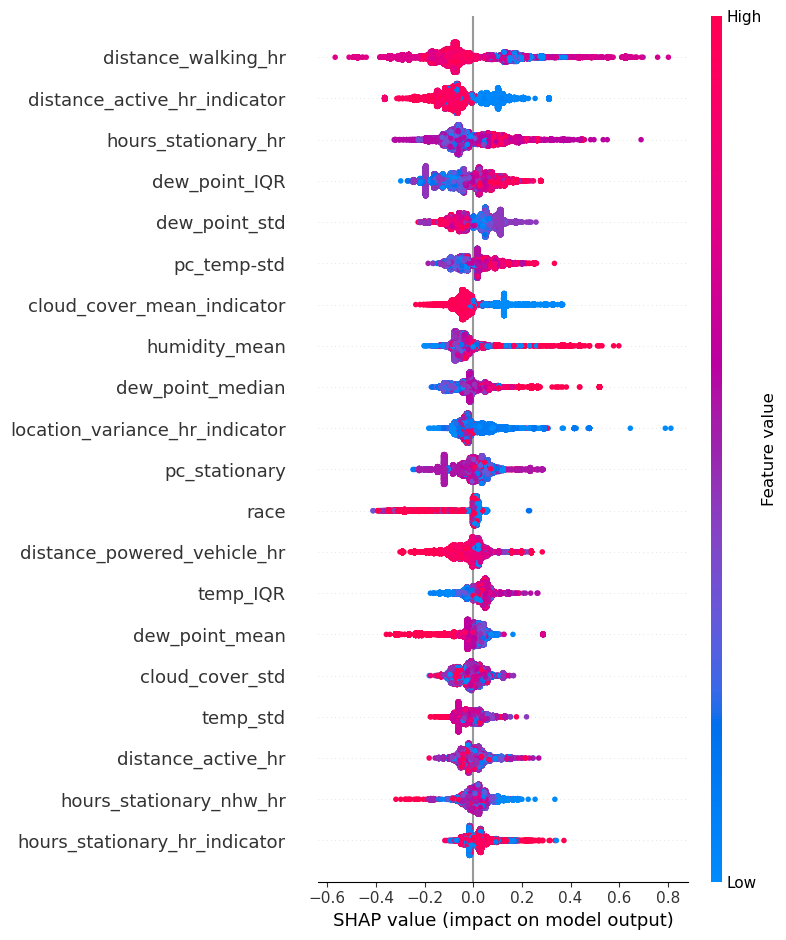

v1_week, Decision Tree
cv score: -0.8278902511805581, mae 1.689321097299396
cv score: -0.27484817567557007, mae 1.3603560595769508
cv score: -1.8291120772543858, mae 1.5638648360798804
R² on test for Decision Tree: -0.421, PMC: 0.488, MAE: 0.677


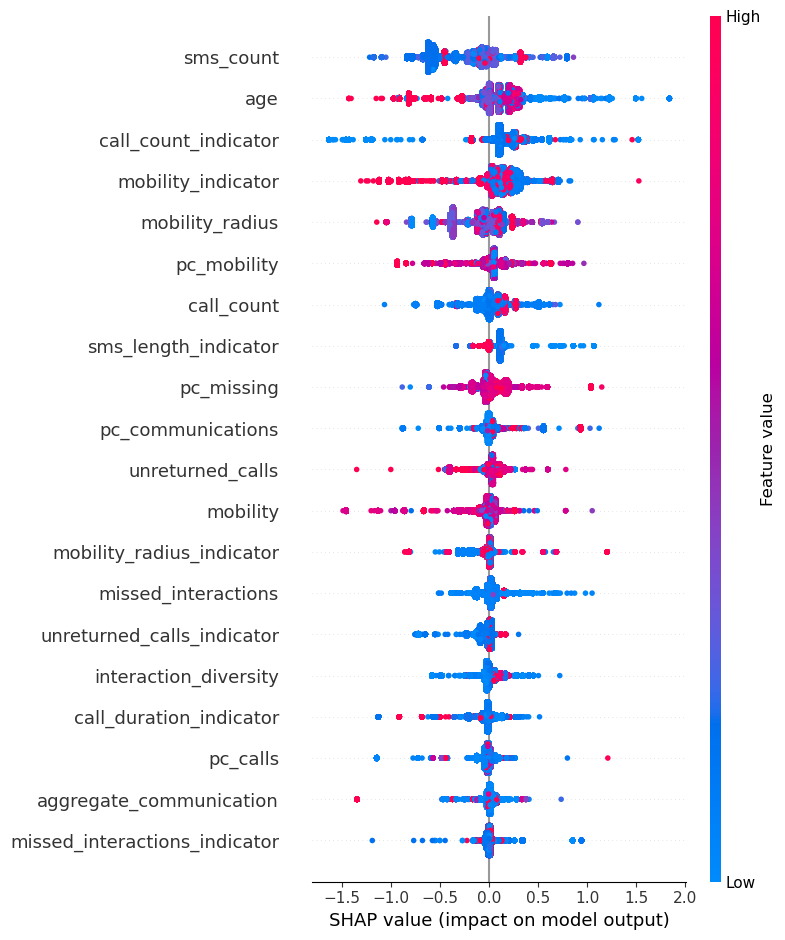

v1_week, Hist Gradient Tree
cv score: -0.23241578432961485, mae 1.4875439402223245
cv score: -0.36931224724196476, mae 1.3334967755085152
cv score: -0.7093335601775905, mae 1.284378962385364
R² on test for Hist Gradient Tree: 0.397, PMC: 0.704, MAE: 0.493


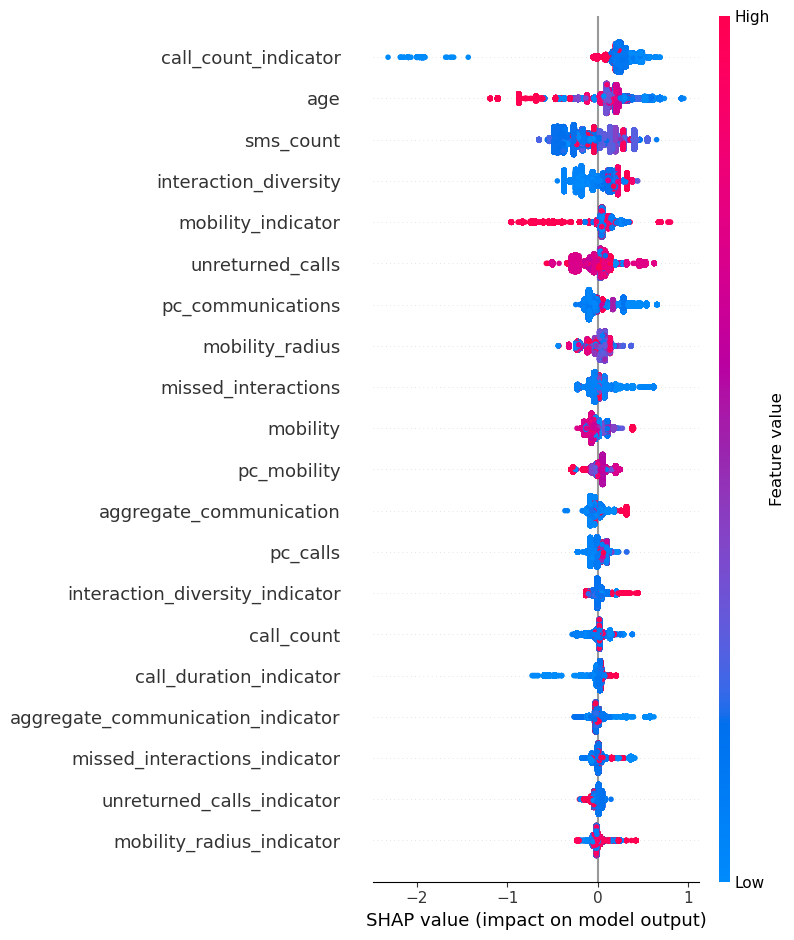

v1_week, XGBoost
cv score: -0.1765813852030873, mae 1.5170621243478983
cv score: -0.3509814731957417, mae 1.425150381014387
cv score: -0.5080337076777539, mae 1.2098019717855133
R² on test for XGBoost: 0.302, PMC: 0.719, MAE: 0.551


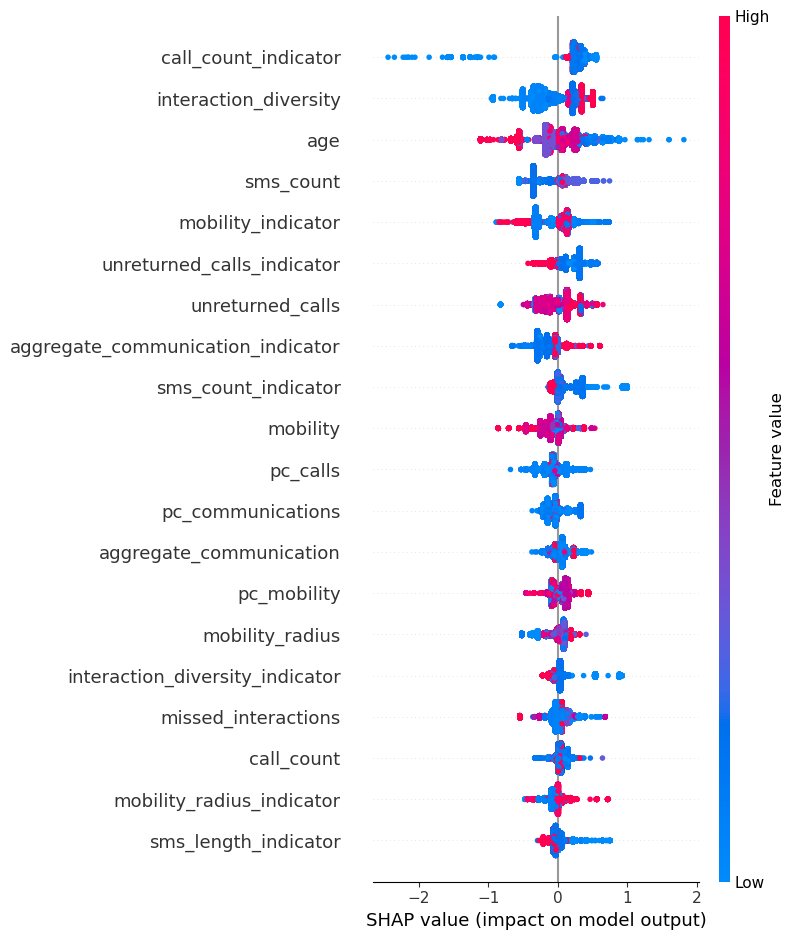

v1_week, AdaBoost
cv score: -0.2188955061665636, mae 1.4830062687461674
cv score: -0.1400400863278355, mae 1.2301386588235197
cv score: -0.8974992540915339, mae 1.373726406260167
R² on test for AdaBoost: 0.113, PMC: 0.381, MAE: 0.743
v1_week, Gradient Boost
cv score: -0.861766642891197, mae 1.8144773255285802
cv score: -0.270794754823217, mae 1.280435474735622
cv score: -0.6262610194433504, mae 1.2200739266259262
R² on test for Gradient Boost: 0.378, PMC: 0.624, MAE: 0.563


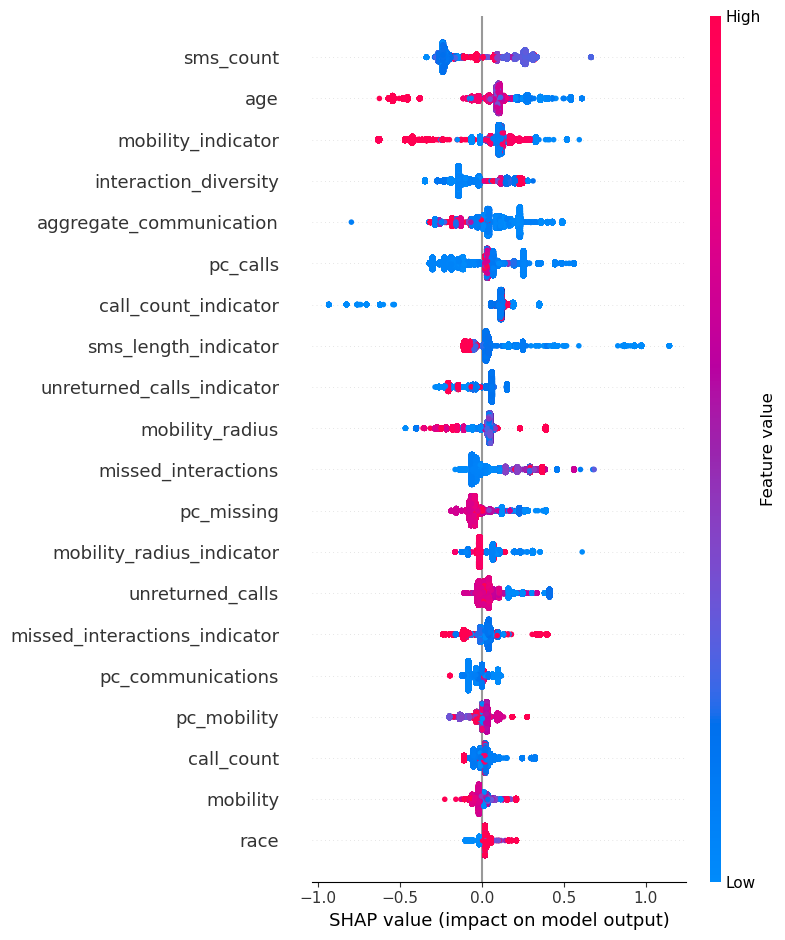

v1_week, Bagging
cv score: -0.36688895870438865, mae 1.6242523935442583
cv score: -0.15837531332900046, mae 1.3153380157466097
cv score: -0.3771206254712818, mae 1.1141641201359342
R² on test for Bagging: 0.179, PMC: 0.568, MAE: 0.494
v1_week, CatBoost
cv score: -0.5911943013894918, mae 1.7960049510690297
cv score: -0.1073584932495748, mae 1.2070657992670815
cv score: -0.864854956292217, mae 1.2972113640919214
R² on test for CatBoost: 0.352, PMC: 0.703, MAE: 0.487


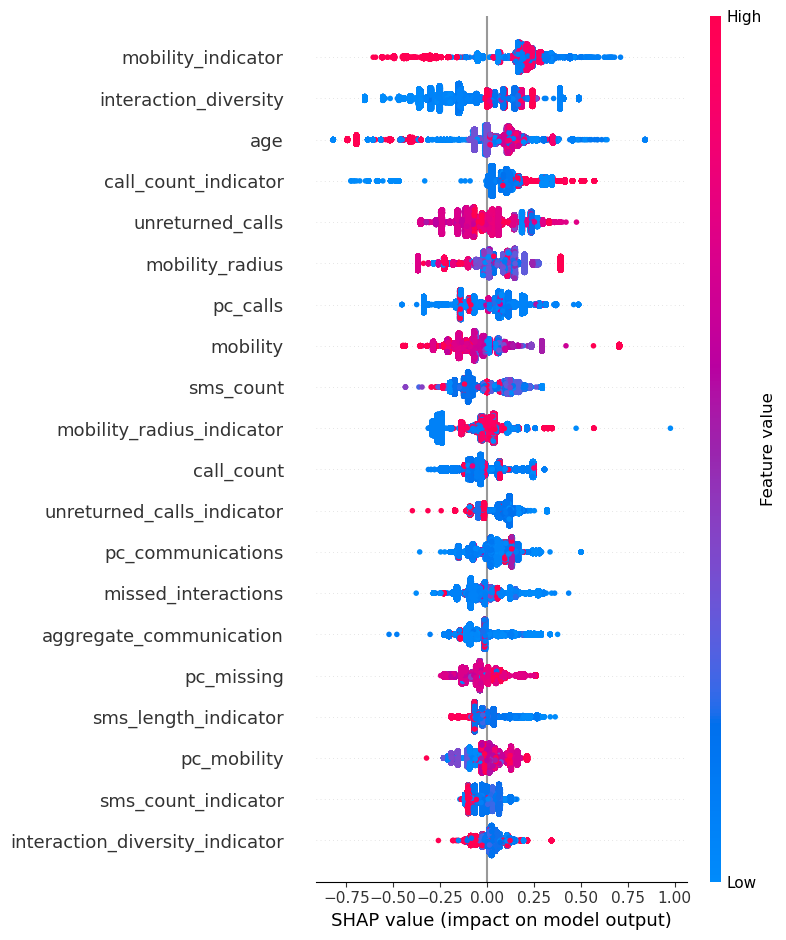

v2_week, Decision Tree
cv score: -3.3923745522715913, mae 2.9152232790037087
cv score: -0.24309902387243953, mae 1.5033189881778097
cv score: -1.7212996387229023, mae 1.8907091369091018
R² on test for Decision Tree: -1.804, PMC: -0.246, MAE: 1.628


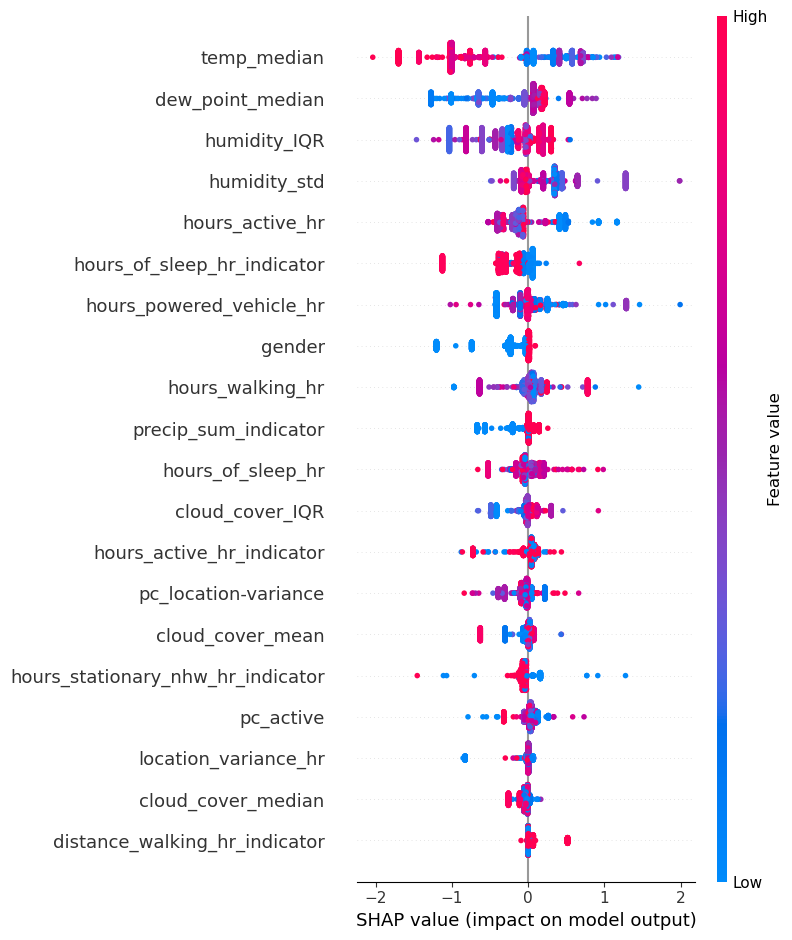

v2_week, Hist Gradient Tree
cv score: -0.03011021022079996, mae 1.3081355283920302
cv score: -0.15490051996962917, mae 1.5294751033050589
cv score: -1.0202741357911482, mae 1.6714460303523573
R² on test for Hist Gradient Tree: 0.605, PMC: 0.831, MAE: 0.696


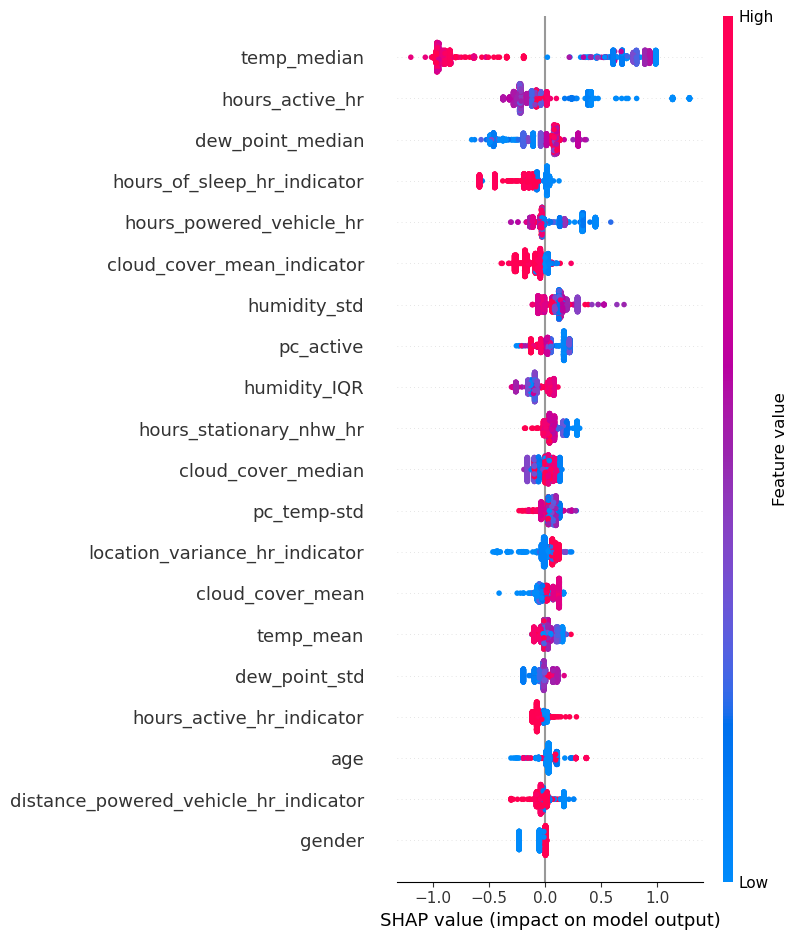

v2_week, XGBoost
cv score: -2.141516269439954, mae 2.249049838165468
cv score: -0.43210088782581146, mae 1.7103039450197677
cv score: -1.1370062580138054, mae 1.753566231434494
R² on test for XGBoost: 0.297, PMC: 0.553, MAE: 0.903


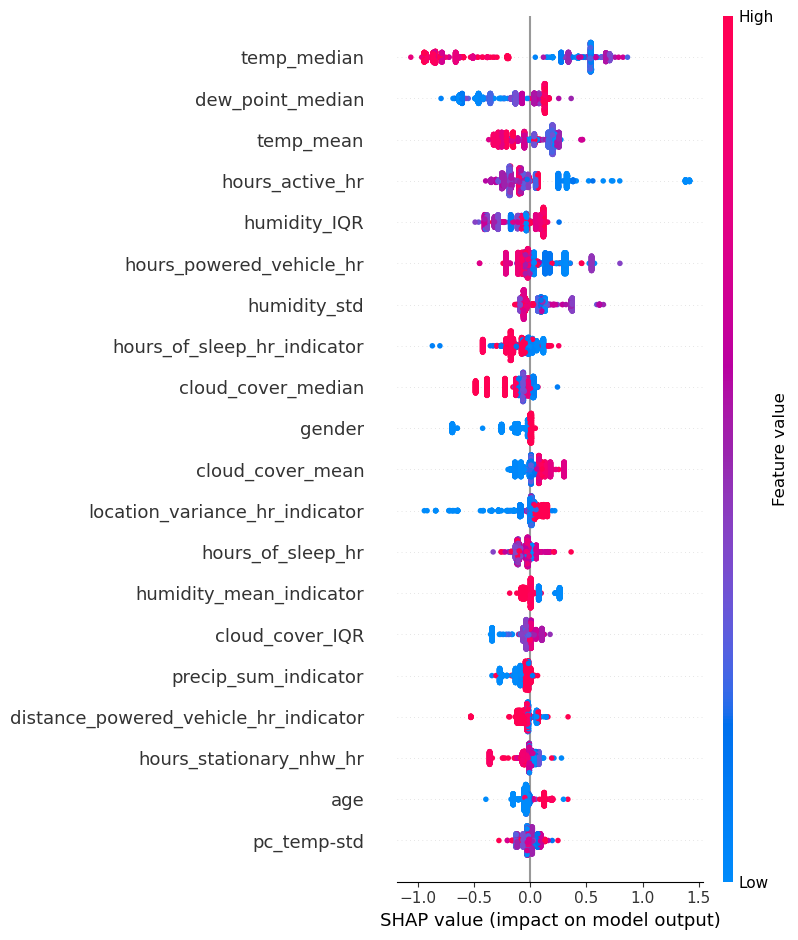

v2_week, AdaBoost
cv score: -0.10531202189378064, mae 1.6705674447091066
cv score: -0.6967542797891053, mae 1.8894206621502734
cv score: -0.22052716810840423, mae 1.3354864631766077
R² on test for AdaBoost: 0.178, PMC: 0.512, MAE: 1.037
v2_week, Gradient Boost
cv score: -0.9150784855805152, mae 2.097641519455369
cv score: -0.6199314946803478, mae 1.8294569955205942
cv score: -0.8197090291488447, mae 1.6550824705501677
R² on test for Gradient Boost: 0.171, PMC: 0.469, MAE: 0.953


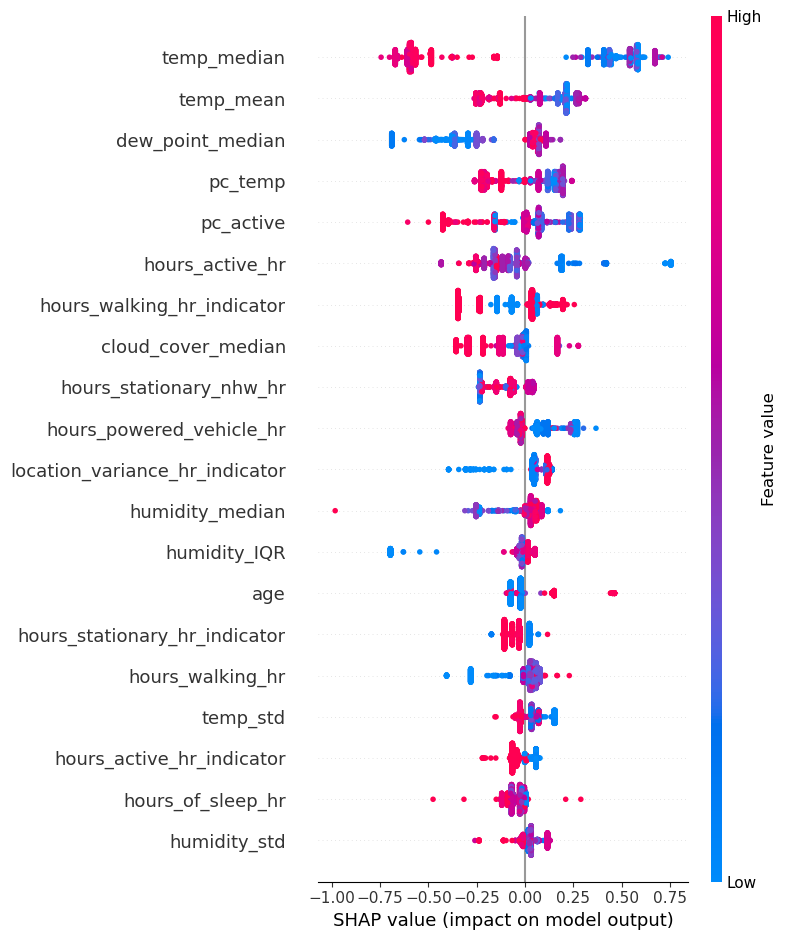

v2_week, Bagging
cv score: -0.44599860522677326, mae 1.7520376185930369
cv score: -0.10404598903150641, mae 1.5102573299331359
cv score: -0.7322390552425195, mae 1.6480630588499625
R² on test for Bagging: 0.419, PMC: 0.667, MAE: 0.719
v2_week, CatBoost
cv score: -1.217542500758245, mae 2.070065250626971
cv score: -0.25032259538397295, mae 1.6474682677016015
cv score: -1.0278310929089822, mae 1.747981193899902
R² on test for CatBoost: 0.487, PMC: 0.706, MAE: 0.750


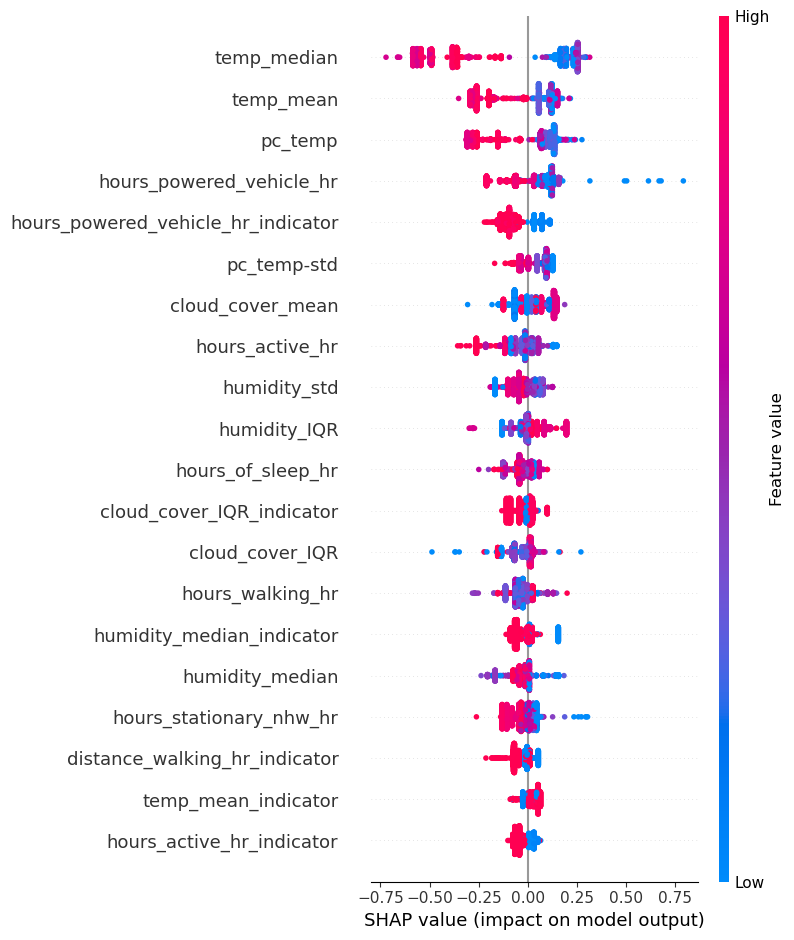

<Figure size 640x480 with 0 Axes>

In [11]:
## PCA 
from sklearn.model_selection import GroupKFold, cross_val_score
id_columns.append('idx')
pca_cv_results = {}
pca_test_results = {}

for name in df_names:
    pca_cv_results[name] = {}
    pca_test_results[name] = {}

    X_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_X_train.csv'))
    y_train= pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_y_train.csv'))

    # Create KFold object which groups based on num ID
    gkf = GroupKFold(n_splits=5)
    groups = X_train['num_id']    # Set num_id for the groups
    # Now drop all other id columns 
    X_train_cleaned = X_train.drop(columns=[col for col in X_train.columns if col in id_columns or 'Unnamed' in col])
    y_train_cleaned = y_train.drop(columns=[col for col in y_train.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
    # Evaluate each classifier using cross-validation

    gkf = GroupKFold(n_splits=5)

    for reg_name, reg in regs:
        if 'Random Forest' not in reg_name:
            print(f'{name}, {reg_name}')
            pca_cv_results[name][reg_name] = {}
            pca_test_results[name][reg_name] = {}

            pca_cv_results[name][reg_name]['r2'] = []
            pca_cv_results[name][reg_name]['mae'] = []
            pca_cv_results[name][reg_name]['pmc'] = []

            pca_test_results[name][reg_name]['r2'] = []
            pca_test_results[name][reg_name]['mae'] = []
            pca_test_results[name][reg_name]['pmc'] = []

            # 5 fold cross validation
            gkf = GroupKFold(n_splits=3)
            # going through each CV split
            for train_idx, val_idx in gkf.split(X_train_cleaned, y_train_cleaned, groups=groups):
                X_tr, X_cv_val = X_train_cleaned.iloc[train_idx], X_train_cleaned.iloc[val_idx]
                y_tr, y_cv_val = y_train_cleaned.iloc[train_idx], y_train_cleaned.iloc[val_idx]
                try: 
                    reg.fit(X_tr, y_tr)  # Now this reg is the trained model for this fold
                    # Predict on CV
                    y_cv_val_pred = reg.predict(X_cv_val)
                    # Evaluate r2 CV score
                    cv_score = r2_score(y_cv_val, y_cv_val_pred)
                    cv_mae = mean_absolute_error(y_cv_val, y_cv_val_pred)
                    cv_pmc = pearsonr(y_cv_val, y_cv_val_pred)
                    print(f'cv score: {cv_score}, mae {cv_mae}')
                    pca_cv_results[name][reg_name]['r2'].append(cv_score)
                    pca_cv_results[name][reg_name]['mae'].append(cv_mae)
                    pca_cv_results[name][reg_name]['pmc'].append(cv_pmc[0])
                except Exception as e: 
                    print(f"ERROR: {e}")
            
            # For that reg, predict test
            X_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_X_val.csv'))
            X_val_cleaned = X_val.drop(columns=[col for col in X_val.columns if col in id_columns or 'Unnamed' in col])
            y_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_y_val.csv'))
            y_val_cleaned = y_val.drop(columns=[col for col in y_val.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
            # Fit that reg
            reg.fit(X_train_cleaned, y_train_cleaned)
            y_val_pred = reg.predict(X_val_cleaned)
            # Evaluate r2 test score
            test_score = r2_score(y_val_cleaned, y_val_pred)
            test_mae = mean_absolute_error(y_val_cleaned, y_val_pred)
            test_pmc = pearsonr(y_val_cleaned, y_val_pred)
            print(f'R² on test for {reg_name}: {test_score:.3f}, PMC: {test_pmc[0]:.3f}, MAE: {test_mae:.3f}')
            pca_test_results[name][reg_name]['r2'].append(test_score)
            pca_test_results[name][reg_name]['mae'].append(test_mae)
            pca_test_results[name][reg_name]['pmc'].append(test_pmc[0])
            if 'Ada' not in reg_name and "agging" not in reg_name:
                explainer = shap.Explainer(reg)
                shap_values = explainer.shap_values(X_val_cleaned)
                shap.summary_plot(shap_values, X_val_cleaned, show=False)
                plt.savefig(os.path.join(shap_dir, f"shap_{name}_{reg_name}_pca.png"), bbox_inches="tight", dpi=300)
                plt.show()
                plt.clf()   # (Optional) Clear the figure to avoid overlap with future plots

        


,v1_day,v2_day,v1_week,v2_week
Decision Tree,"{'r2': [-0.6553138059376882, -0.55268970916077...","{'r2': [-2.7562543117583735, -0.37526265837771...","{'r2': [-0.8278902511805581, -0.27484817567557...","{'r2': [-3.3923745522715913, -0.24309902387243..."
Hist Gradient Tree,"{'r2': [0.006541568048819224, -0.1339882341925...","{'r2': [0.006950028174759204, 0.25954428359416...","{'r2': [-0.23241578432961485, -0.3693122472419...","{'r2': [-0.03011021022079996, -0.1549005199696..."
XGBoost,"{'r2': [-0.05974965103637908, -0.2822436821330...","{'r2': [-0.08584621395229908, 0.40855487884192...","{'r2': [-0.1765813852030873, -0.35098147319574...","{'r2': [-2.141516269439954, -0.432100887825811..."
AdaBoost,"{'r2': [-0.1201411402200705, -0.41596040547214...","{'r2': [-0.3890181459148696, -0.03847275932913...","{'r2': [-0.2188955061665636, -0.14004008632783...","{'r2': [-0.10531202189378064, -0.6967542797891..."
Gradient Boost,"{'r2': [-0.05332647216188002, -0.3131946268596...","{'r2': [0.14475117190496734, 0.037099764759204...","{'r2': [-0.861766642891197, -0.270794754823217...","{'r2': [-0.9150784855805152, -0.61993149468034..."
Bagging,"{'r2': [-0.0698554772410136, -0.06335589658101...","{'r2': [-0.2593233766697782, 0.243094734139384...","{'r2': [-0.36688895870438865, -0.1583753133290...","{'r2': [-0.44599860522677326, -0.1040459890315..."
CatBoost,"{'r2': [-0.07954247324899977, -0.2845706072522...","{'r2': [0.04070084997036927, 0.333527964595597...","{'r2': [-0.5911943013894918, -0.10735849324957...","{'r2': [-1.217542500758245, -0.250322595383972..."


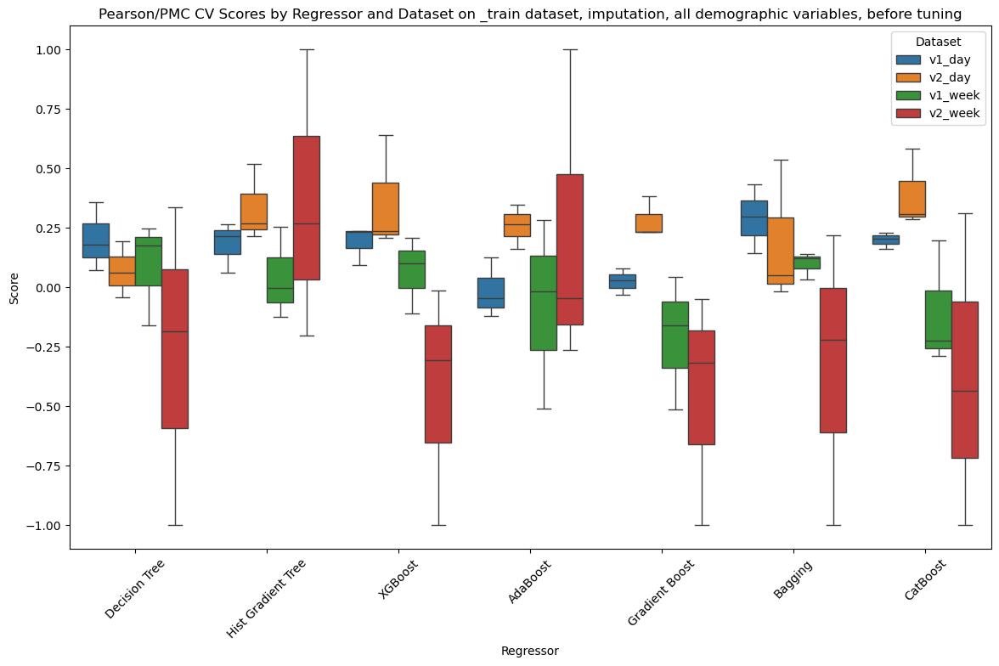

,v1_day,v2_day,v1_week,v2_week
Decision Tree,"{'r2': [-0.16336164030727196], 'mae': [0.60739...","{'r2': [-0.6893995507995587], 'mae': [0.777451...","{'r2': [-0.42086071745625975], 'mae': [0.67735...","{'r2': [-1.8039858853038018], 'mae': [1.628210..."
Hist Gradient Tree,"{'r2': [0.20882776050363894], 'mae': [0.639641...","{'r2': [0.07691954048902994], 'mae': [0.637436...","{'r2': [0.39695244159526877], 'mae': [0.492503...","{'r2': [0.6048769995294717], 'mae': [0.6955131..."
XGBoost,"{'r2': [0.2746922874893639], 'mae': [0.5682524...","{'r2': [0.09985530367763185], 'mae': [0.604417...","{'r2': [0.3022750615542884], 'mae': [0.5506492...","{'r2': [0.2966980781318409], 'mae': [0.9033810..."
AdaBoost,"{'r2': [0.07428324173151613], 'mae': [0.740787...","{'r2': [-0.40387264516148], 'mae': [1.01269230...","{'r2': [0.11292891251017634], 'mae': [0.743442...","{'r2': [0.1782992390379412], 'mae': [1.0369642..."
Gradient Boost,"{'r2': [0.14236286773369167], 'mae': [0.673850...","{'r2': [0.029032047036265607], 'mae': [0.66499...","{'r2': [0.3776586170867665], 'mae': [0.5631973...","{'r2': [0.17124977364117588], 'mae': [0.952554..."
Bagging,"{'r2': [0.28268046040965744], 'mae': [0.499846...","{'r2': [-0.003664134589675294], 'mae': [0.6596...","{'r2': [0.1789627236601613], 'mae': [0.4939869...","{'r2': [0.4190224448446698], 'mae': [0.7191663..."
CatBoost,"{'r2': [0.358334435761399], 'mae': [0.54399252...","{'r2': [0.15229242745992555], 'mae': [0.613592...","{'r2': [0.35205348128841585], 'mae': [0.486654...","{'r2': [0.48741321000302207], 'mae': [0.750467..."


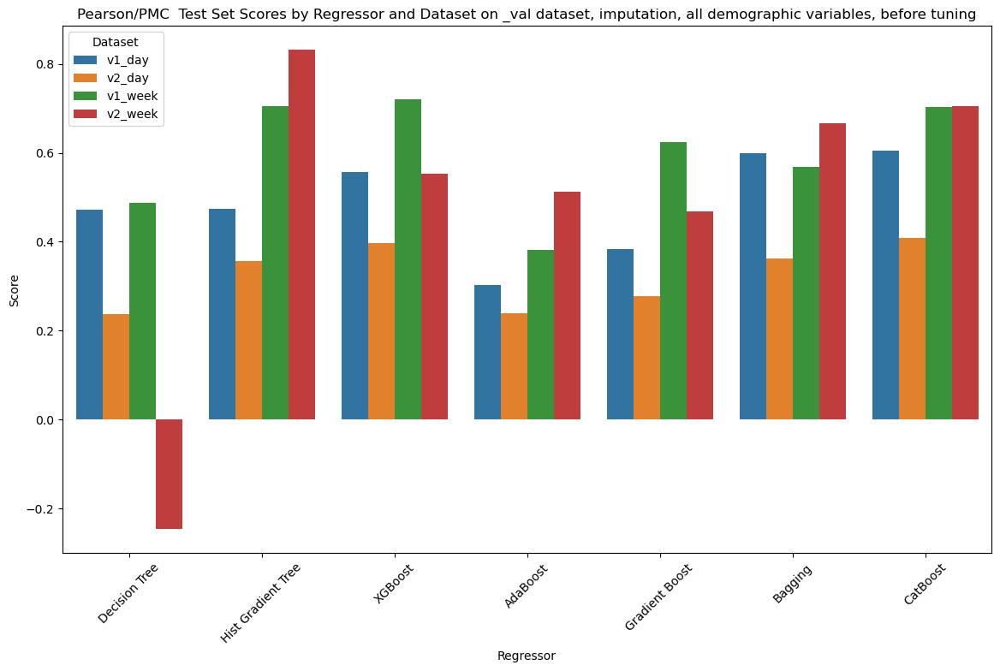

In [12]:

## CV Score Plotting

pca_cv_results_df = pd.DataFrame(pca_cv_results)
pca_cv_results_df.to_csv(os.path.join(brighten_dir, 'pca_cv_results_df.csv'))
display(pca_cv_results_df)


# Extract test data to flattened df for plotting
pca_flat_cv_results = []

# iterate over each dataset name
for dataset_name, reg_results in pca_cv_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                for cv_score in metrics[metric]:
                    pca_flat_cv_results.append({
                        'Dataset': dataset_name,
                        'Regressor': reg_name,
                        'Metric': metric,
                        'Score': cv_score,
                    })
                    
pca_flat_cv_results_df = pd.DataFrame(pca_flat_cv_results)

plt.figure(figsize=(14, 8))
sns.boxplot(x='Regressor', y='Score', hue='Dataset', data=pca_flat_cv_results_df[pca_flat_cv_results_df['Metric']=='pmc'])
plt.xticks(rotation=45)
plt.title('Pearson/PMC CV Scores by Regressor and Dataset on _train dataset, imputation, all demographic variables, before tuning')
plt.savefig(os.path.join(cv_dir, 'Pearson PMC CV Scores by Regressor and Dataset on _train dataset, imputation, all demographic variables, before tuning.png'))
plt.show()




## TEST Results Plotting
pca_test_results_df = pd.DataFrame(pca_test_results)
pca_test_results_df.to_csv(os.path.join(brighten_dir, 'pca_test_results_df.csv'))
display(pca_test_results_df)


# Extract test data to flattened df for plotting
pca_flat_test_results = []

# iterate over each dataset name
for dataset_name, reg_results in pca_test_results.items():
    # iterate over the scores within it
    for reg_name, metrics in reg_results.items():
            for metric in metrics.keys():
                pca_flat_test_results.append({
                    'Dataset': dataset_name,
                    'Regressor': reg_name,
                    'Metric': metric,
                    'Score': metrics[metric][0],
                })
pca_flat_test_results_df = pd.DataFrame(pca_flat_test_results)

plt.figure(figsize=(14, 8))
sns.barplot(x='Regressor', y='Score', hue='Dataset', data=pca_flat_test_results_df[pca_flat_test_results_df['Metric']=='pmc'])
plt.xticks(rotation=45)
plt.title('Pearson/PMC  Test Set Scores by Regressor and Dataset on _val dataset, imputation, all demographic variables, before tuning')
plt.savefig(os.path.join(val_dir, 'Pearson PMC Test Set Scores by Regressor and Dataset on _val dataset, imputation, all demographic variables, before tuning.png'))
plt.show()



## PCA as function


In [ ]:
import time
def run_pca_modeling(df_names, regs, brighten_dir, shap_dir, id_columns, n_splits=3):
    id_columns = id_columns + ['idx']
    pca_cv_results = {}
    pca_test_results = {}
    time.sleep(6000)

    for name in df_names:
        pca_cv_results[name] = {}
        pca_test_results[name] = {}

        # Load training data
        X_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_X_train.csv'))
        y_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_y_train.csv'))
        groups = X_train['num_id']

        # Clean columns
        X_train_cleaned = X_train.drop(columns=[col for col in X_train.columns if col in id_columns or 'Unnamed' in col])
        y_train_cleaned = y_train.drop(columns=[col for col in y_train.columns if 'Unnamed' in col]).squeeze()

        gkf = GroupKFold(n_splits=n_splits)

        for reg_name, reg in regs:
            if 'Decision' in reg_name:
                continue

            print(f'{name}, {reg_name}')
            pca_cv_results[name][reg_name] = {'r2': [], 'mae': [], 'pmc': []}
            pca_test_results[name][reg_name] = {'r2': [], 'mae': [], 'pmc': []}

            for train_idx, val_idx in gkf.split(X_train_cleaned, y_train_cleaned, groups=groups):
                X_tr, X_cv_val = X_train_cleaned.iloc[train_idx], X_train_cleaned.iloc[val_idx]
                y_tr, y_cv_val = y_train_cleaned.iloc[train_idx], y_train_cleaned.iloc[val_idx]

                try:
                    reg.fit(X_tr, y_tr)
                    y_cv_val_pred = reg.predict(X_cv_val)

                    cv_r2 = r2_score(y_cv_val, y_cv_val_pred)
                    cv_mae = mean_absolute_error(y_cv_val, y_cv_val_pred)
                    cv_pmc = pearsonr(y_cv_val, y_cv_val_pred)[0]

                    print(f'CV score: {cv_r2:.3f}, MAE: {cv_mae:.3f}')

                    pca_cv_results[name][reg_name]['r2'].append(cv_r2)
                    pca_cv_results[name][reg_name]['mae'].append(cv_mae)
                    pca_cv_results[name][reg_name]['pmc'].append(cv_pmc)
                except Exception as e:
                    print(f"ERROR: {e}")

            # Load and clean test data
            X_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_X_val.csv'))
            y_val = pd.read_csv(os.path.join(brighten_dir, f'{name}_pca_y_val.csv'))

            X_val_cleaned = X_val.drop(columns=[col for col in X_val.columns if col in id_columns or 'Unnamed' in col])
            y_val_cleaned = y_val.drop(columns=[col for col in y_val.columns if 'Unnamed' in col]).squeeze()

            reg.fit(X_train_cleaned, y_train_cleaned)
            y_val_pred = reg.predict(X_val_cleaned)

            test_r2 = r2_score(y_val_cleaned, y_val_pred)
            test_mae = mean_absolute_error(y_val_cleaned, y_val_pred)
            test_pmc = pearsonr(y_val_cleaned, y_val_pred)[0]

            print(f'Test R²: {test_r2:.3f}, PMC: {test_pmc:.3f}, MAE: {test_mae:.3f}')

            pca_test_results[name][reg_name]['r2'].append(test_r2)
            pca_test_results[name][reg_name]['mae'].append(test_mae)
            pca_test_results[name][reg_name]['pmc'].append(test_pmc)

            if 'Ada' not in reg_name and "agging" not in reg_name:
                try:
                    explainer = shap.Explainer(reg)
                    shap_values = explainer.shap_values(X_val_cleaned)
                    shap.summary_plot(shap_values, X_val_cleaned, show=False)
                    plt.savefig(os.path.join(shap_dir, f"shap_{name}_{reg_name}_pca.png"), bbox_inches="tight", dpi=300)
                    plt.show()
                    plt.clf()
                except Exception as e:
                    print(f"SHAP error: {e}")

    return pca_cv_results, pca_test_results


In [ ]:
from joblib import Parallel, delayed
from concurrent.futures import ThreadPoolExecutor, TimeoutError
import time

# Assume this is your function
def run_pca_modeling_wrapper():
    return run_pca_modeling(df_names, regs, brighten_dir, shap_dir, id_columns)

# Use ThreadPoolExecutor for timeout control
with ThreadPoolExecutor(max_workers=1) as executor:
    future = executor.submit(run_pca_modeling_wrapper)

    try:
        # Wait for at most 6000 seconds (100 minutes)
        result = future.result(timeout=6000)
        cv_results, test_results = result
    except TimeoutError:
        print("Timeout reached — job killed")
        cv_results, test_results = None, None
    except Exception as e:
        print(f"Unhandled exception: {e}")
        cv_results, test_results = None, None


## From this we can see Random Forest is the best performing algorithm.

Since we have much more data for V1 day than V2 day, and also have communication features in V1 day, it makes sense that it has a higher accuracy.

We'll focus on the day regressors, and on randomforest, as it does well for both V1 day and V2 day.

In [14]:
## Random Forest Random Search
results = {}
for name in df_names:
    print(f"--- Dataset: {name} ---")
    X_train_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_train.csv'))
    y_train_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_train.csv'))
    # test
    X_test_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_test.csv'))
    y_test_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_test.csv'))

    X_train = X_train_unclean.drop(columns=[col for col in X_train_unclean.columns if col in id_columns or 'Unnamed' in col])
    y_train = y_train_unclean.drop(columns=[col for col in y_train_unclean.columns if 'Unnamed' in col]).squeeze()
    X_test = X_test_unclean.drop(columns=[col for col in X_test_unclean.columns if col in id_columns or 'Unnamed' in col])
    y_test = y_test_unclean.drop(columns=[col for col in y_test_unclean.columns if 'Unnamed' in col]).squeeze()

    # Define parameter grid based on dataset
    param_grid = {
            'n_estimators': [100, 200, 500, 1000],
            'max_depth': [None, 5, 10, 20, 30, 50],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4, 10],
            'max_features': [None, "sqrt", "log2", 0.5, 0.75],
        }

    # Initialize the CatBoostClassifier
    model = RandomForestRegressor(random_state=42)

    # Perform grid search
    grid = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=100,
        scoring='r2',
        n_jobs=-1,
        random_state=42,
        error_score='raise'
    )

    # Log best results
    grid.fit(X_train, y_train)

    best_params = grid.best_params_

    final_model = RandomForestRegressor(**best_params, random_state=42)

    final_model.fit(X_train, y_train)
    score = final_model.score(X_test, y_test)

    results[name] = {
        "best_params": best_params,
        "best_score": score
        }
 
    print(results[name])

--- Dataset: v1_day ---


/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


{'best_params': {'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 0.75, 'max_depth': 20}, 'best_score': 0.056387154383319205}
--- Dataset: v2_day ---


/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


{'best_params': {'n_estimators': 1000, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': None}, 'best_score': 0.14606447330732053}
--- Dataset: v1_week ---
{'best_params': {'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 10, 'max_features': 'log2', 'max_depth': 5}, 'best_score': -0.19867174660385056}


In [15]:
results

{'v1_day': {'best_params': {'n_estimators': 500,
   'min_samples_split': 10,
   'min_samples_leaf': 4,
   'max_features': 0.75,
   'max_depth': 20},
  'best_score': 0.056387154383319205},
 'v2_day': {'best_params': {'n_estimators': 1000,
   'min_samples_split': 2,
   'min_samples_leaf': 2,
   'max_features': None,
   'max_depth': None},
  'best_score': 0.14606447330732053},
 'v1_week': {'best_params': {'n_estimators': 500,
   'min_samples_split': 2,
   'min_samples_leaf': 10,
   'max_features': 'log2',
   'max_depth': 5},
  'best_score': -0.19867174660385056}}

### Some NaN values
Not imputed

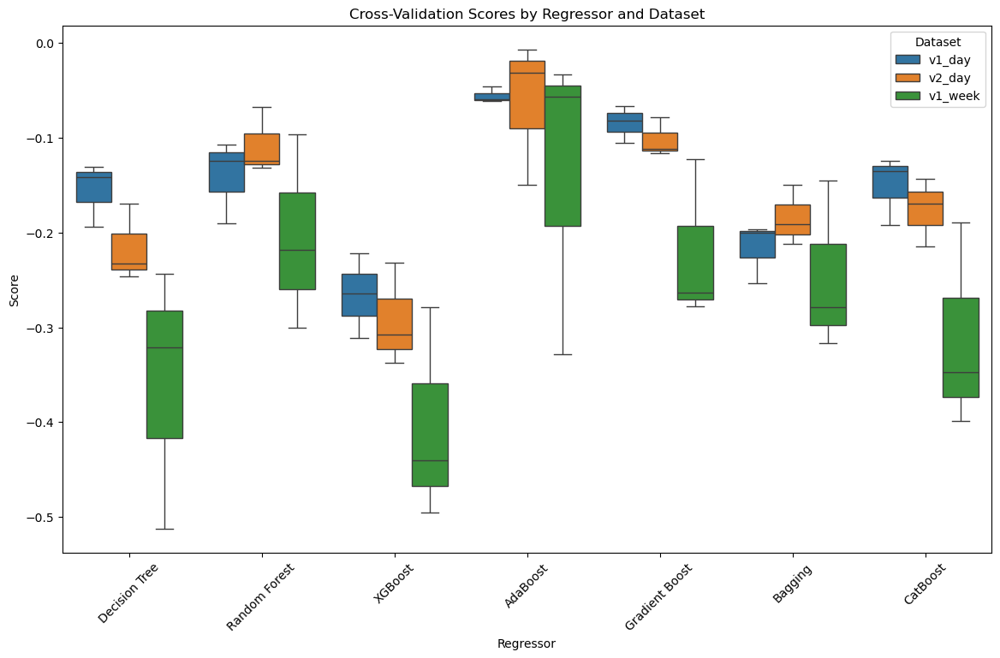

In [4]:
from sklearn.model_selection import GroupKFold, cross_val_score
id_columns.append('idx')
results = {}
for name in df_names:
    results[name] = {}
    X_train = pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_X_train.csv'))
    X_test = pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_X_test.csv'))
    y_train= pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_y_train.csv'))
    y_test= pd.read_csv(os.path.join(brighten_dir, f'{name}_wNA_y_test.csv'))

    # Create KFold object which groups based on num ID
    gkf = GroupKFold(n_splits=3)
    groups = X_train['num_id']    # Set num_id for the groups
    # Now drop all other id columns 
    X_train_cleaned = X_train.drop(columns=[col for col in X_train.columns if col in id_columns or 'Unnamed' in col])
    y_train_cleaned = y_train.drop(columns=[col for col in y_train.columns if 'Unnamed' in col]).squeeze() #squeeze into a list from a series
    # Evaluate each classifier using cross-validation
    for reg_name, reg in regs_someNA:
        cv_scores = cross_val_score(reg, X_train_cleaned, y_train_cleaned, groups=groups, cv=gkf, scoring='r2')
        results[name][reg_name] = cv_scores


# Extract data to flattened df for plotting
flat_results = []

for dataset_name, reg_results in results.items():
    for reg_name, scores in reg_results.items():
        for score in scores:
            flat_results.append({
                'Dataset': dataset_name,
                'Regressor': reg_name,
                'Score': score
            })


results_df = pd.DataFrame(flat_results)

plt.figure(figsize=(14, 8))
sns.boxplot(x='Regressor', y='Score', hue='Dataset', data=results_df)
plt.xticks(rotation=45)
plt.title('Cross-Validation Scores by Regressor and Dataset')
plt.show()


In [ ]:
## Catboost RandomSearch
#results = {}
#for name in df_names:
print(f"--- Dataset: {name} ---")
X_train_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_train.csv'))
y_train_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_train.csv'))
# test
X_test_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_test.csv'))
y_test_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_test.csv'))

X_train = X_train_unclean.drop(columns=[col for col in X_train_unclean.columns if col in id_columns or 'Unnamed' in col])
y_train = y_train_unclean.drop(columns=[col for col in y_train_unclean.columns if 'Unnamed' in col]).squeeze()
X_test = X_test_unclean.drop(columns=[col for col in X_test_unclean.columns if col in id_columns or 'Unnamed' in col])
y_test = y_test_unclean.drop(columns=[col for col in y_test_unclean.columns if 'Unnamed' in col]).squeeze()

# Define parameter grid based on dataset
if name == "v1_day":
    param_grid = {
            'n_estimators': [i for i in range(50, 200)],
            'learning_rate': [round(x, 2) for x in np.arange(0.05, 1.05, 100)],
            'subsample': [i for i in np.linspace(0.01, 0.99, 100)],
        }
elif name == "v2_day":
    param_grid = {
            'n_estimators': [i for i in range(50, 200)],
            'learning_rate': [round(x, 2) for x in np.arange(0.05, 1.05, 100)],
            'subsample': [i for i in np.linspace(0.01, 0.99, 100)],
        }

# Initialize the CatBoostClassifier
model = GradientBoostingClassifier(random_state=42, verbose=0)

# Perform grid search
grid = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    n_iter=100,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42,
    error_score='raise'
)

# Log best results
grid.fit(X_train, y_train)

best_params = grid.best_params_

final_model = GradientBoostingClassifier(**best_params, random_state=42)

final_model.fit(X_train, y_train)
score = final_model.score(X_test, y_test)

results[name] = {
    "best_params": best_params,
    "best_score": score
    }

print(results[name])

The best parameters for each model are saved into {name}_catboost_gridsearch_results.json. From this we've gotten the 'best parameters' found, as well as an accuracy score. We can use these accuracy scores to compare to the increases in accuracy from optimizing hyperparameters.

## more specified hyperparameter optimization
From those parameter dicts we can make the parameter space smaller and more specifically find the optimal parameters for each aspect of the model. We'll use a random search still to decrease the compute time, but increase the iterations and decrease the ranges for each parameter.

We can then use the optimized hyperparameters and evaluate the accuracy score of the final model.

We'll use RMSE because we're interested in generally predicting the area of the depression score each subject is in.

In [ ]:
optimized_results = {}
for name in df_names:
    print(f"--- Dataset: {name} ---")
    X_train_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_train.csv'))
    y_train_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_train.csv'))
    # test
    X_test_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_test.csv'))
    y_test_unclean = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_test.csv'))

    X_train = X_train_unclean.drop(columns=[col for col in X_train_unclean.columns if col in id_columns or 'Unnamed' in col])
    y_train = y_train_unclean.drop(columns=[col for col in y_train_unclean.columns if 'Unnamed' in col]).squeeze()
    X_test = X_test_unclean.drop(columns=[col for col in X_test_unclean.columns if col in id_columns or 'Unnamed' in col])
    y_test = y_test_unclean.drop(columns=[col for col in y_test_unclean.columns if 'Unnamed' in col]).squeeze()

    # Define parameter grid based on dataset
    if name == "v1_day":
        param_grid = {
            'n_estimators': [i for i in range(120, 150)],
            'max_depth': [i for i in range(8, 20)],
            'min_samples_split': [i for i in range(50, 100)],
            'min_samples_leaf': [i for i in range(xx)],
            'max_features': [i for i in range(4, 12)],
            }
    elif name == "v2_day":
        param_grid = {
            'n_estimators': [i for i in range(50, 200)],
            'max_depth': [i for i in range(2, 15)],
            'min_samples_split': [i for i in range(50, 500)],
            'min_samples_leaf': [i for i in range(50, 500)],
            'max_features': [i for i in range(4, 12)],
        }
    elif name == "v1_week":
        param_grid = {
            'n_estimators': [i for i in range(120, 150)],
            'max_depth': [i for i in range(8, 20)],
            'min_samples_split': [i for i in range(50, 100)],
            'min_samples_leaf': [i for i in range(xx)],
            'max_features': [i for i in range(4, 12)],
        }
    
    # Initialize the CatBoostClassifier
    model = GradientBoostingClassifier(random_state=42, verbose=0)

    # Perform grid search
    grid = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=500,
        scoring='accuracy',
        n_jobs=-1,
        random_state=42
    )

    # Log best results
    grid.fit(X_train, y_train)

    best_params = grid.best_params_
    optimized_results[name] = {"best_params": best_params}

    final_model = GradientBoostingClassifier(**best_params, random_state=42)

    final_model.fit(X_train, y_train)
    score = final_model.score(X_test, y_test)

    optimized_results[name] = {
        "best_params": best_params,
        "best_score": score
        }

    print(optimized_results[name])



--- Dataset: v1_day ---
{'best_params': {'subsample': 0.651503006012024, 'n_estimators': 52, 'learning_rate': 0.0001}, 'best_score': 0.673939393939394}
--- Dataset: v2_day ---
{'best_params': {'subsample': 0.999, 'n_estimators': 152, 'learning_rate': 0.0001}, 'best_score': 0.522673031026253}
--- Dataset: v1_week ---
{'best_params': {'subsample': 0.676753507014028, 'n_estimators': 52, 'learning_rate': 0.0001}, 'best_score': 0.24285714285714285}


#### Increased random search results
Now we can see the best parameters for each dataset, as well as the accuracy over all crossfolds. 

v1_day_predictions.json:
{
    "accuracy": 0.674
}  

v2_day_predictions.json:
{
    "accuracy": 0.523
}  

v1_week_predictions.json:
{
    "accuracy": 0.243
}


### Evaluating results
We can now see the accuracy of each loosely-optimized hyperparameter model and increased-optimized hyperparameter model. We compare the accuracies in this below chart: 

In [106]:
results_df = pd.DataFrame(results).reset_index()
results_df['loose_model'] = 'loose_model'
opt_results_df = pd.DataFrame(optimized_results).reset_index()
opt_results_df['optimized_model'] = 'optimized_model'
total = pd.concat([results_df, opt_results_df], axis=0)
total = total[total['index']=='best_score']
total['model'] = total['loose_model'].astype(str).replace('nan','') + total['optimized_model'].astype(str).replace('nan','')
total = total.drop(columns=['optimized_model','loose_model'])
df_melted = total.melt( # Melt the DataFrame
    id_vars=['model'],
    value_vars=['v1_day', 'v2_day', 'v1_week'],
    var_name='variable',
    value_name='score'
)
fig = px.bar(
    df_melted,
    x='variable',    # x-axis: v1_day, v2_day, v1_week
    y='score',       # y-axis: score value
    color='model',   # bar color: loose_model vs optimized_model
    barmode='group', # grouped bars next to each other
    text='score',    # show value labels
    title='Model Comparison Across v1_day, v2_day, and v1_week',
    labels={'variable': 'Dataset', 'score': 'Accuracy Score'}
)

fig.show()


Tuning the hyperparameters further gave us an increase in accuracy for v1_week by about 5%. For v1_day it didn't change and for v1_week it deceased around 3%.

### Bayesian Hyperparameter Optimization
This took over 9 hours and still didn't converge, so let's try another method. 

First we'll try to optimize hyperparameters for KNN.

In [30]:
from sklearn.metrics import accuracy_score
name = 'v1_day'
X_train_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_train.csv'))
X_train_cleaned = X_train_df.drop(columns=[col for col in X_train_df.columns if col in id_columns or 'Unnamed' in col])
y_train_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_train.csv'))
y_train_cleaned = y_train_df.drop(columns=[col for col in y_train_df.columns if 'Unnamed' in col]).squeeze()

X_test_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_test.csv'))
X_test_cleaned = X_test_df.drop(columns=[col for col in X_test_df.columns if col in id_columns or 'Unnamed' in col])
y_test_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_test.csv'))
y_test_cleaned = y_test_df.drop(columns=[col for col in y_test_df.columns if 'Unnamed' in col]).squeeze()

X_df = pd.concat([X_train_cleaned, X_test_cleaned], axis=0)
y_df = pd.concat([y_train_cleaned, y_test_cleaned], axis=0)

X = X_df.to_numpy()
y = y_df.to_numpy()
X_train = X_train_cleaned.to_numpy()
y_train = y_train_cleaned.to_numpy()
X_test = X_test_cleaned.to_numpy()
y_test = y_test_cleaned.to_numpy()


def hyperopt_train_test(params):
    clf = KNeighborsClassifier(**params)
    return cross_val_score(clf, X, y).mean()

space4knn = {
    'n_neighbors': hp.choice('n_neighbors', range(1, 31)),  # 30 values
    'weights': hp.choice('weights', ['uniform', 'distance']),
    'algorithm': hp.choice('algorithm', ['auto', 'ball_tree', 'kd_tree', 'brute']),
    'leaf_size': hp.quniform('leaf_size', 10, 50, 1)
}

def f(params):
    clf = KNeighborsClassifier(
        n_neighbors=params['n_neighbors'],
        weights=params['weights'],
        algorithm=params['algorithm'],
        leaf_size=int(params['leaf_size'])
    )
    clf.fit(X_train, y_train)
    preds = clf.predict(X_test)
    acc = accuracy_score(y_test, preds)
    return {'loss': -acc, 'status': STATUS_OK}
    # acc = cross_val_score(clf, X_train, y_train, cv=5).mean()  # Use cross-validation    return {'loss': -acc, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=100, trials=trials)
print(f'best: {best}')


  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

job exception: ('switch argument was', 1)



  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]


TypeError: ('switch argument was', 1)

In [ ]:
f, ax = plt.subplots(1)#, figsize=(10,10))
xs = [t['misc']['vals']['n'] for t in trials.trials]
ys = [-t['result']['loss'] for t in trials.trials]
ax.scatter(xs, ys, s=20, linewidth=0.01, alpha=0.5)
ax.set_title('Iris Dataset - KNN', fontsize=18)
ax.set_xlabel('n_neighbors', fontsize=12)
ax.set_ylabel('cross validation accuracy', fontsize=12)

In [27]:
from sklearn import datasets
iris = datasets.load_iris()
X = iris.data
print(type(X))
y = iris.target
print(type(y))


<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
